In [1]:
import sys
sys.path.append("/auto/homes/fav25/jax/")

import jax.numpy as np
# import autograd.numpy
# import numpy as np

from SC_IPFP.sde_solvers_time import solve_sde_RK
from SC_IPFP.utils import log_kde_pdf_per_point, silvermans_rule

from jax.config import config
from jax import jit, grad, random
from jax.experimental import optimizers
from jax.experimental import stax
from jax.experimental.stax import Dense, Relu, LogSoftmax, Sigmoid, Tanh
import numpy.random as npr
import jax
from tqdm.notebook import tqdm



import itertools
from functools import partial
# np = jax.numpy
import matplotlib.pyplot as plt
# np = autograd.numpy

/auto/homes/fav25/jax/jax/lib/xla_bridge.py:116: UserWarning: No GPU/TPU found, falling back to CPU.
  warnings.warn('No GPU/TPU found, falling back to CPU.')


In [2]:
def scotts_factor(X):
    """Compute Scott's factor.
    Returns
    -------
    s : float
        Scott's factor.
    """
    neff, d = X.shape
    sigma = np.std(X, axis=0)
    return np.power(neff, -1./(d+4)) * np.diag(sigma)

def silverman_factor(X):
    """Compute the Silverman factor.
    Returns
    -------
    s : float
        The silverman factor.
    """
    neff, d = X.shape
    sigma = np.std(X, axis=0)
    
    return np.power(neff*(d+2.0)/4.0, -1./(d+4)) * np.diag(sigma)

In [3]:
@partial(jit, static_argnums=(2))
def knn_log_prob(xTrain, xTest, k=30, w=0):
    """
    Can use this as an alternative to  log_kde_pdf_per_point, very noisy
    
    Approximate density p(x) ~ 1/kNN(x, {y_i})^d 
    the ln p(x) ~ - d * log kNN(x, {y_i})
    
    where kNN(x, {y_i}) is the distance of the kth nearest neighbour
    
    source: http://faculty.washington.edu/yenchic/18W_425/Lec7_knn_basis.pdf
    
    loss is very noisy, and goes down very slowly and un-monotnically
    
    Theres a lot of studies about these estimates for KL and entropy by Barnabas Poczos
    they might have refinements on the kNNN part. 
    
    w is a windowing parameter to take the mean of the kNN distance going backwards
    to the k-w nearest neighbours, to make things less noisy.
    
    This also mode collapses just goes for a mode basically straight away. Its strange
    
    """
    k = int(k)
    w = int(min(w, k ))
    
    n, d = xTrain.shape
    
    sq_distances = -2 * np.dot(xTrain, xTest.T) + np.sum(xTest**2,axis=1) + np.sum(xTrain**2,axis=1)[:, np.newaxis]
    sq_distances = np.clip(sq_distances, 0, None)
    sq_distances =  np.sort(sq_distances,0) #distances sorted in axis 0
        
    sq_distance = sq_distances[k,:]
#     print(sq_distance)
    return -(d * 0.5 * np.log(sq_distance))

In [4]:
class cIPFP(object):
    
    def __init__(self, X_0, X_1, weights=[100], batch_size=None,  rng = jax.random.PRNGKey(100), rng_b = jax.random.PRNGKey(10), 
                nrng = npr.RandomState(0), number_time_steps=16, sde_solver=solve_sde_RK, sigma_sq=1, 
                step_size = 0.001, num_epochs = 10, momentum_mass = 0.9, create_network=None,
                log_prob=log_kde_pdf_per_point):
        
        self.sde_solver = sde_solver
        
        self.number_time_steps = number_time_steps
        self.dt = 1.0 / number_time_steps
        
        
        self.batch_size_f = X_0.shape[0] if batch_size is None else batch_size
        self.batch_size_b = X_1.shape[0] if batch_size is None else batch_size
        
        
        self.X_0 = X_0
        self.X_1 = X_1
        
        self.H_0 = silvermans_rule(X_0)
        self.H_1 = silvermans_rule(X_1)
        
        _, self.dim = self.X_0.shape
        
        create_net = self.create_network if  create_network is None else create_network
        
        self.b_forward_init, self.b_forward = create_net(
            self.dim, weights
        )
        self.b_backward_init, self.b_backward = create_net(
            self.dim, weights
        )
        
        self.sigma = (lambda X,t: sigma_sq)
        
        self.rng = rng
        self.rng_b = rng_b
        self.nrng = nrng
        
        self.opt_init_f, self.opt_update_f, self.get_params_f = (
            optimizers.adam(step_size) #, mass=momentum_mass)
        )
        
        self.opt_init_b, self.opt_update_b, self.get_params_b = (
            optimizers.adam(step_size) #, mass=momentum_mass)
        )
        
        num_complete_batches_f, leftover_f = divmod(self.X_0.shape[0], self.batch_size_f)
        self.num_batches_f = num_complete_batches_f + bool(leftover_f)
                                               
        num_complete_batches_b, leftover_b = divmod(self.X_1.shape[0], self.batch_size_b)
        self.num_batches_b = num_complete_batches_b + bool(leftover_b)
        
        self.theta_f = None
        self.theta_b = None
        
        self.b_backward_ = jax.vmap(self.b_backward, in_axes=(None, 0))
        self.b_forward_ = jax.vmap(self.b_forward, in_axes=(None, 0))
        
        self.b_backward_s =  lambda theta, x: np.squeeze(self.b_backward(x, theta))
        self.b_forward_s = lambda theta, x: np.squeeze(self.b_forward(x, theta))
        
        self.div_backward_ = jax.vmap(partial(self.divergence, self.b_backward), in_axes=(None, 0))
        self.div_forward_ = jax.vmap(partial(self.divergence, self.b_forward), in_axes=(None, 0))
        
        self.first_iter_fac = 0.0
        
        self.log_prob = log_prob
        
        self.burn_in = False
        
    @staticmethod
    def divergence(f, theta_, X_):

        def my_div(f_):
            jac = jax.jacfwd(f_, 1)
            # this implementation assumes the last cordinate is time
            # we dont want that term in the div
            return lambda t, x_: np.trace(jac(t, x_)[:-1,:-1])

        div  = ((jax.vmap(my_div(f), in_axes=(None, 0)) (theta_, X_ )))
        return div
    
    @staticmethod
    def create_network(dim, weights):
        
        model  = []
        for weight in weights:
            model.append(
                Dense(weight)
            )
                        
            model.append(
                Relu
            )
            
        
        model.append(Dense(dim))
    
        init_random_params, predict = stax.serial(
           *model
        )
        return init_random_params, predict
    
    def data_stream(self, forward=True):
        rng = self.nrng
        X = self.X_0 if forward else self.X_1
        
        batch_size = self.batch_size_f if forward else self.batch_size_b
        num_batches = self.num_batches_f if forward else self.num_batches_b
        
        num_train = self.X_0.shape[0] if forward else self.X_1.shape[0]
        while True:
            perm = rng.permutation(num_train)
            for i in range(num_batches):
                batch_idx = perm[i * batch_size:(i + 1) * batch_size]
                yield X[batch_idx] 
        
#     @partial(jit, static_argnums=(0,4))
    def loss_for_trajectory(self, Xt, theta, W, forwards):
        n_, *_ = Xt.shape
        
        if not forwards : Xt = Xt[: , ::-1, :]
        
        if forwards:
            b_minus  = self.b_backward_(self.theta_b, Xt) 
            b_plus = self.b_forward_(theta, Xt)
            div = self.div_backward_(self.theta_b, Xt) 
        else:
            b_minus  = self.b_backward_(theta, Xt)
            b_plus = self.b_forward_(self.theta_f, Xt) * self.first_iter_fac 
            div = -self.div_forward_(self.theta_f, Xt) * self.first_iter_fac 
        
        sign = 1.0 if forwards else -1.0
        
        time_integral = (sign *  (b_plus - b_minus))**2 * self.dt 
        out =  0.5 * time_integral.sum(axis=(1,2)) - (div.sum(axis=(1)) *  self.dt )

        return out

#     @partial(jit, static_argnums=(0,5))
    def inner_loss_jit(self, theta, batch,  
                       batch_terminal_empirical,
                       H,  forwards):
        
        b = (
            self.b_forward if forwards else (lambda X, theta: -self.b_backward(X, theta))
        )
        
#         path_mode = lambda x:x if not(self.burn_in) else lambda x: not(x)
        
        t, Xt, *W = self.sde_solver(
            b, self.sigma, batch, self.dt, 
            self.number_time_steps, 0,
            self.rng, theta, False, forwards
        )
        Ht = silverman_factor(Xt[:,-1,:-1])
        H = silverman_factor(batch_terminal_empirical)
        
        main_term = self.loss_for_trajectory(Xt, theta, W, forwards)
#         entropy = 0 #-log_kde_pdf_per_point(Xt[:,-1,:-1], Xt[:,-1,:-1], Ht) *  0
        if not self.burn_in:
            cross_entropy = -self.log_prob( Xt[:,-1,:-1], batch_terminal_empirical, H)             
        else:
            cross_entropy = -self.log_prob(batch_terminal_empirical, Xt[:,-1,:-1], Ht)
#             main_term = 0 

        J = np.mean(main_term + 2.0 * cross_entropy )
        J = np.squeeze(J)
        return J
    
#     @partial(jit, static_argnums=(0, 3))
    def inner_loss(self, theta, batch, forwards=True):
        
        if self. burn_in:
            self.batch_terminal_empirical_burn = next(self.data_stream(forward=forwards))
            self.H_burn = self.H_0 if forwards else self.H_1
#         else:
        batch_terminal_empirical = next(self.data_stream(forward=not(forwards)))
        H = self.H_1 if forwards else self.H_0

        return self.inner_loss_jit(
            theta, batch,
            batch_terminal_empirical, H ,  forwards
        )

#     @partial(jit, static_argnums=(0,1, 4))
    def update(self, i, opt_state, batch, forwards=True):

        get_params = self.get_params_f if forwards else self.get_params_b
        params = get_params(opt_state)
        
        gradient = grad(self.inner_loss)(params, batch, forwards)
    
        opt_update  = self.opt_update_f if forwards else self.opt_update_b
        return opt_update(i, gradient, opt_state)

    def fit(self, IPFP_iterations=10, sub_iterations=10, plot=False, burn_iterations=7):     
        
        _, init_params_f = self.b_forward_init(self.rng, (-1, self.dim + 1))                                             
        opt_state_f = self.opt_init_f(init_params_f)
        
        _, init_params_b = self.b_backward_init(self.rng_b, (-1, self.dim + 1))                                               
        opt_state_b = self.opt_init_b(init_params_b)
        
        batches_f = self.data_stream(forward=True)
        batches_b = self.data_stream(forward=False)
        
        loss_f, loss_b = [], []
        
        self.theta_f = self.get_params_f(opt_state_f)
        self.theta_b = self.get_params_b(opt_state_b)
        
        if plot: self.plot_trajectories()
        
        self.first_iter_fac = 0.0
        if burn_iterations > 0 : self.burn_in = True
            
            
        for i in tqdm(range(IPFP_iterations + burn_iterations)):
            
            if i == burn_iterations:
                self.burn_in = False
                self.first_iter_fac = 0.0

            itercount = itertools.count()

            for k in range(sub_iterations):
                for _ in range(self.num_batches_b):
                    batch_b =  next(batches_b)
                    opt_state_b  = self.update(
                        next(itercount), opt_state_b, batch_b, False
                    )

                params_b = self.get_params_b(opt_state_b)
                lossb = self.inner_loss(params_b, batch_b, False)
                print(f"loss b {lossb}")
            loss_b.append(lossb)

            self.theta_b = params_b
            self.first_iter_fac = 1.0

            itercount = itertools.count()

            for k in range(sub_iterations):
                for _ in range(self.num_batches_f):
                    batch_f =  next(batches_f)
                    opt_state_f = self.update(
                        next(itercount), opt_state_f, batch_f, True
                    )
                params_f = self.get_params_f(opt_state_f)
                lossf = self.inner_loss(params_f, batch_f, True)
                print(f"loss f {lossf}")
            loss_f.append(lossf)


            self.theta_f = params_f

            self.loss_f = loss_f
            self.loss_b = loss_b
            if plot: self.plot_trajectories()

        
        plt.plot(range(IPFP_iterations), loss_f, "g")
        plt.show()
        plt.plot(range(IPFP_iterations), loss_b, "b")
        plt.show()
        
    def plot_trajectories(self):
        bb = lambda X, theta: -self.b_backward(X, theta)
        t, Xts = c.sde_solver(
            self.b_forward, self.sigma,
            self.X_0, self.dt,  self.number_time_steps, 0,
            self.rng, self.theta_f, False, True
        )
        t_, Xts_ = c.sde_solver(
            bb, self.sigma, 
            self.X_1, self.dt, self.number_time_steps, 0.0, 
            self.rng, self.theta_b, False, False
        )
        
        fn = 14
        fig, axs = plt.subplots(2,1,  sharey=False, figsize=(15,10))
        axs[1].set_xlabel("$t$", fontsize=fn)
        axs[1].set_ylabel("$x(t)$", fontsize=fn)
        axs[0].set_ylabel("$x(t)$", fontsize=fn)

        tt = axs[1].get_xticks()
        axs[1].set_xticks(tt.flatten() )
        axs[1].set_xticklabels(list(map (lambda x: '{0:.1f}'.format((x)), tt))[::-1])

        for i in range(n):
            label = "$\mathbb{Q}$: Forward process" if i == 0 else None
            axs[0].plot(t.flatten(), Xts[i,:,:-1].flatten(), 'b', alpha=0.03,  label=label)


        for i in range(n):
            label = "$\mathbb{P}$: Reverse process" if i == 0 else None
            axs[1].plot(t_.flatten(), Xts_[i,:, :-1].flatten(), 'r', alpha=0.03, label=label)

        axs[1].legend(fontsize=fn)
        axs[0].legend(fontsize=fn)

        plt.show()    
    
    #     @partial(jit, static_argnums=(0,2))
    def transport_batch(self, batch_x, forwards):
        theta = self.theta_f if forwards else self.theta_b    
        b = self.b_forward if forwards else  lambda X, theta: -self.b_backward(X, theta)

        t, Xt = self.sde_solver(
            alfa=b, beta=self.sigma, dt=self.dt, 
            X0=batch_x.reshape(-1,self.dim), N=self.number_time_steps, theta=theta
        )

        return Xt[:,-1,:]
            

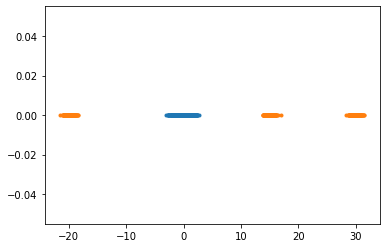

In [5]:
n = 600
n_2 = int(n * 1.0 / 3)

X1 = npr.randn(n).reshape(-1,1) - 0
X21 = 0.6 * npr.randn(n_2).reshape(-1,1) + 30
X22 =  0.6 * npr.randn(n_2).reshape(-1,1) -20
X23 =  0.6 * npr.randn(n_2).reshape(-1,1) + 15

X2 = np.concatenate((X21, X22, X23), axis=0)
X1, X2 = X2, X1

plt.plot(X2.flatten(), [0] * n, '.')
plt.plot(X1.flatten(), [0] * n, '.')

In [12]:
c = cIPFP(X1, X2,  number_time_steps=100, batch_size=600 , step_size = 0.007, weights=[50,30,20], rng = jax.random.PRNGKey(10))

In [13]:
# _, init_params_f = c.b_forward_init(c.rng, (-1, c.dim))                                             
# opt_state_f = c.opt_init_f(init_params_f)


# c.theta_f = c.get_params_f(opt_state_f)
# c.theta_b = c.get_params_f(opt_state_f) 


# c.inner_loss(c.theta_f, next(c.data_stream()), forwards=True);

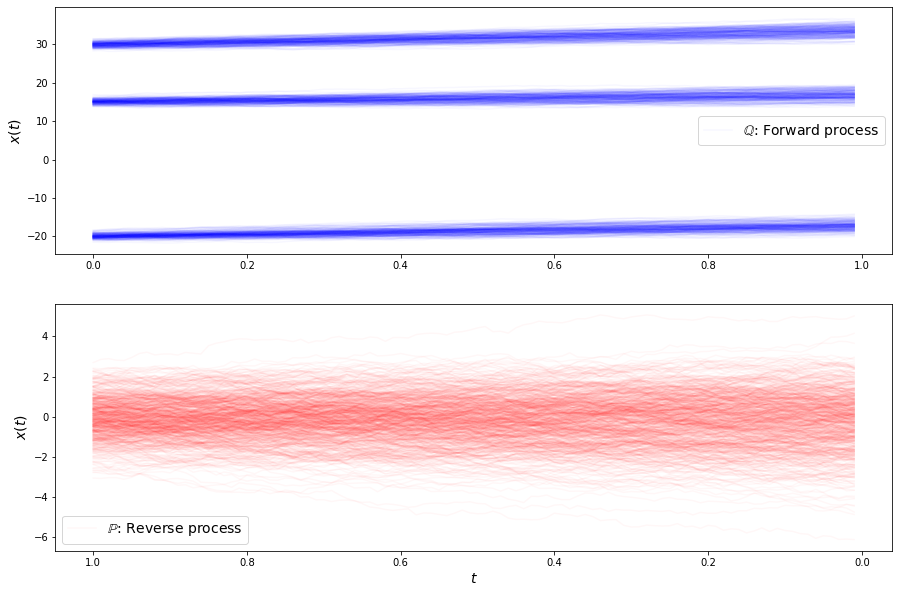

loss b 1498.0206298828125
loss b 1395.09619140625
loss b 1205.8017578125
loss b 1044.2611083984375
loss b 978.19287109375
loss b 702.0082397460938
loss b 572.8071899414062
loss b 516.1870727539062
loss b 404.2373352050781
loss b 298.168701171875
loss b 241.8168182373047
loss b 214.32989501953125
loss b 182.8716278076172
loss b 227.68157958984375
loss b 254.01490783691406
loss b 218.1215057373047
loss b 167.84889221191406
loss b 111.93421936035156
loss b 96.02586364746094
loss b 95.14013671875
loss b 103.04004669189453
loss b 92.58341979980469
loss b 86.38614654541016
loss b 76.75023651123047
loss b 95.38999938964844
loss b 98.45064544677734
loss b 82.74754333496094
loss b 83.24608612060547
loss b 73.19595336914062
loss b 77.55599212646484
loss f 811.7955322265625
loss f 732.6672973632812
loss f 687.4036865234375
loss f 634.33935546875
loss f 581.3820190429688
loss f 511.5310974121094
loss f 442.66009521484375
loss f 377.7669677734375
loss f 317.1358642578125
loss f 256.5589599609375
lo

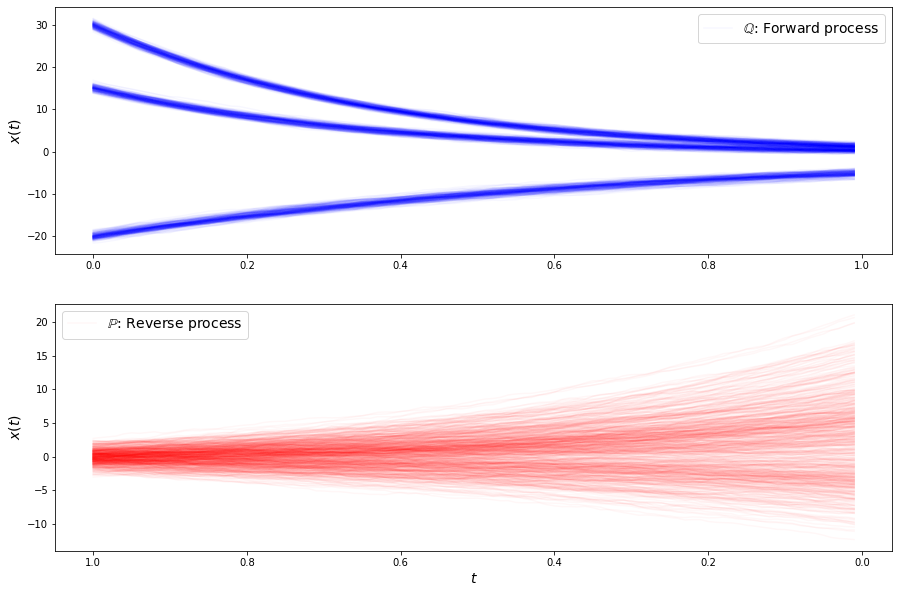

loss b 28.981536865234375
loss b 19.35787582397461
loss b 14.01490306854248
loss b 12.970941543579102
loss b 11.334813117980957
loss b 10.301828384399414
loss b 9.637550354003906
loss b 9.604148864746094
loss b 9.458649635314941
loss b 9.292911529541016
loss b 9.477377891540527
loss b 10.122532844543457
loss b 10.201154708862305
loss b 11.170703887939453
loss b 11.334587097167969
loss b 11.984416961669922
loss b 12.31312084197998
loss b 12.492936134338379
loss b 11.635445594787598
loss b 11.461140632629395
loss b 11.061260223388672
loss b 10.535377502441406
loss b 10.710259437561035
loss b 10.37173080444336
loss b 10.082275390625
loss b 10.026597023010254
loss b 9.960615158081055
loss b 9.446393966674805
loss b 9.5201997756958
loss b 9.610618591308594
loss f 11.292525291442871
loss f 11.166605949401855
loss f 10.084538459777832
loss f 8.995088577270508
loss f 7.805197238922119
loss f 6.510801315307617
loss f 5.19758939743042
loss f 4.1544976234436035
loss f 3.5217196941375732
loss f 2.

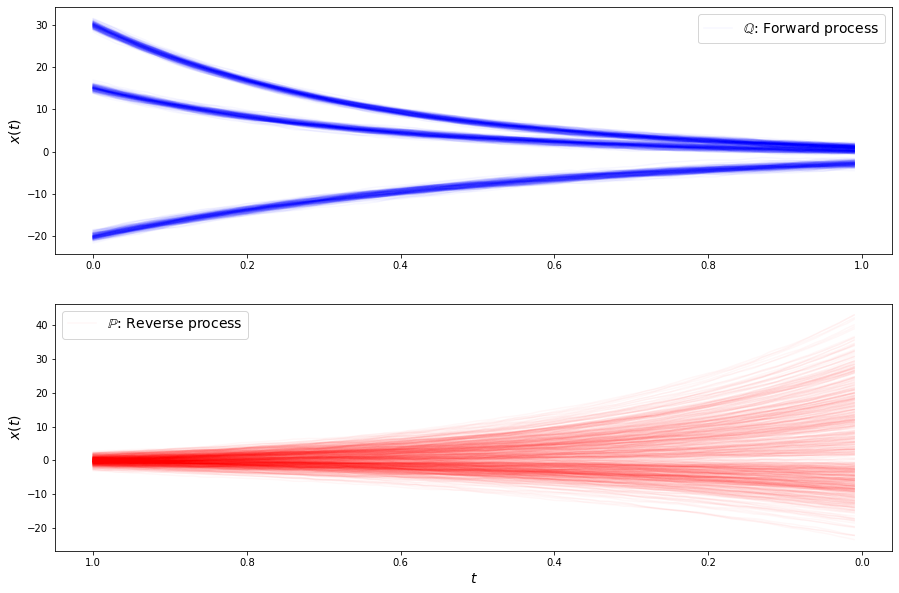

loss b 7.565423011779785
loss b 8.241903305053711
loss b 8.095685005187988
loss b 8.068577766418457
loss b 8.647246360778809
loss b 8.158356666564941
loss b 8.060053825378418
loss b 7.734889030456543
loss b 7.608274459838867
loss b 7.9809651374816895
loss b 7.751535892486572
loss b 8.049784660339355
loss b 8.135894775390625
loss b 7.536864757537842
loss b 7.689732551574707
loss b 7.572957515716553
loss b 7.5006256103515625
loss b 7.744504928588867
loss b 7.6708574295043945
loss b 7.3504958152771
loss b 7.746099472045898
loss b 7.624011039733887
loss b 7.445155620574951
loss b 7.382877826690674
loss b 7.30525541305542
loss b 7.245081901550293
loss b 7.338985443115234
loss b 7.57782506942749
loss b 7.25637149810791
loss b 7.247771739959717
loss f 1.9014452695846558
loss f 1.9624394178390503
loss f 1.9530489444732666
loss f 1.8164751529693604
loss f 1.6527798175811768
loss f 1.5916402339935303
loss f 1.5729701519012451
loss f 1.539337158203125
loss f 1.4652819633483887
loss f 1.4345573186

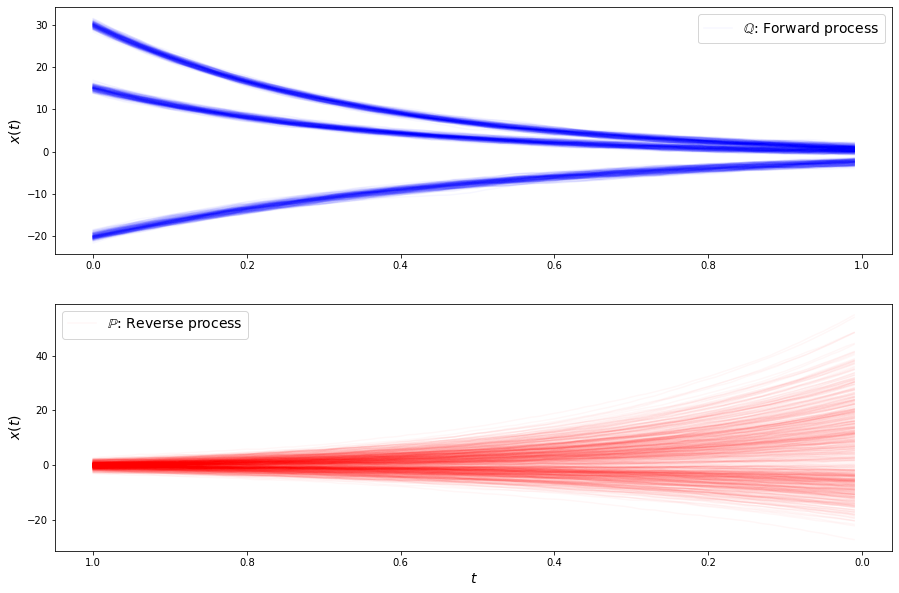

loss b 7.376529216766357
loss b 7.218909740447998
loss b 7.114985942840576
loss b 7.124078273773193
loss b 7.232692241668701
loss b 7.296748638153076
loss b 7.325427055358887
loss b 7.159621715545654
loss b 7.221611976623535
loss b 7.415824890136719
loss b 7.152132034301758
loss b 7.035730361938477
loss b 7.172277927398682
loss b 7.05372428894043
loss b 7.042529106140137
loss b 7.260557651519775
loss b 7.103275775909424
loss b 7.168568134307861
loss b 7.031027317047119
loss b 7.308376312255859
loss b 6.963042259216309
loss b 7.2286272048950195
loss b 6.935112476348877
loss b 6.893911838531494
loss b 7.209630012512207
loss b 7.0174431800842285
loss b 6.637101173400879
loss b 7.008290767669678
loss b 6.865682125091553
loss b 7.018678665161133
loss f 1.4922617673873901
loss f 1.336445927619934
loss f 1.3347400426864624
loss f 1.2670793533325195
loss f 1.2008594274520874
loss f 1.1885207891464233
loss f 1.2354669570922852
loss f 1.2378679513931274
loss f 1.2320053577423096
loss f 1.2304215

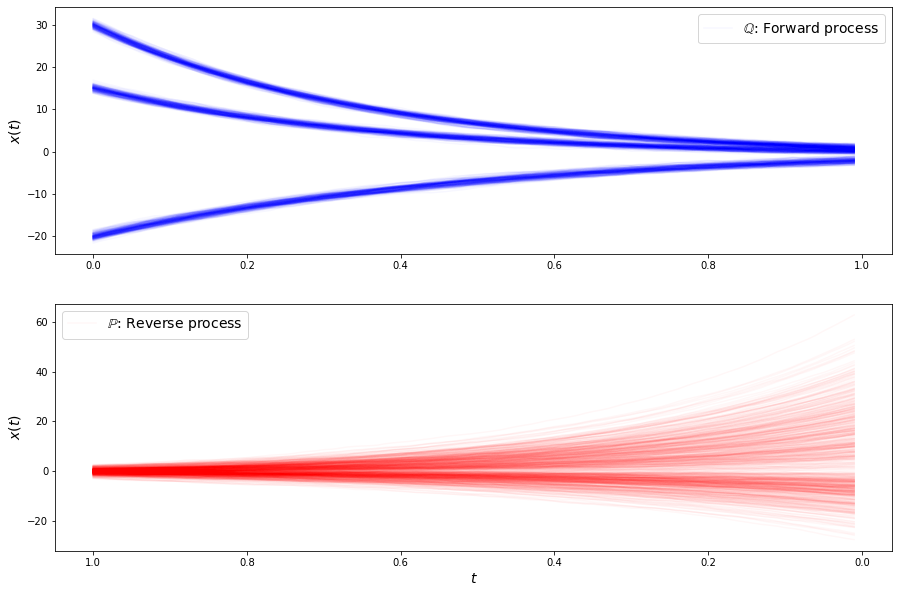

loss b 6.961581707000732
loss b 7.25155782699585
loss b 6.926224231719971
loss b 6.901681900024414
loss b 6.948694229125977
loss b 6.839836597442627
loss b 6.879831790924072
loss b 6.787108898162842
loss b 6.88129997253418
loss b 6.915482044219971
loss b 6.8054351806640625
loss b 6.8787384033203125
loss b 6.739284038543701
loss b 6.679792881011963
loss b 6.735100746154785
loss b 6.81796407699585
loss b 6.60361385345459
loss b 6.806661605834961
loss b 6.885766506195068
loss b 7.005051612854004
loss b 6.721099853515625
loss b 6.555644512176514
loss b 6.68947172164917
loss b 6.6798014640808105
loss b 6.876293659210205
loss b 7.112534046173096
loss b 6.581546306610107
loss b 6.617622375488281
loss b 6.852183818817139
loss b 6.696231365203857
loss f 1.1159369945526123
loss f 1.0873558521270752
loss f 1.0149983167648315
loss f 1.0186647176742554
loss f 0.9590261578559875
loss f 0.9609285593032837
loss f 0.9754400849342346
loss f 0.9768273234367371
loss f 0.9698444604873657
loss f 1.025080323

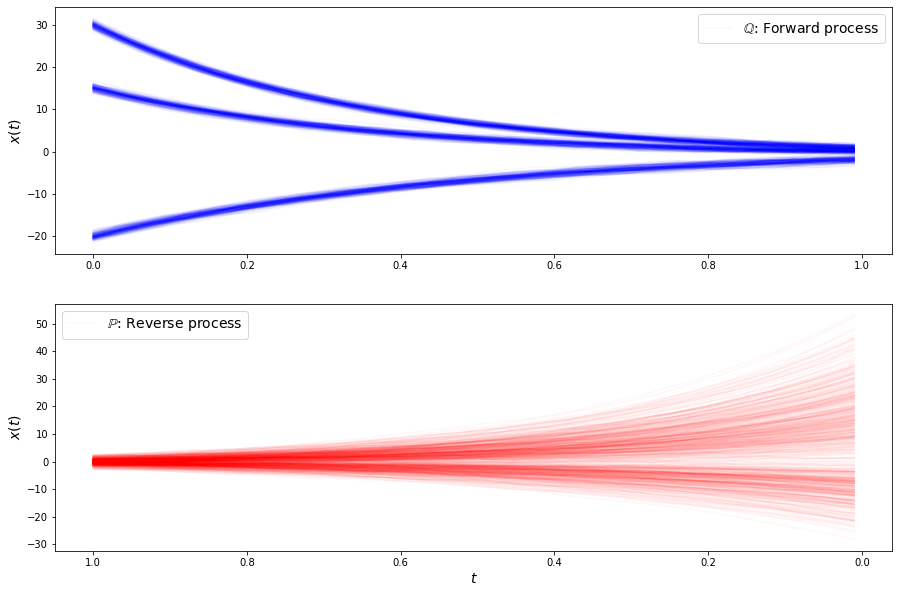

loss b 6.767044544219971
loss b 6.631162643432617
loss b 6.674839496612549
loss b 6.779556751251221
loss b 6.658858299255371
loss b 6.7542901039123535
loss b 6.738304138183594
loss b 6.436427116394043
loss b 6.732888698577881
loss b 6.515607833862305
loss b 6.733067989349365
loss b 6.455995082855225
loss b 6.751606464385986
loss b 6.583117961883545
loss b 6.435024261474609
loss b 6.438005447387695
loss b 6.71627140045166
loss b 6.469890117645264
loss b 6.43191385269165
loss b 6.496315956115723
loss b 6.636881351470947
loss b 6.592665195465088
loss b 6.543197154998779
loss b 6.510577201843262
loss b 6.794388294219971
loss b 6.483388423919678
loss b 6.562358379364014
loss b 6.322051525115967
loss b 6.438055515289307
loss b 6.338749408721924
loss f 0.9750204682350159
loss f 0.9728870391845703
loss f 0.8825011253356934
loss f 0.8819243311882019
loss f 0.8898934125900269
loss f 0.8906787037849426
loss f 0.8818027973175049
loss f 0.8766440749168396
loss f 0.8632416725158691
loss f 0.89417064

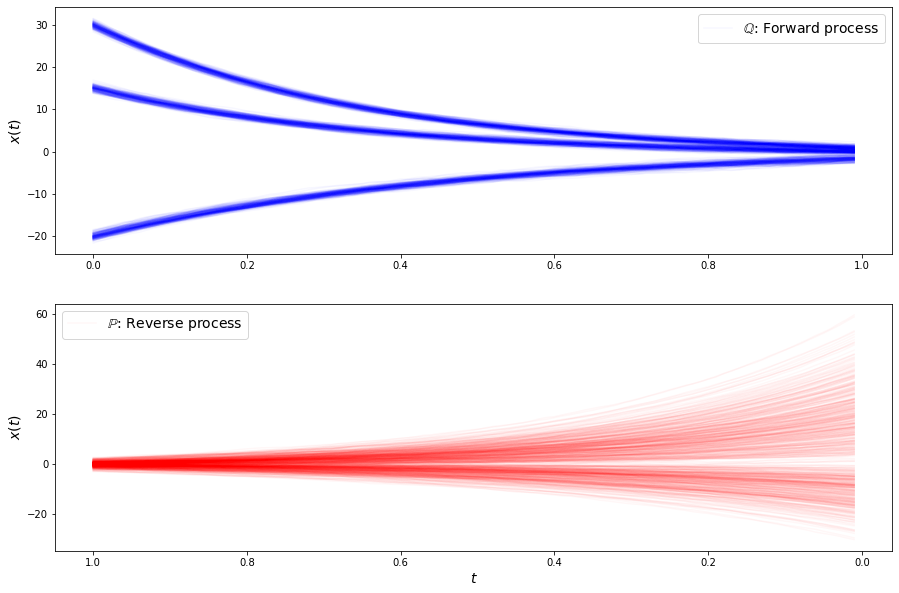

loss b 6.642539024353027
loss b 6.6424946784973145
loss b 6.524702548980713
loss b 6.424684524536133
loss b 6.568129062652588
loss b 6.613834857940674
loss b 6.483536243438721
loss b 6.585561275482178
loss b 6.2274956703186035
loss b 6.431544303894043
loss b 6.451766490936279
loss b 6.4021501541137695
loss b 6.400911331176758
loss b 6.435943126678467
loss b 6.564938068389893
loss b 6.659699440002441
loss b 6.397754669189453
loss b 6.377859115600586
loss b 6.373006820678711
loss b 6.442662715911865
loss b 6.384115219116211
loss b 6.6611647605896
loss b 6.300938129425049
loss b 6.671421527862549
loss b 6.610772132873535
loss b 6.72686243057251
loss b 6.512625694274902
loss b 6.349742889404297
loss b 6.449182033538818
loss b 6.458082675933838
loss f 0.8618621230125427
loss f 0.8110846281051636
loss f 0.8256786465644836
loss f 0.8305040597915649
loss f 0.7773099541664124
loss f 0.7782548666000366
loss f 0.7730327844619751
loss f 0.8206702470779419
loss f 0.7694317102432251
loss f 0.8390111

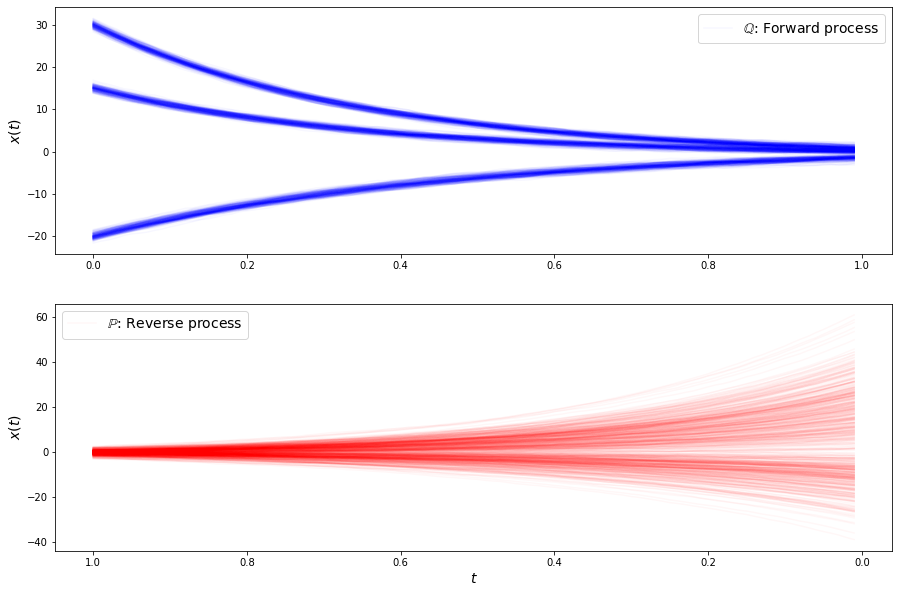

loss b 6.465878963470459
loss b 6.392396450042725
loss b 6.622252941131592
loss b 6.322619915008545
loss b 6.507216453552246
loss b 6.439784049987793
loss b 6.437078952789307
loss b 6.3584136962890625
loss b 6.486566066741943
loss b 6.336284637451172
loss b 6.5359721183776855
loss b 6.535702228546143
loss b 6.407313346862793
loss b 6.307610511779785
loss b 6.195356845855713
loss b 6.299264430999756
loss b 6.598930358886719
loss b 6.489355087280273
loss b 6.337471008300781
loss b 6.567163944244385
loss b 6.160717964172363
loss b 6.284817218780518
loss b 6.242599964141846
loss b 6.315395355224609
loss b 6.401330471038818
loss b 6.290675640106201
loss b 6.367391586303711
loss b 6.243965148925781
loss b 6.575605392456055
loss b 6.448970794677734
loss f 0.7701849937438965
loss f 0.7930504083633423
loss f 0.7921409606933594
loss f 0.7641035318374634
loss f 0.7617303133010864
loss f 0.7007913589477539
loss f 0.7271034121513367
loss f 0.729535698890686
loss f 0.7076901793479919
loss f 0.737240

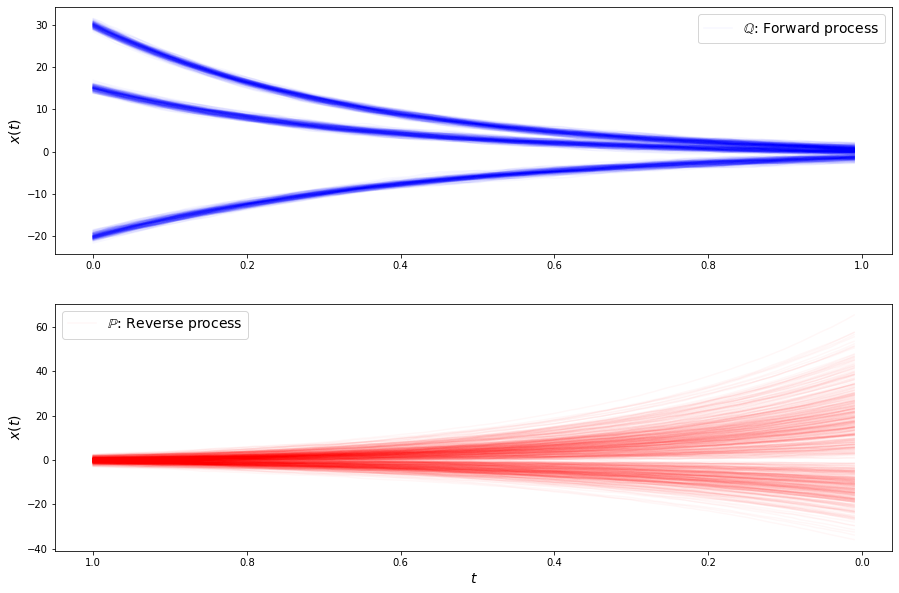

loss b 6.303372383117676
loss b 6.248091697692871
loss b 6.394252300262451
loss b 6.4728240966796875
loss b 6.437731742858887
loss b 6.177173614501953
loss b 6.309715270996094
loss b 6.449868679046631
loss b 6.171684265136719
loss b 6.496538162231445
loss b 6.125666618347168
loss b 6.598156452178955
loss b 6.2130126953125
loss b 6.220118045806885
loss b 6.108279228210449
loss b 6.493617534637451
loss b 6.260514736175537
loss b 6.566866874694824
loss b 6.137054920196533
loss b 6.412898540496826
loss b 6.276395797729492
loss b 6.495948791503906
loss b 6.14872932434082
loss b 6.119445323944092
loss b 6.329042911529541
loss b 6.1827569007873535
loss b 6.485197067260742
loss b 6.243972301483154
loss b 6.236146450042725
loss b 6.363272190093994
loss f 0.7547760605812073
loss f 0.7300846576690674
loss f 0.7124351859092712
loss f 0.6982607841491699
loss f 0.6967888474464417
loss f 0.7071653008460999
loss f 0.6792203783988953
loss f 0.6841446757316589
loss f 0.6797317266464233
loss f 0.71639579

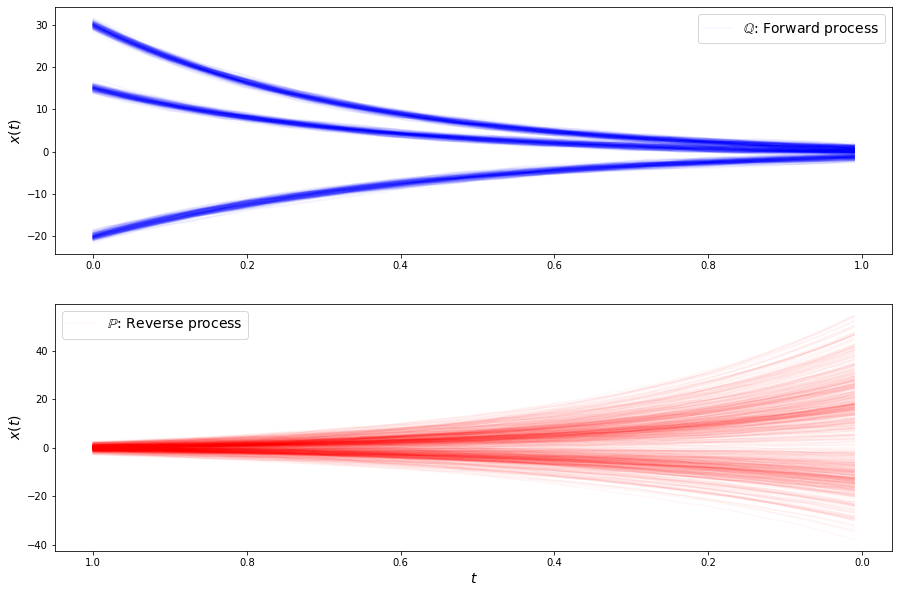

loss b 6.2719902992248535
loss b 6.185962677001953
loss b 6.24083948135376
loss b 6.27085018157959
loss b 6.164974212646484
loss b 6.2500224113464355
loss b 6.0850090980529785
loss b 6.31101655960083
loss b 6.287207126617432
loss b 6.261699199676514
loss b 6.169456958770752
loss b 6.148115158081055
loss b 6.232030391693115
loss b 6.376795291900635
loss b 6.331745624542236
loss b 6.408205509185791
loss b 6.194731712341309
loss b 6.219740867614746
loss b 6.208625793457031
loss b 6.427718162536621
loss b 6.300237655639648
loss b 6.1092658042907715
loss b 6.191730499267578
loss b 6.41890811920166
loss b 6.146396636962891
loss b 6.084237575531006
loss b 6.213964462280273
loss b 6.203395366668701
loss b 6.42912483215332
loss b 6.132108211517334
loss f 0.7222362160682678
loss f 0.7197350859642029
loss f 0.6770155429840088
loss f 0.6898274421691895
loss f 0.6769217252731323
loss f 0.6786870956420898
loss f 0.6769357919692993
loss f 0.6657894849777222
loss f 0.6757262349128723
loss f 0.71803313

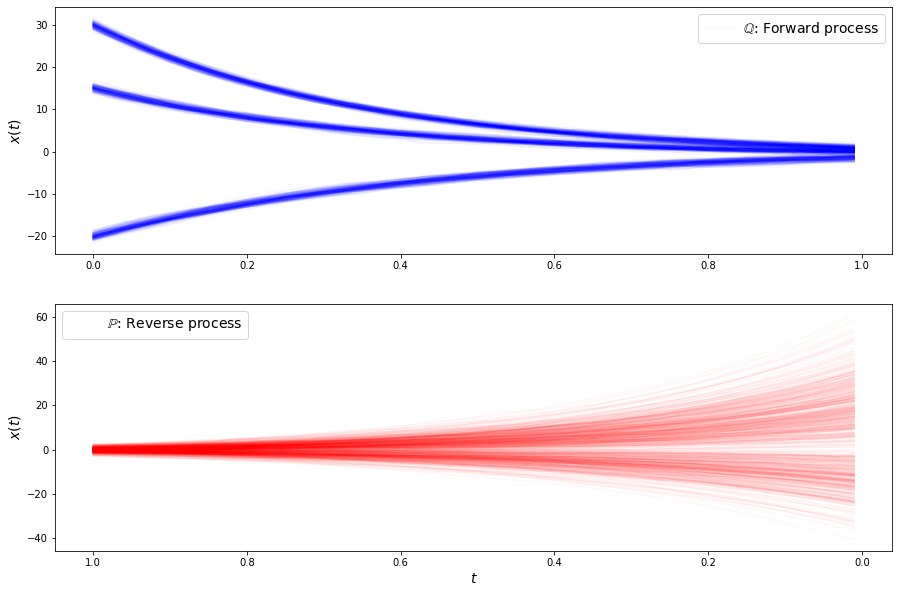

loss b 226.34786987304688
loss b 152.308349609375
loss b 113.13267517089844
loss b 89.511474609375
loss b 81.22969818115234
loss b 73.25888061523438
loss b 71.0593032836914
loss b 65.84050750732422
loss b 65.87200164794922
loss b 64.37882995605469
loss b 64.59059143066406
loss b 63.32530975341797
loss b 62.079715728759766
loss b 64.30813598632812
loss b 62.66685485839844
loss b 61.672855377197266
loss b 62.63673400878906
loss b 62.427921295166016
loss b 63.457576751708984
loss b 63.480812072753906
loss b 63.58705139160156
loss b 63.84218215942383
loss b 64.02277374267578
loss b 63.29424285888672
loss b 63.554893493652344
loss b 63.33225631713867
loss b 63.19256591796875
loss b 63.54252243041992
loss b 62.97148895263672
loss b 63.45309066772461
loss f 164.6996612548828
loss f 153.47586059570312
loss f 141.23597717285156
loss f 128.7287139892578
loss f 116.1081771850586
loss f 104.96292114257812
loss f 94.41380310058594
loss f 85.50194549560547
loss f 78.97755432128906
loss f 74.07350921

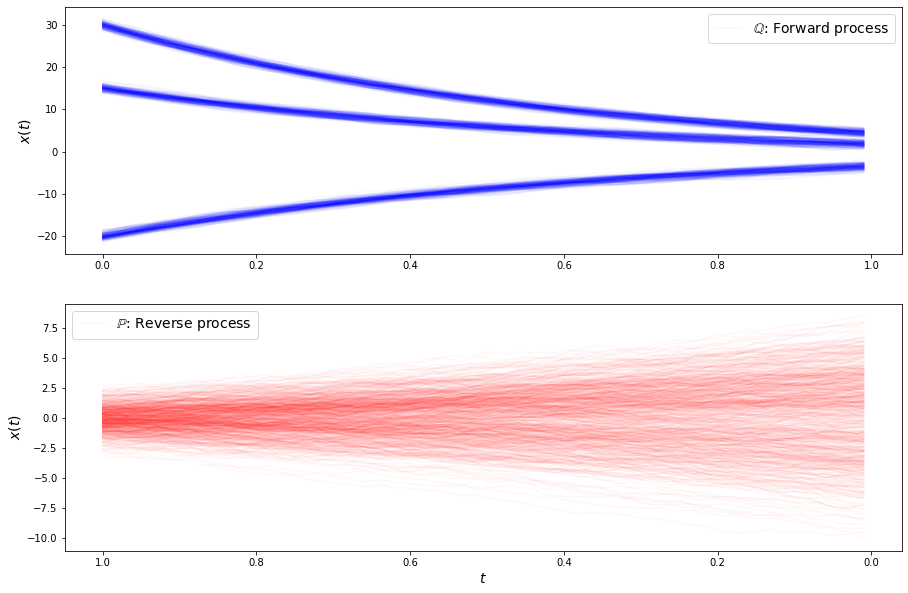

loss b 62.582984924316406
loss b 62.06611251831055
loss b 61.831092834472656
loss b 62.53487777709961
loss b 61.722442626953125
loss b 61.900184631347656
loss b 61.55939865112305
loss b 61.13287353515625
loss b 60.303367614746094
loss b 60.465633392333984
loss b 61.012542724609375
loss b 59.343204498291016
loss b 59.92323303222656
loss b 59.957706451416016
loss b 59.478355407714844
loss b 59.06513977050781
loss b 59.023345947265625
loss b 59.062721252441406
loss b 58.279693603515625
loss b 58.51662826538086
loss b 57.74518966674805
loss b 58.43241500854492
loss b 57.31894302368164
loss b 57.246482849121094
loss b 57.28438186645508
loss b 56.07832336425781
loss b 55.223045349121094
loss b 56.491127014160156
loss b 55.17966842651367
loss b 54.522056579589844
loss f 54.280216217041016
loss f 54.26566696166992
loss f 54.773223876953125
loss f 55.253116607666016
loss f 54.854976654052734
loss f 54.35056686401367
loss f 53.86545944213867
loss f 53.4385871887207
loss f 51.75545120239258
loss 

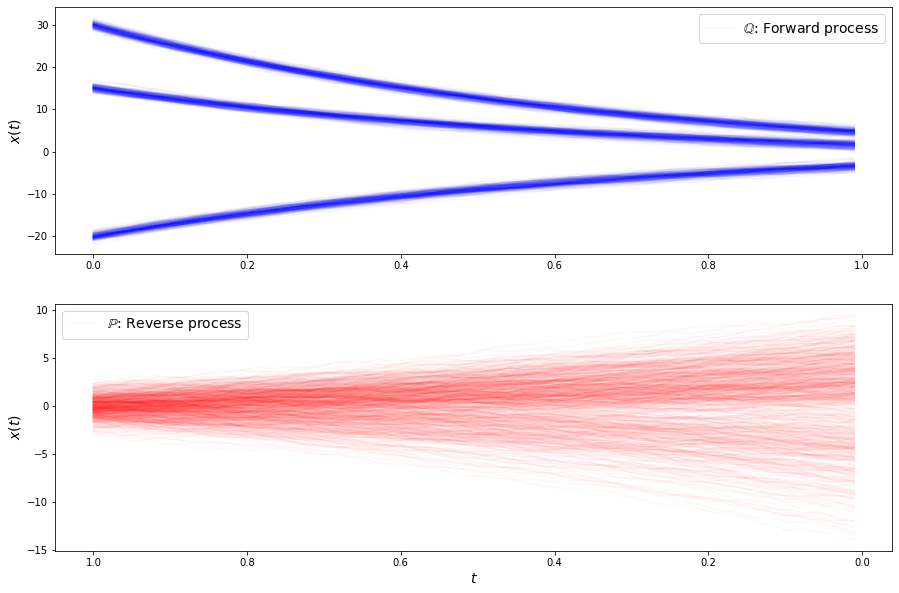

loss b 53.97575378417969
loss b 54.853431701660156
loss b 53.62832260131836
loss b 54.10341262817383
loss b 53.04777145385742
loss b 53.145599365234375
loss b 52.06037902832031
loss b 51.47373962402344
loss b 50.44392776489258
loss b 51.045562744140625
loss b 51.10210418701172
loss b 49.62257766723633
loss b 49.14125442504883
loss b 48.32590103149414
loss b 48.82980728149414
loss b 47.78529357910156
loss b 47.999839782714844
loss b 46.71522903442383
loss b 46.71222686767578
loss b 46.214813232421875
loss b 45.78407287597656
loss b 44.29151916503906
loss b 44.52146911621094
loss b 44.19667434692383
loss b 42.75335693359375
loss b 42.11203384399414
loss b 41.6196174621582
loss b 40.84030532836914
loss b 40.59375
loss b 39.207515716552734
loss f 25.77187156677246
loss f 25.011423110961914
loss f 24.093891143798828
loss f 23.995149612426758
loss f 23.229318618774414
loss f 22.885629653930664
loss f 22.532978057861328
loss f 22.48795509338379
loss f 22.736555099487305
loss f 22.743900299072

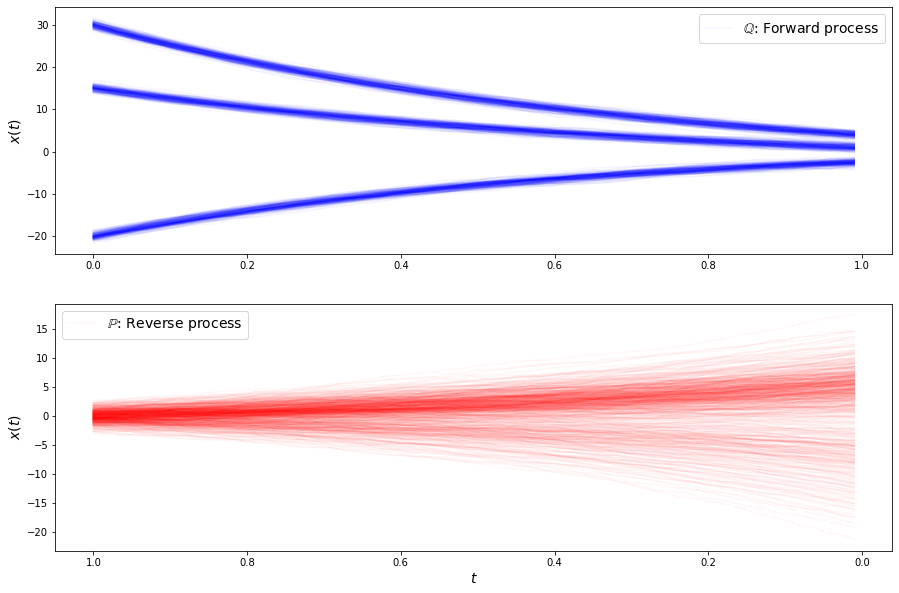

loss b 40.56300735473633
loss b 38.836631774902344
loss b 37.708194732666016
loss b 36.786163330078125
loss b 35.70252227783203
loss b 35.11819839477539
loss b 33.45384979248047
loss b 34.11125946044922
loss b 32.86430740356445
loss b 32.2026481628418
loss b 30.645883560180664
loss b 29.739992141723633
loss b 30.411611557006836
loss b 29.77288246154785
loss b 27.339685440063477
loss b 27.709169387817383
loss b 26.837299346923828
loss b 26.561466217041016
loss b 24.739906311035156
loss b 24.081897735595703
loss b 23.38069725036621
loss b 23.155654907226562
loss b 23.311838150024414
loss b 22.930561065673828
loss b 22.146718978881836
loss b 21.73871612548828
loss b 21.374656677246094
loss b 20.424240112304688
loss b 20.579824447631836
loss b 20.039043426513672
loss f 14.331881523132324
loss f 11.723373413085938
loss f 9.26419734954834
loss f 6.973618030548096
loss f 5.540653705596924
loss f 4.48429536819458
loss f 3.9792964458465576
loss f 3.8413565158843994
loss f 3.7948505878448486
los

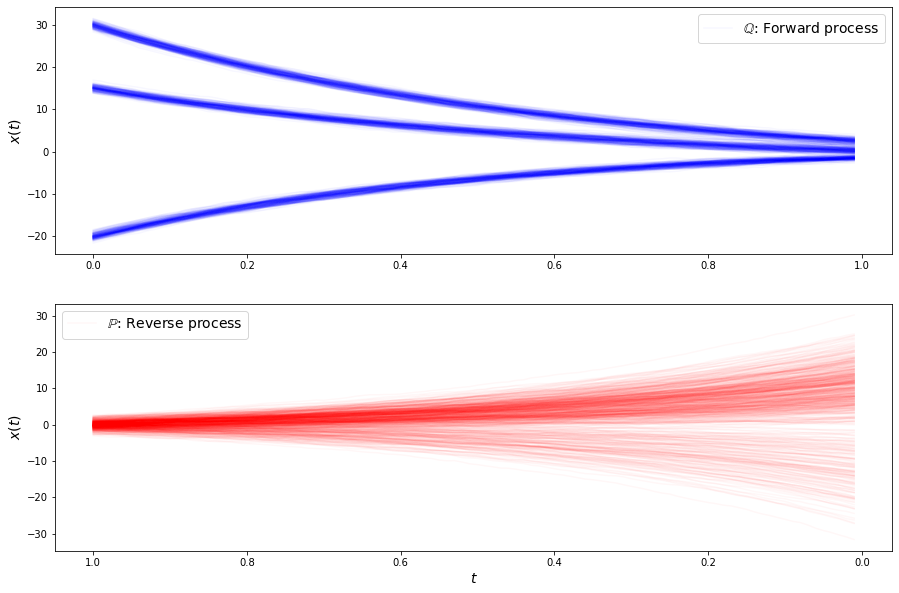

loss b 17.4655818939209
loss b 18.22188949584961
loss b 17.616464614868164
loss b 17.689571380615234
loss b 16.479846954345703
loss b 17.5930233001709
loss b 16.01099395751953
loss b 16.392215728759766
loss b 16.783885955810547
loss b 16.553871154785156
loss b 14.386476516723633
loss b 15.697041511535645
loss b 15.59509563446045
loss b 15.856639862060547
loss b 15.116170883178711
loss b 15.367321968078613
loss b 15.604645729064941
loss b 14.864591598510742
loss b 15.286191940307617
loss b 15.247660636901855
loss b 14.726633071899414
loss b 14.962647438049316
loss b 15.140241622924805
loss b 15.487405776977539
loss b 13.798630714416504
loss b 15.114263534545898
loss b 15.007390022277832
loss b 14.038283348083496
loss b 13.754878044128418
loss b 14.181549072265625
loss f 4.551785945892334
loss f 4.340518951416016
loss f 3.871488094329834
loss f 3.5492351055145264
loss f 3.2320945262908936
loss f 2.6059770584106445
loss f 2.4418530464172363
loss f 2.155224561691284
loss f 2.00158476829528

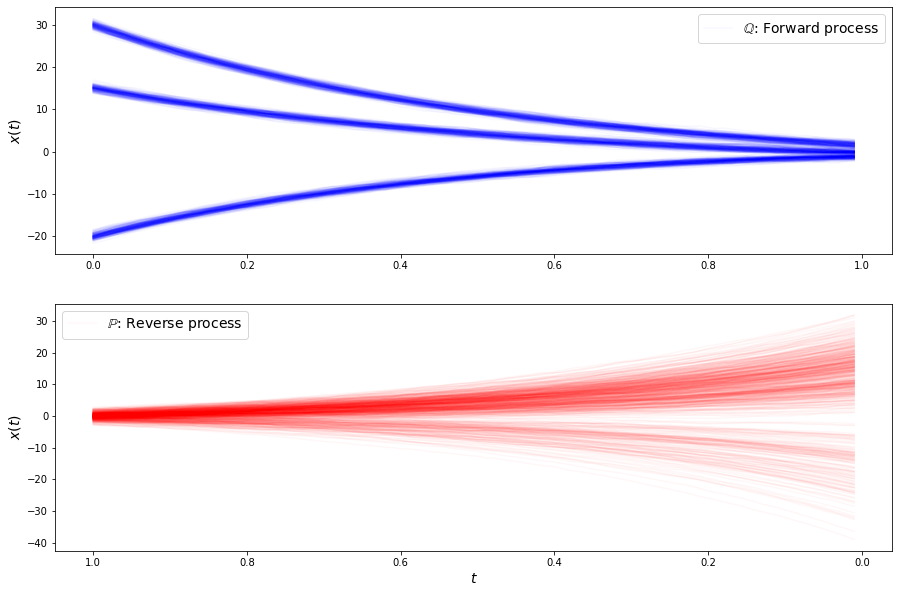

loss b 14.201748847961426
loss b 14.19112491607666
loss b 14.625869750976562
loss b 13.705483436584473
loss b 14.364666938781738
loss b 13.488079071044922
loss b 13.369183540344238
loss b 14.47714614868164
loss b 13.20911979675293
loss b 13.911419868469238
loss b 14.009194374084473
loss b 13.606170654296875
loss b 14.04729175567627
loss b 12.26321792602539
loss b 12.771827697753906
loss b 13.043396949768066
loss b 13.343570709228516
loss b 12.027819633483887
loss b 13.434466361999512
loss b 12.410431861877441
loss b 13.09766960144043
loss b 12.304571151733398
loss b 12.958455085754395
loss b 12.244905471801758
loss b 13.957275390625
loss b 12.828130722045898
loss b 12.46578598022461
loss b 12.727179527282715
loss b 12.186358451843262
loss b 12.063614845275879
loss f 1.7450802326202393
loss f 1.697489619255066
loss f 1.6929421424865723
loss f 1.6818102598190308
loss f 1.596540927886963
loss f 1.5294373035430908
loss f 1.4400956630706787
loss f 1.3998887538909912
loss f 1.387575268745422

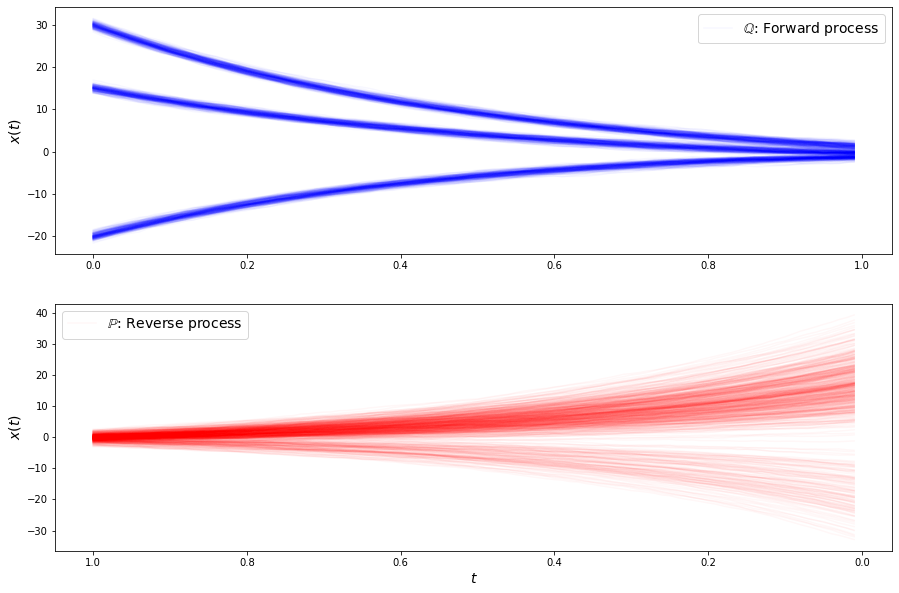

loss b 10.766763687133789
loss b 12.561763763427734
loss b 12.350975036621094
loss b 12.448108673095703
loss b 13.419952392578125
loss b 12.66681957244873
loss b 12.577385902404785
loss b 12.655513763427734
loss b 12.14911937713623
loss b 11.559242248535156
loss b 12.199068069458008
loss b 12.43673324584961
loss b 11.896114349365234
loss b 11.983269691467285
loss b 11.336287498474121
loss b 13.33979320526123
loss b 11.918783187866211
loss b 12.315056800842285
loss b 12.174559593200684
loss b 11.667024612426758
loss b 11.806833267211914
loss b 13.005066871643066
loss b 10.982074737548828
loss b 11.764512062072754
loss b 12.049598693847656
loss b 11.348098754882812
loss b 11.864652633666992
loss b 11.538069725036621
loss b 12.081238746643066
loss b 11.619843482971191
loss f 1.2013376951217651
loss f 1.1187955141067505
loss f 1.179749608039856
loss f 1.1477748155593872
loss f 1.1524969339370728
loss f 1.122926950454712
loss f 1.0744514465332031
loss f 1.0820378065109253
loss f 1.081372857

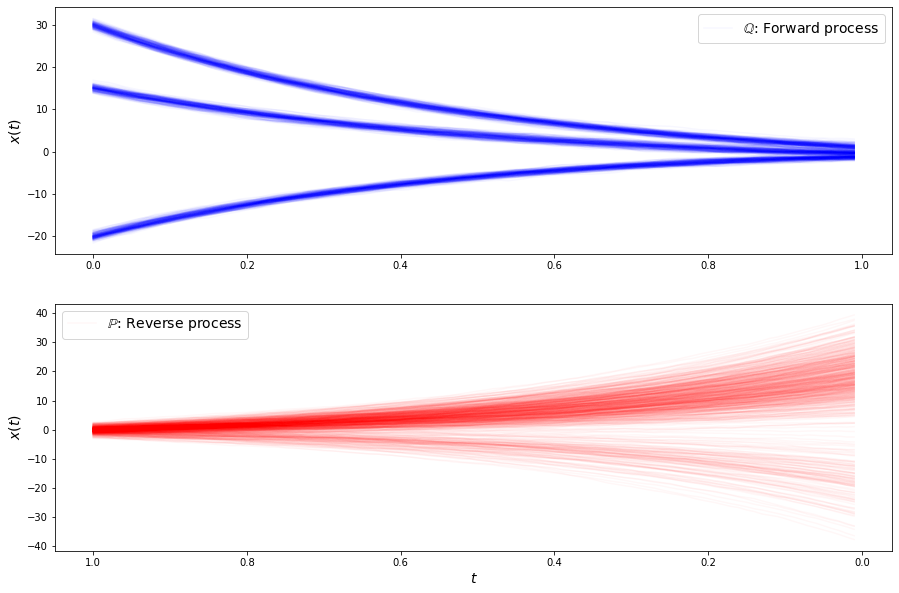

loss b 11.13494873046875
loss b 11.756580352783203
loss b 10.721358299255371
loss b 11.605121612548828
loss b 11.892182350158691
loss b 11.599163055419922
loss b 11.669663429260254
loss b 12.004019737243652
loss b 11.660027503967285
loss b 11.928278923034668
loss b 11.861970901489258
loss b 12.546168327331543
loss b 11.29609489440918
loss b 11.885065078735352
loss b 11.251141548156738
loss b 11.105439186096191
loss b 11.061234474182129
loss b 11.356346130371094
loss b 11.10972785949707
loss b 12.017772674560547
loss b 11.505313873291016
loss b 11.689180374145508
loss b 11.527472496032715
loss b 11.288381576538086
loss b 11.128060340881348
loss b 11.842146873474121
loss b 10.688061714172363
loss b 11.872870445251465
loss b 10.987081527709961
loss b 10.923192977905273
loss f 0.9870725870132446
loss f 1.018487811088562
loss f 1.0469173192977905
loss f 0.9941784739494324
loss f 1.0435434579849243
loss f 0.9783613681793213
loss f 1.0298434495925903
loss f 0.987221360206604
loss f 1.00708580

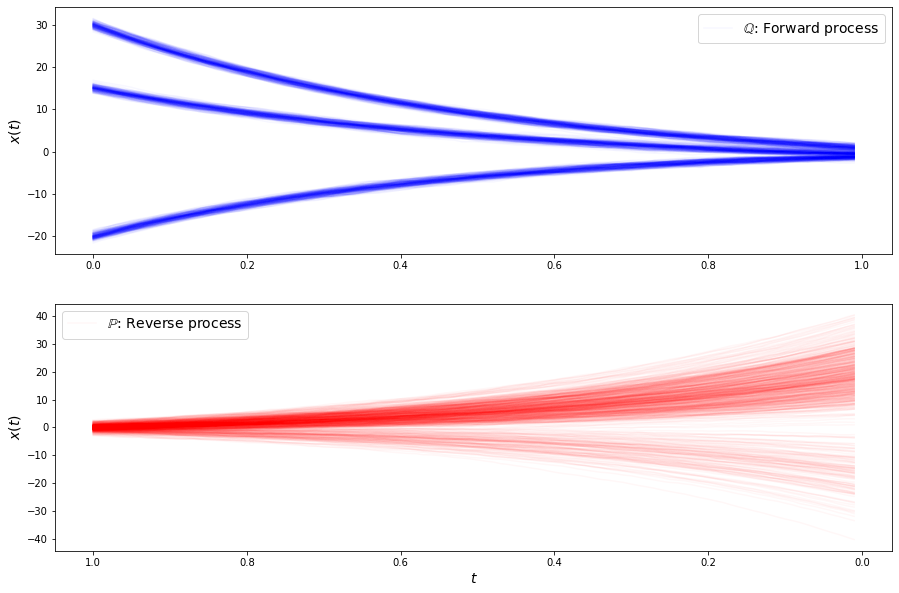

loss b 10.653722763061523
loss b 10.881763458251953
loss b 11.947778701782227
loss b 11.698956489562988
loss b 11.22308349609375
loss b 11.151926040649414
loss b 10.343856811523438
loss b 11.511602401733398
loss b 11.106356620788574
loss b 10.743844985961914
loss b 10.981703758239746
loss b 11.356566429138184
loss b 10.646024703979492
loss b 11.15355396270752
loss b 10.415763854980469
loss b 10.790227890014648
loss b 11.473159790039062
loss b 10.648280143737793
loss b 10.900809288024902
loss b 11.833999633789062
loss b 11.145012855529785
loss b 10.917521476745605
loss b 10.869489669799805
loss b 11.049508094787598
loss b 11.148155212402344
loss b 11.271357536315918
loss b 11.351996421813965
loss b 11.280774116516113
loss b 11.172901153564453
loss b 11.012092590332031
loss f 1.0229436159133911
loss f 1.0397670269012451
loss f 1.040942668914795
loss f 1.0111150741577148
loss f 1.0143009424209595
loss f 0.9486463665962219
loss f 0.9533433318138123
loss f 0.9594846963882446
loss f 1.033166

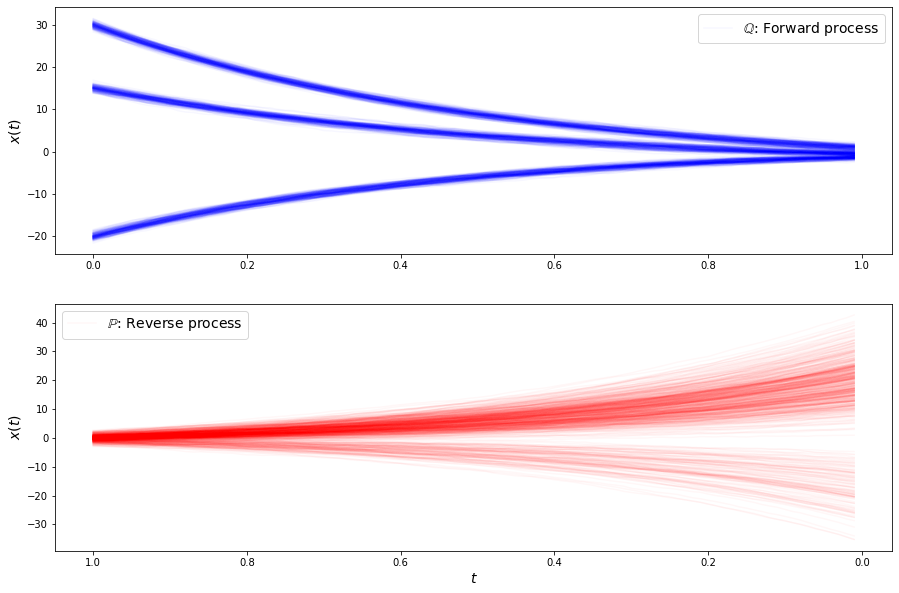

loss b 11.307710647583008
loss b 10.25718879699707
loss b 11.124598503112793
loss b 10.986618041992188
loss b 11.037322044372559
loss b 10.453166961669922
loss b 10.836945533752441
loss b 10.900066375732422
loss b 10.932191848754883
loss b 10.8803129196167
loss b 10.75739860534668
loss b 10.583728790283203
loss b 10.716669082641602
loss b 11.303040504455566
loss b 10.738851547241211
loss b 10.269841194152832
loss b 11.659640312194824
loss b 10.557473182678223
loss b 11.400655746459961
loss b 11.911880493164062
loss b 10.866389274597168
loss b 10.564691543579102
loss b 10.461551666259766
loss b 11.583955764770508
loss b 11.40013313293457
loss b 10.85483169555664
loss b 10.803813934326172
loss b 11.462377548217773
loss b 10.146418571472168
loss b 11.779542922973633
loss f 0.8679521083831787
loss f 0.8854451179504395
loss f 0.9593387246131897
loss f 0.8511263132095337
loss f 0.9382749795913696
loss f 0.878849983215332
loss f 0.9118497967720032
loss f 0.909572422504425
loss f 0.91862255334

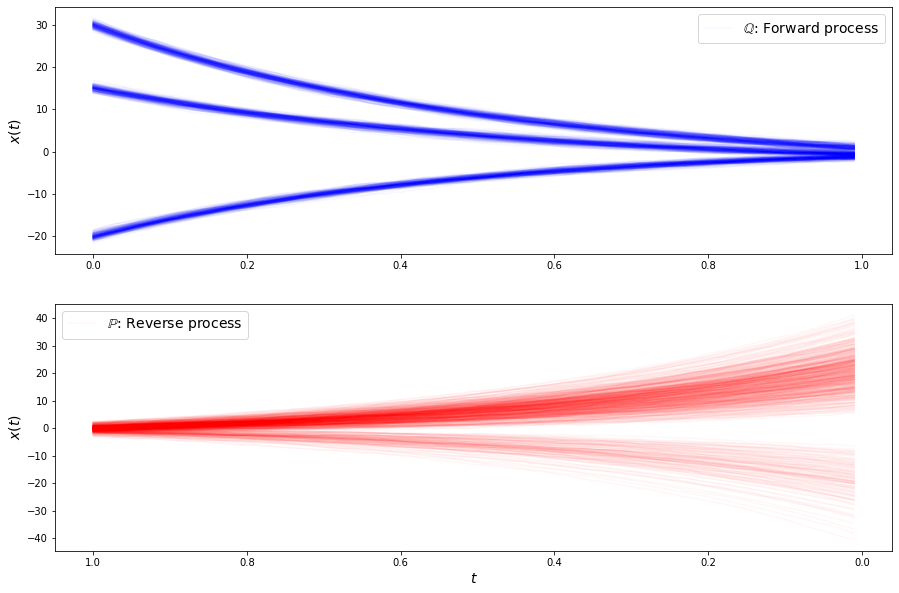

loss b 10.662829399108887
loss b 11.96157455444336
loss b 10.339251518249512
loss b 10.90867805480957
loss b 11.303564071655273
loss b 11.239249229431152
loss b 11.117217063903809
loss b 11.270271301269531
loss b 11.059516906738281
loss b 10.915486335754395
loss b 11.442421913146973
loss b 10.929354667663574
loss b 10.844663619995117
loss b 10.744965553283691
loss b 10.55560302734375
loss b 11.055299758911133
loss b 10.583803176879883
loss b 10.464678764343262
loss b 10.205594062805176
loss b 10.952455520629883
loss b 10.776137351989746
loss b 10.622651100158691
loss b 10.773285865783691
loss b 10.887718200683594
loss b 10.540895462036133
loss b 10.871733665466309
loss b 10.715713500976562
loss b 10.787413597106934
loss b 10.800057411193848
loss b 10.355881690979004
loss f 1.0813045501708984
loss f 1.012287974357605
loss f 1.0393037796020508
loss f 1.1449390649795532
loss f 1.003318190574646
loss f 1.0182384252548218
loss f 1.0763715505599976
loss f 0.998721182346344
loss f 1.049693822

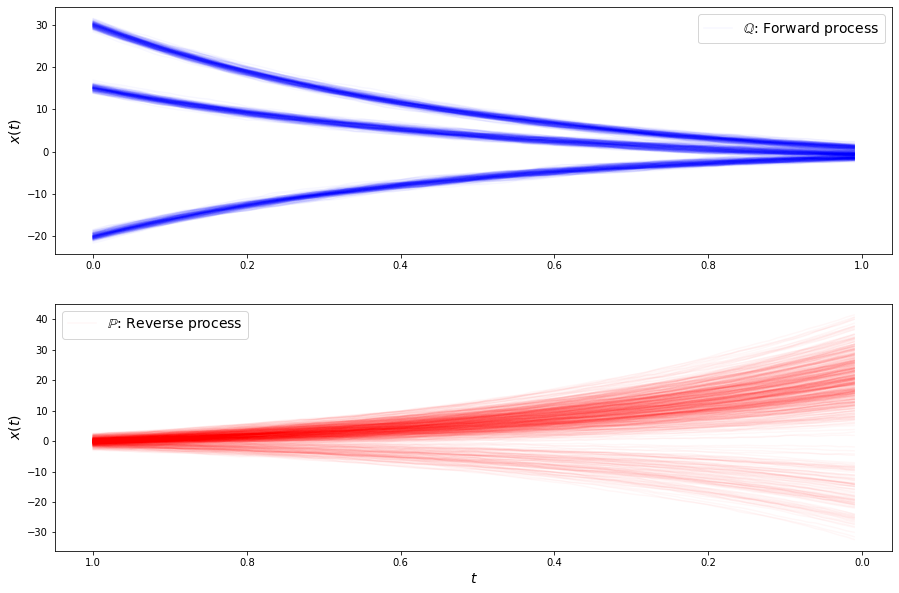

loss b 10.748713493347168
loss b 10.362446784973145
loss b 10.731534957885742
loss b 10.076183319091797
loss b 10.077078819274902
loss b 10.265120506286621
loss b 10.589000701904297
loss b 10.706256866455078
loss b 10.358036041259766
loss b 10.948307991027832
loss b 10.614908218383789
loss b 11.13898754119873
loss b 11.314532279968262
loss b 10.726068496704102
loss b 10.5990629196167
loss b 10.312018394470215
loss b 10.749963760375977
loss b 10.246376991271973
loss b 10.13759708404541
loss b 10.707658767700195
loss b 10.543985366821289
loss b 10.879146575927734
loss b 11.203057289123535
loss b 10.627640724182129
loss b 10.366819381713867
loss b 10.372035026550293
loss b 10.521224975585938
loss b 10.458592414855957
loss b 10.937176704406738
loss b 11.196454048156738
loss f 0.9194964170455933
loss f 0.9631562232971191
loss f 0.9865664839744568
loss f 0.9540186524391174
loss f 0.9535940289497375
loss f 0.9325982928276062
loss f 0.9910054802894592
loss f 0.9660595655441284
loss f 0.9640458

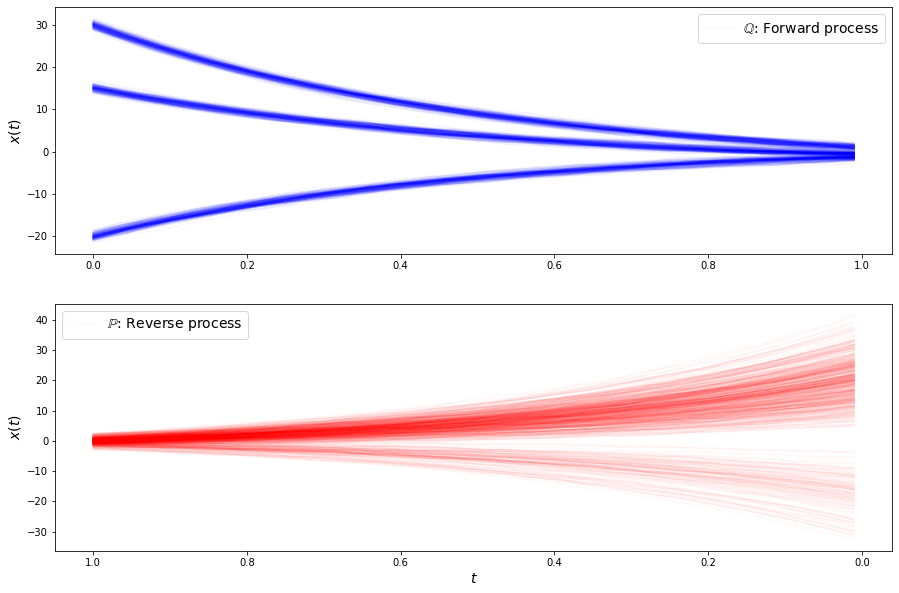

loss b 10.932629585266113
loss b 10.261589050292969
loss b 10.46241569519043
loss b 10.869333267211914
loss b 10.927244186401367
loss b 10.543830871582031
loss b 11.283679962158203
loss b 10.646636009216309
loss b 10.04146671295166
loss b 10.65771770477295
loss b 10.494874000549316
loss b 10.714925765991211
loss b 10.764322280883789
loss b 10.628692626953125
loss b 11.02348518371582
loss b 10.43535041809082
loss b 10.672289848327637
loss b 10.278603553771973
loss b 10.270020484924316
loss b 10.62413501739502
loss b 10.40063762664795
loss b 10.523392677307129
loss b 10.806411743164062
loss b 10.261788368225098
loss b 10.105978012084961
loss b 10.353487968444824
loss b 10.057693481445312
loss b 10.387054443359375
loss b 10.175116539001465
loss b 10.068826675415039
loss f 1.1181259155273438
loss f 1.0611463785171509
loss f 1.1196117401123047
loss f 1.0784573554992676
loss f 1.071374773979187
loss f 1.0152753591537476
loss f 1.0668740272521973
loss f 1.0055837631225586
loss f 1.03067624568

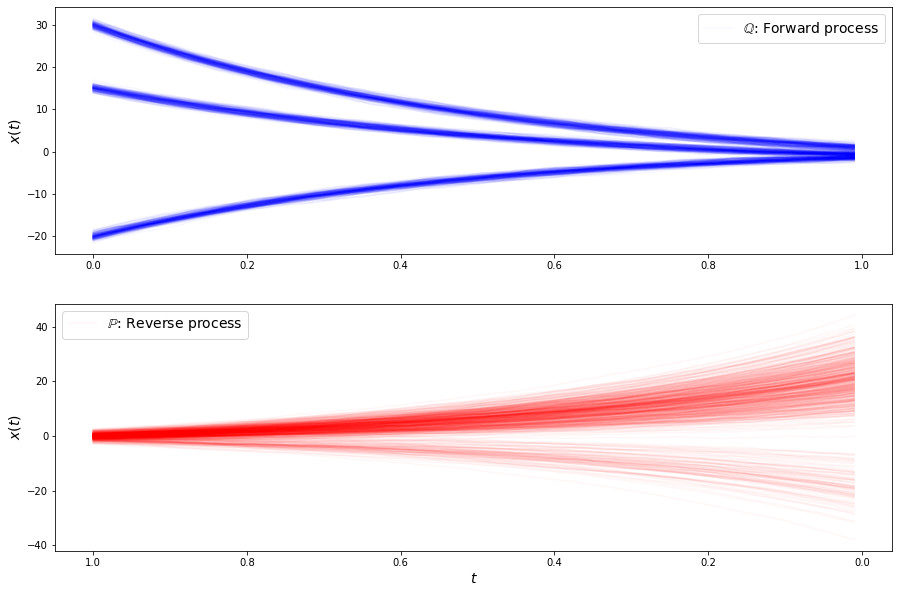

loss b 10.302594184875488
loss b 10.424960136413574
loss b 10.583815574645996
loss b 10.317248344421387
loss b 10.196414947509766
loss b 10.29879093170166
loss b 10.198786735534668
loss b 10.38681411743164
loss b 9.91521167755127
loss b 9.803855895996094
loss b 10.285882949829102
loss b 10.489624977111816
loss b 10.282636642456055
loss b 10.675174713134766
loss b 10.175032615661621
loss b 10.323824882507324
loss b 10.538637161254883
loss b 10.27003288269043
loss b 9.783048629760742
loss b 10.311105728149414
loss b 10.770236015319824
loss b 9.670782089233398
loss b 10.069528579711914
loss b 10.515242576599121
loss b 10.284332275390625
loss b 10.656110763549805
loss b 10.096977233886719
loss b 10.595503807067871
loss b 10.032869338989258
loss b 10.48139762878418
loss f 1.0620464086532593
loss f 0.98356693983078
loss f 1.0354138612747192
loss f 0.9781439900398254
loss f 1.0134148597717285
loss f 1.0121362209320068
loss f 0.9998810887336731
loss f 1.021336555480957
loss f 1.012483716011047

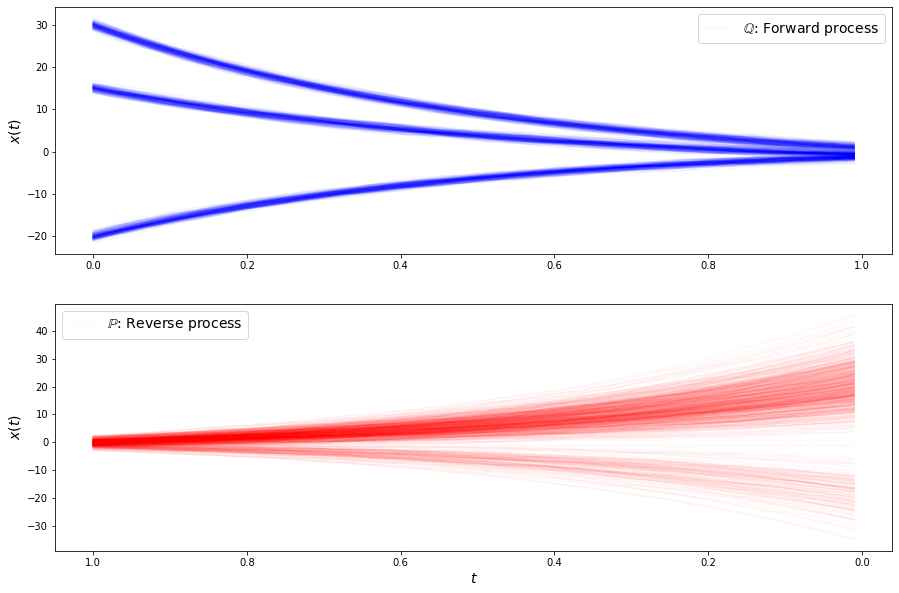

loss b 10.228809356689453
loss b 9.689491271972656
loss b 10.327942848205566
loss b 10.617036819458008
loss b 9.768194198608398
loss b 10.1491117477417
loss b 10.155328750610352
loss b 9.986879348754883
loss b 9.722054481506348
loss b 10.13227367401123
loss b 10.309965133666992
loss b 10.424356460571289
loss b 10.177492141723633
loss b 10.156717300415039
loss b 10.898906707763672
loss b 10.234244346618652
loss b 9.6196928024292
loss b 11.011362075805664
loss b 10.417610168457031
loss b 10.269960403442383
loss b 10.270088195800781
loss b 9.652714729309082
loss b 9.434142112731934
loss b 10.620491981506348
loss b 9.516352653503418
loss b 9.85130500793457
loss b 10.283679008483887
loss b 10.717191696166992
loss b 9.786593437194824
loss b 9.922036170959473
loss f 1.0476199388504028
loss f 1.027903437614441
loss f 0.9939965009689331
loss f 1.0127602815628052
loss f 1.104557752609253
loss f 0.9979420900344849
loss f 1.0244234800338745
loss f 1.0199235677719116
loss f 1.0226682424545288
loss 

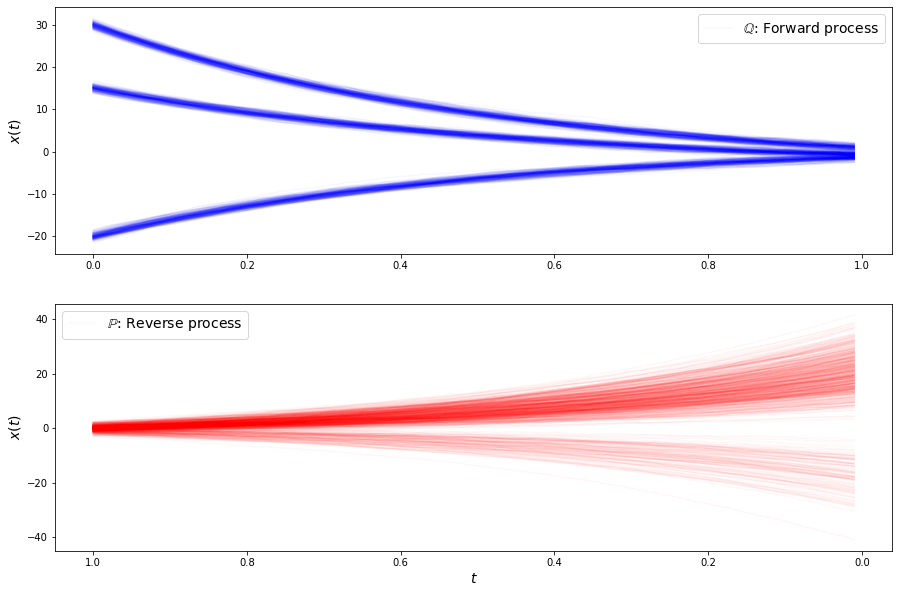

loss b 10.340302467346191
loss b 10.088699340820312
loss b 10.713134765625
loss b 9.8456449508667
loss b 10.112259864807129
loss b 10.490080833435059
loss b 10.931044578552246
loss b 10.420690536499023
loss b 10.002314567565918
loss b 10.092562675476074
loss b 9.993685722351074
loss b 9.56590747833252
loss b 10.660181045532227
loss b 10.001991271972656
loss b 10.278121948242188
loss b 9.623104095458984
loss b 10.604701042175293
loss b 10.716686248779297
loss b 11.090998649597168
loss b 9.842791557312012
loss b 10.38155746459961
loss b 9.850761413574219
loss b 9.87473201751709
loss b 9.773697853088379
loss b 10.012392044067383
loss b 9.99317741394043
loss b 9.922146797180176
loss b 9.904512405395508
loss b 10.12187671661377
loss b 9.962024688720703
loss f 1.0549819469451904
loss f 1.0347968339920044
loss f 1.049479603767395
loss f 1.1012365818023682
loss f 1.0316627025604248
loss f 1.0632139444351196
loss f 1.0816372632980347
loss f 1.031333327293396
loss f 1.0208479166030884
loss f 1.0

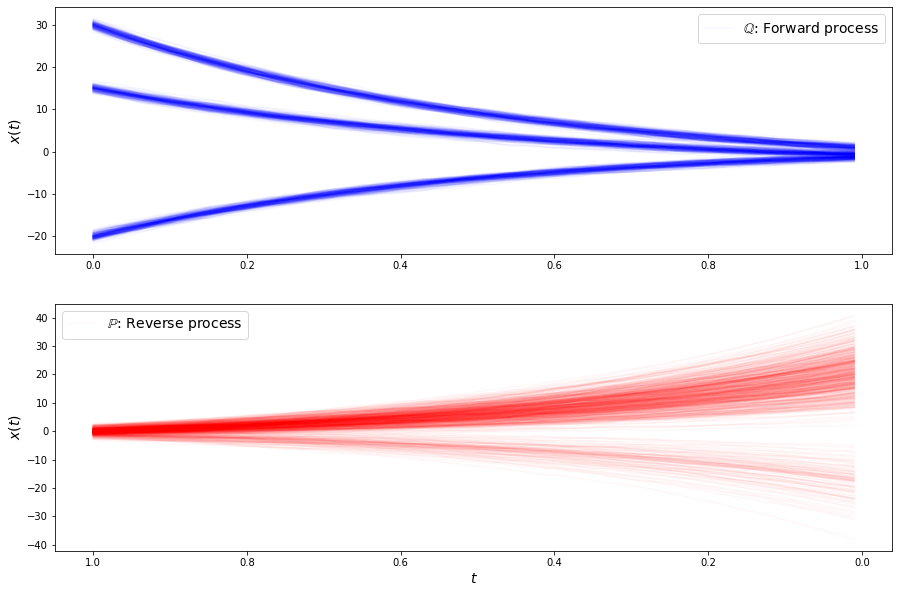

loss b 9.71973991394043
loss b 9.96070384979248
loss b 10.195348739624023
loss b 9.711045265197754
loss b 9.787256240844727
loss b 9.627062797546387
loss b 9.796258926391602
loss b 9.835564613342285
loss b 9.933311462402344
loss b 10.052563667297363
loss b 9.68366527557373
loss b 10.001070976257324
loss b 10.257406234741211
loss b 9.816271781921387
loss b 10.063224792480469
loss b 10.460724830627441
loss b 10.080852508544922
loss b 10.670361518859863
loss b 9.673463821411133
loss b 9.916536331176758
loss b 9.999109268188477
loss b 9.731545448303223
loss b 9.875673294067383
loss b 9.713980674743652
loss b 9.991827964782715
loss b 9.440469741821289
loss b 10.580727577209473
loss b 10.032600402832031
loss b 9.63209342956543
loss b 10.76752758026123
loss f 0.9102093577384949
loss f 0.9825970530509949
loss f 0.9703375697135925
loss f 1.025093913078308
loss f 0.9801710247993469
loss f 0.9637925624847412
loss f 0.991862952709198
loss f 0.9757768511772156
loss f 0.9535592794418335
loss f 0.956

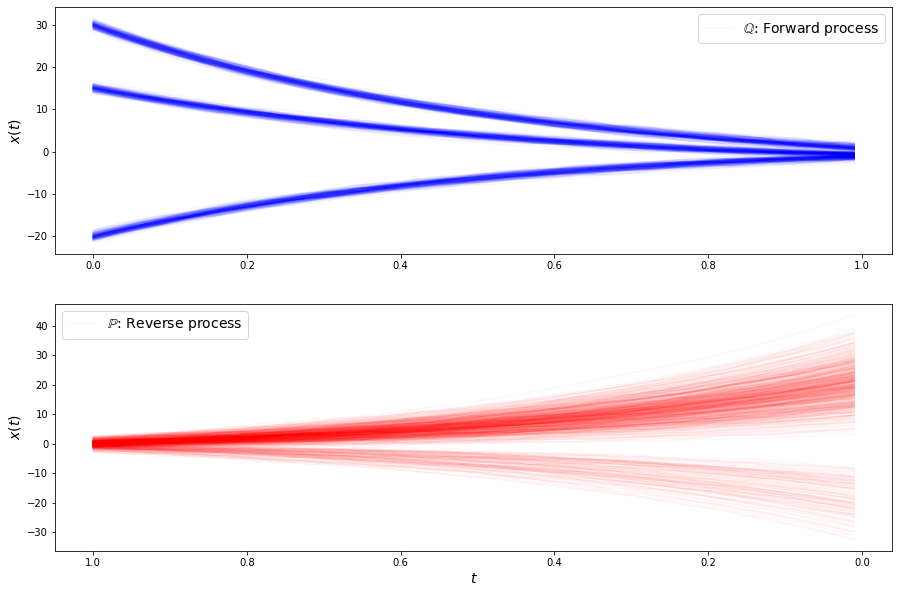

loss b 10.309131622314453
loss b 10.371245384216309
loss b 9.87332534790039
loss b 9.683573722839355
loss b 10.52743911743164
loss b 10.220621109008789
loss b 9.744543075561523
loss b 9.962186813354492
loss b 9.545144081115723
loss b 10.670170783996582
loss b 9.847504615783691
loss b 10.619659423828125
loss b 9.107346534729004
loss b 9.648637771606445
loss b 9.783146858215332
loss b 10.970789909362793
loss b 10.359996795654297
loss b 9.925633430480957
loss b 9.763705253601074
loss b 9.853605270385742
loss b 10.223539352416992
loss b 9.588760375976562
loss b 10.277965545654297
loss b 9.552345275878906
loss b 10.277107238769531
loss b 9.344236373901367
loss b 10.45350456237793
loss b 9.714510917663574
loss b 9.349778175354004
loss b 9.50496768951416
loss f 1.0098296403884888
loss f 0.968205988407135
loss f 1.017889380455017
loss f 0.98853999376297
loss f 1.0161195993423462
loss f 0.9933103919029236
loss f 0.9205146431922913
loss f 0.9046734571456909
loss f 1.0323412418365479
loss f 0.882

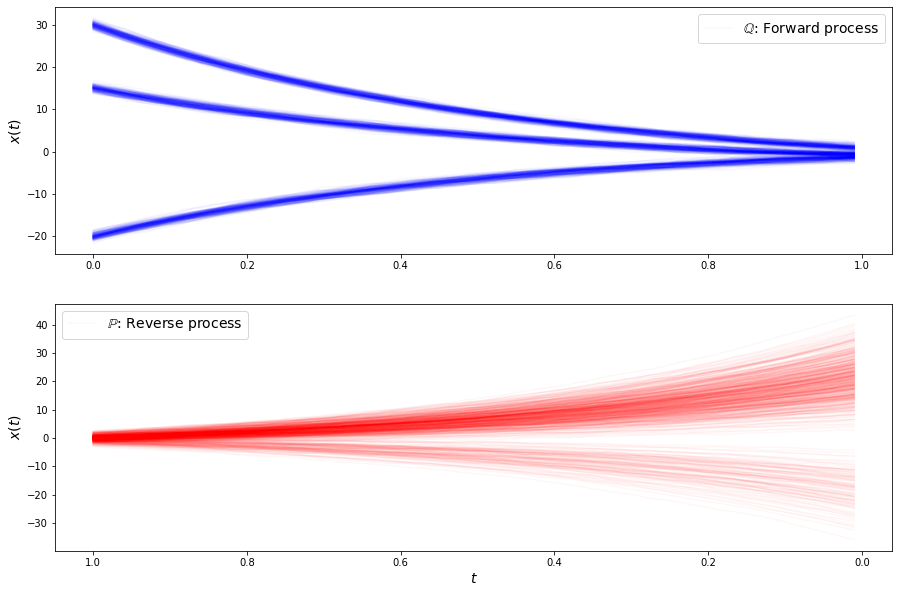

loss b 9.687690734863281
loss b 9.60590934753418
loss b 9.187236785888672
loss b 10.0974760055542
loss b 10.269362449645996
loss b 9.998233795166016
loss b 9.883002281188965
loss b 9.54521656036377
loss b 9.701655387878418
loss b 9.76767635345459
loss b 9.806222915649414
loss b 9.95384407043457
loss b 9.869950294494629
loss b 9.563817024230957
loss b 9.388413429260254
loss b 9.487278938293457
loss b 9.764774322509766
loss b 10.030696868896484
loss b 9.726059913635254
loss b 9.891993522644043
loss b 9.884037017822266
loss b 9.366621971130371
loss b 9.479562759399414
loss b 10.077165603637695
loss b 9.560455322265625
loss b 9.671488761901855
loss b 9.719294548034668
loss b 9.48838996887207
loss b 9.764052391052246
loss b 10.11021614074707
loss f 1.085405707359314
loss f 1.0647767782211304
loss f 1.0361135005950928
loss f 1.0422277450561523
loss f 1.0546144247055054
loss f 1.0238078832626343
loss f 1.011549711227417
loss f 1.0210530757904053
loss f 0.984764039516449
loss f 0.9682891368865

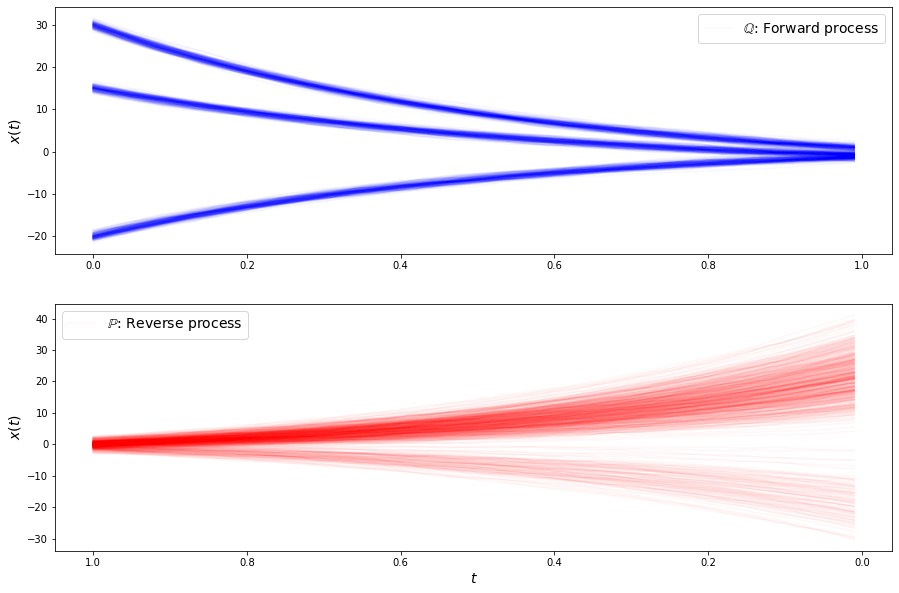

loss b 9.568435668945312
loss b 9.315600395202637
loss b 9.927698135375977
loss b 10.183212280273438
loss b 9.91890811920166
loss b 10.033700942993164
loss b 9.574919700622559
loss b 9.62311840057373
loss b 9.785269737243652
loss b 9.579961776733398
loss b 9.756390571594238
loss b 9.393023490905762
loss b 9.391934394836426
loss b 9.920659065246582
loss b 9.796463966369629
loss b 9.767879486083984
loss b 10.19851303100586
loss b 9.517509460449219
loss b 9.659004211425781
loss b 10.03210735321045
loss b 9.704235076904297
loss b 9.792598724365234
loss b 10.091029167175293
loss b 9.612048149108887
loss b 9.253015518188477
loss b 10.21988296508789
loss b 9.427817344665527
loss b 9.875859260559082
loss b 9.972222328186035
loss b 9.848148345947266
loss f 1.2832380533218384
loss f 1.3896607160568237
loss f 1.3152505159378052
loss f 1.2724069356918335
loss f 1.2805583477020264
loss f 1.2272775173187256
loss f 1.2748807668685913
loss f 1.2883716821670532
loss f 1.2349921464920044
loss f 1.306442

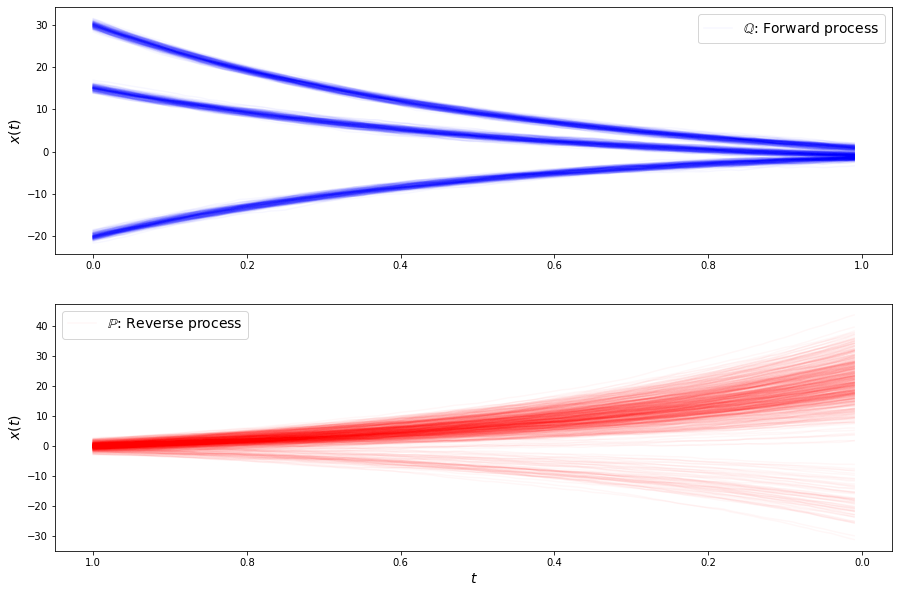

loss b 9.857524871826172
loss b 9.572236061096191
loss b 10.095685005187988
loss b 9.817222595214844
loss b 9.657500267028809
loss b 9.602399826049805
loss b 9.647669792175293
loss b 9.691843032836914
loss b 9.262885093688965
loss b 9.389226913452148
loss b 9.648582458496094
loss b 9.65211296081543
loss b 9.750795364379883
loss b 9.41220760345459
loss b 9.508302688598633
loss b 9.43937873840332
loss b 9.312579154968262
loss b 9.718235969543457
loss b 9.324220657348633
loss b 9.782140731811523
loss b 9.639776229858398
loss b 9.82082462310791
loss b 9.238283157348633
loss b 9.682766914367676
loss b 9.937901496887207
loss b 9.671795845031738
loss b 9.465083122253418
loss b 9.434144020080566
loss b 9.270994186401367
loss b 9.78038215637207
loss f 1.153945803642273
loss f 1.1513313055038452
loss f 1.0832247734069824
loss f 1.0649431943893433
loss f 1.0630614757537842
loss f 1.0707287788391113
loss f 1.1099075078964233
loss f 1.0761337280273438
loss f 1.0683262348175049
loss f 1.071435689926

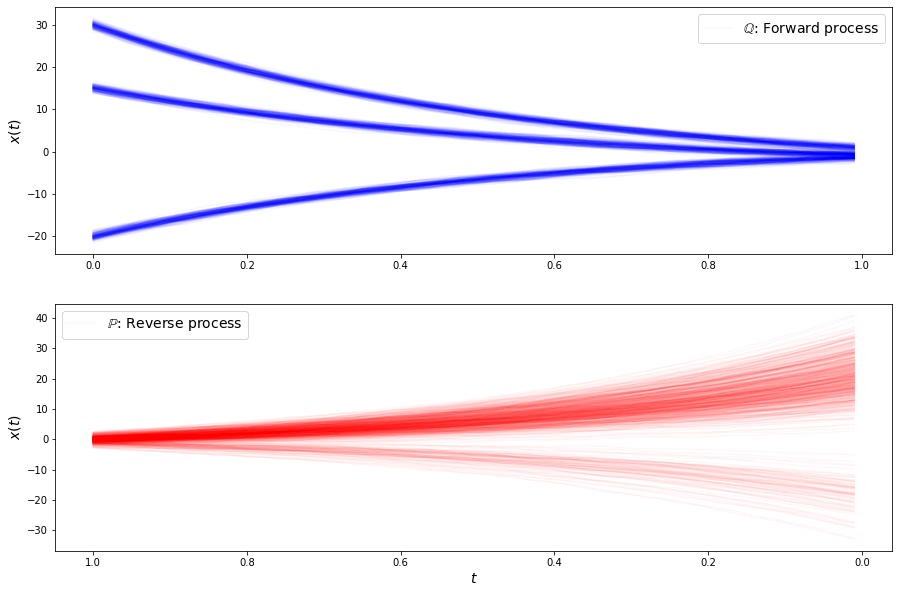

loss b 9.390128135681152
loss b 9.546599388122559
loss b 9.290811538696289
loss b 9.721319198608398
loss b 9.433993339538574
loss b 9.387154579162598
loss b 9.81054401397705
loss b 10.360262870788574
loss b 9.8878812789917
loss b 9.727898597717285
loss b 9.320562362670898
loss b 9.926392555236816
loss b 10.062251091003418
loss b 10.183768272399902
loss b 9.212151527404785
loss b 9.394535064697266
loss b 9.84693431854248
loss b 10.233482360839844
loss b 9.466530799865723
loss b 9.386478424072266
loss b 9.290813446044922
loss b 10.179229736328125
loss b 9.51331901550293
loss b 9.441352844238281
loss b 9.929279327392578
loss b 9.893556594848633
loss b 9.423605918884277
loss b 10.333955764770508
loss b 9.887382507324219
loss b 9.588672637939453
loss f 1.0309813022613525
loss f 1.059544324874878
loss f 1.0151135921478271
loss f 1.0042611360549927
loss f 0.9454300403594971
loss f 0.9839939475059509
loss f 1.008419394493103
loss f 1.0238569974899292
loss f 0.958724319934845
loss f 0.940699815

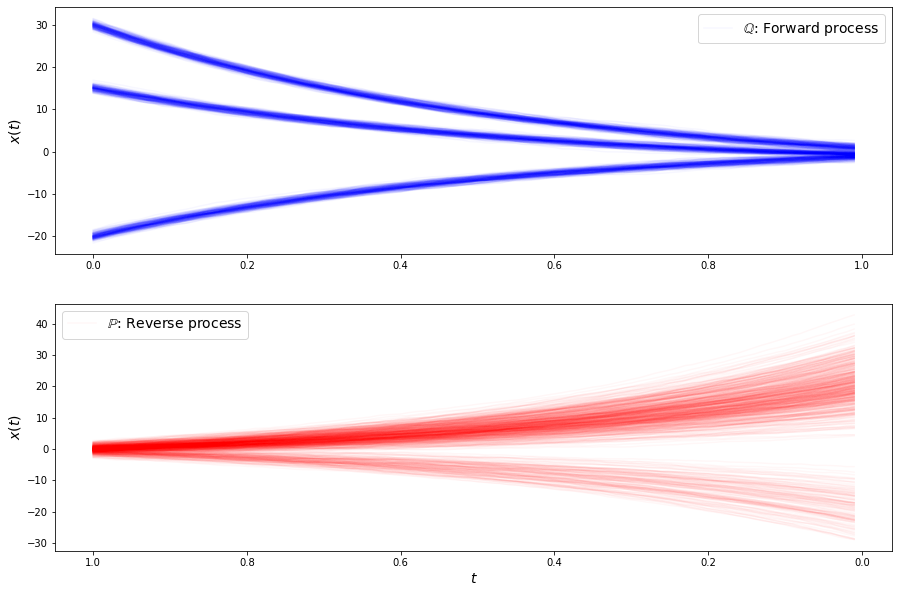

loss b 9.913703918457031
loss b 9.86005973815918
loss b 9.52086353302002
loss b 9.995699882507324
loss b 9.958670616149902
loss b 9.90604019165039
loss b 9.70165729522705
loss b 9.574125289916992
loss b 9.569936752319336
loss b 9.819352149963379
loss b 9.304211616516113
loss b 9.977789878845215
loss b 9.703265190124512
loss b 10.134200096130371
loss b 9.632940292358398
loss b 9.658994674682617
loss b 9.607405662536621
loss b 9.755599975585938
loss b 9.619343757629395
loss b 10.020651817321777
loss b 9.578789710998535
loss b 9.873773574829102
loss b 9.825772285461426
loss b 10.000526428222656
loss b 10.092811584472656
loss b 9.930023193359375
loss b 9.79395866394043
loss b 10.091798782348633
loss b 9.684440612792969
loss b 9.389922142028809
loss f 0.8979977369308472
loss f 0.8837477564811707
loss f 0.8394783139228821
loss f 0.9007205963134766
loss f 0.8626580834388733
loss f 0.8419623374938965
loss f 0.8255546689033508
loss f 0.8688173890113831
loss f 0.8453976511955261
loss f 0.8348624

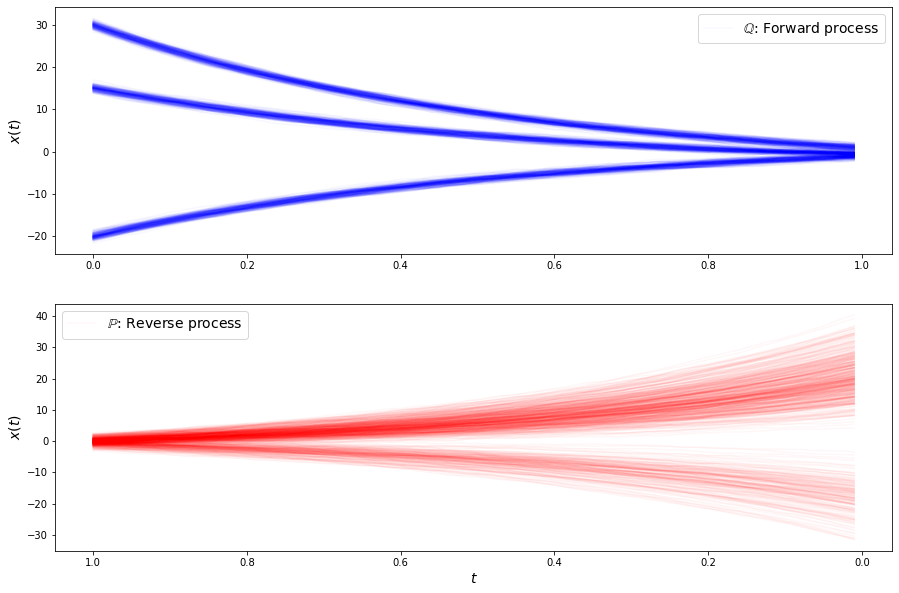

loss b 9.544316291809082
loss b 9.897305488586426
loss b 9.795230865478516
loss b 10.149097442626953
loss b 9.656548500061035
loss b 9.321662902832031
loss b 9.935997009277344
loss b 10.011943817138672
loss b 9.72858715057373
loss b 10.816313743591309
loss b 10.625322341918945
loss b 9.525182723999023
loss b 9.868744850158691
loss b 9.739951133728027
loss b 10.261320114135742
loss b 10.359129905700684
loss b 9.788652420043945
loss b 10.073558807373047
loss b 10.206491470336914
loss b 10.031852722167969
loss b 10.24194622039795
loss b 10.483792304992676
loss b 9.921234130859375
loss b 10.421845436096191
loss b 9.899991989135742
loss b 10.6890287399292
loss b 10.209102630615234
loss b 10.282669067382812
loss b 10.084355354309082
loss b 10.349822998046875
loss f 0.812091052532196
loss f 0.8453748226165771
loss f 0.8314641714096069
loss f 0.7846713662147522
loss f 0.7997190952301025
loss f 0.817744791507721
loss f 0.7490001916885376
loss f 0.7534659504890442
loss f 0.8346763253211975
loss 

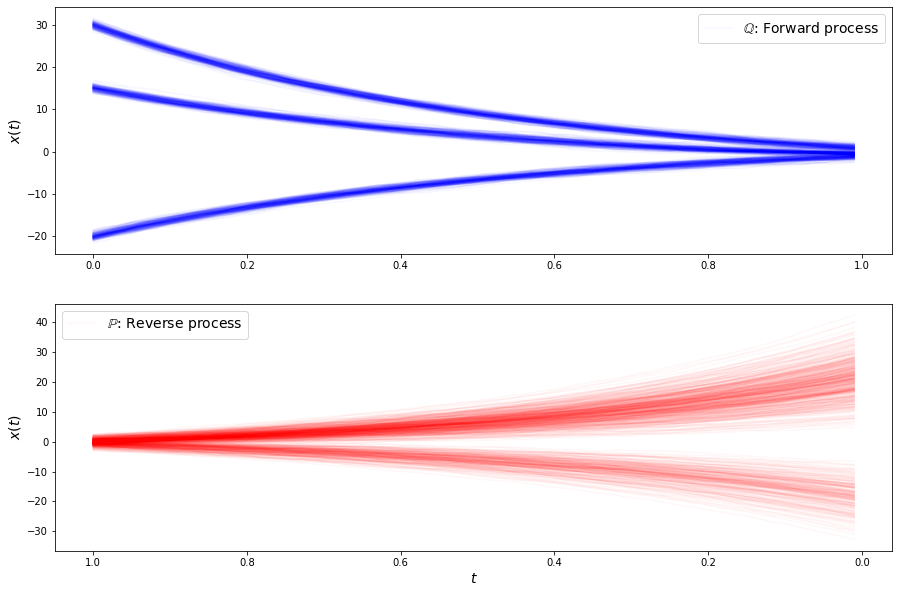

loss b 10.013787269592285
loss b 9.987655639648438
loss b 10.444601058959961
loss b 10.137195587158203
loss b 10.087225914001465
loss b 10.15792179107666
loss b 10.088367462158203
loss b 9.815845489501953
loss b 10.05971908569336
loss b 10.435880661010742
loss b 10.192109107971191
loss b 10.0435152053833
loss b 10.055248260498047
loss b 10.502701759338379
loss b 9.918511390686035
loss b 10.501527786254883
loss b 10.215012550354004
loss b 10.295133590698242
loss b 9.4454927444458
loss b 10.071394920349121
loss b 10.120708465576172
loss b 9.935572624206543
loss b 9.78417682647705
loss b 9.890342712402344
loss b 9.787940979003906
loss b 10.0055570602417
loss b 10.218563079833984
loss b 9.82271671295166
loss b 9.559059143066406
loss b 10.028190612792969
loss f 0.8210480213165283
loss f 0.695102870464325
loss f 0.6867902874946594
loss f 0.7187241911888123
loss f 0.7147106528282166
loss f 0.6904131770133972
loss f 0.7511058449745178
loss f 0.6835142374038696
loss f 0.6564221978187561
loss f 

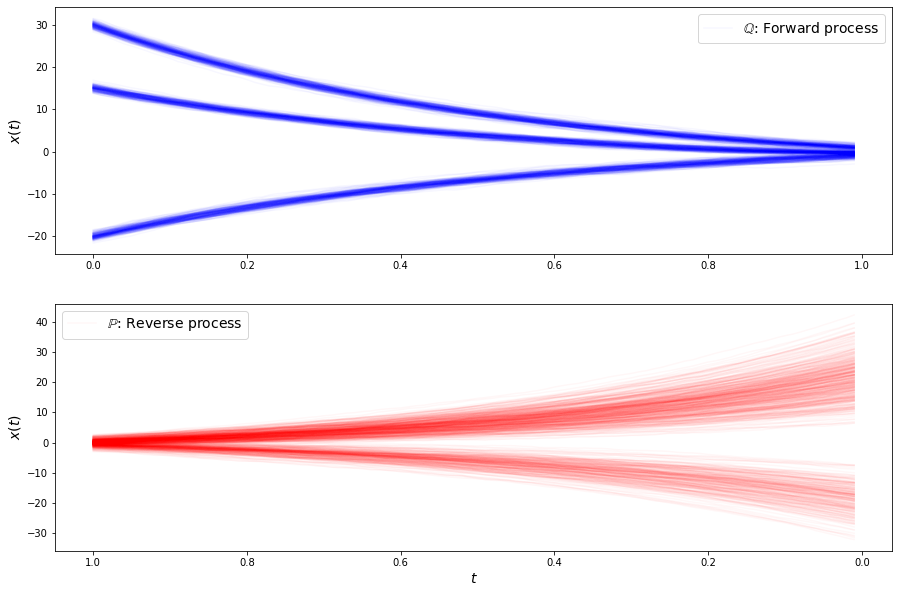

loss b 10.003129005432129
loss b 9.990376472473145
loss b 9.706692695617676
loss b 9.951770782470703
loss b 9.858125686645508
loss b 9.908308982849121
loss b 9.931344032287598
loss b 9.080742835998535
loss b 9.820966720581055
loss b 9.788020133972168
loss b 9.800485610961914
loss b 9.32142162322998
loss b 9.460127830505371
loss b 10.341760635375977
loss b 9.72457504272461
loss b 9.538734436035156
loss b 9.41712474822998
loss b 9.952605247497559
loss b 10.135833740234375
loss b 9.544188499450684
loss b 10.109774589538574
loss b 9.7418851852417
loss b 9.76942253112793
loss b 9.587423324584961
loss b 9.916301727294922
loss b 10.129923820495605
loss b 9.644597053527832
loss b 10.213713645935059
loss b 9.806020736694336
loss b 10.025104522705078
loss f 0.8179177045822144
loss f 0.7098729014396667
loss f 0.8278115391731262
loss f 0.743848443031311
loss f 0.7371466159820557
loss f 0.7882139086723328
loss f 0.7578275799751282
loss f 0.796192467212677
loss f 0.7556536197662354
loss f 0.75621581

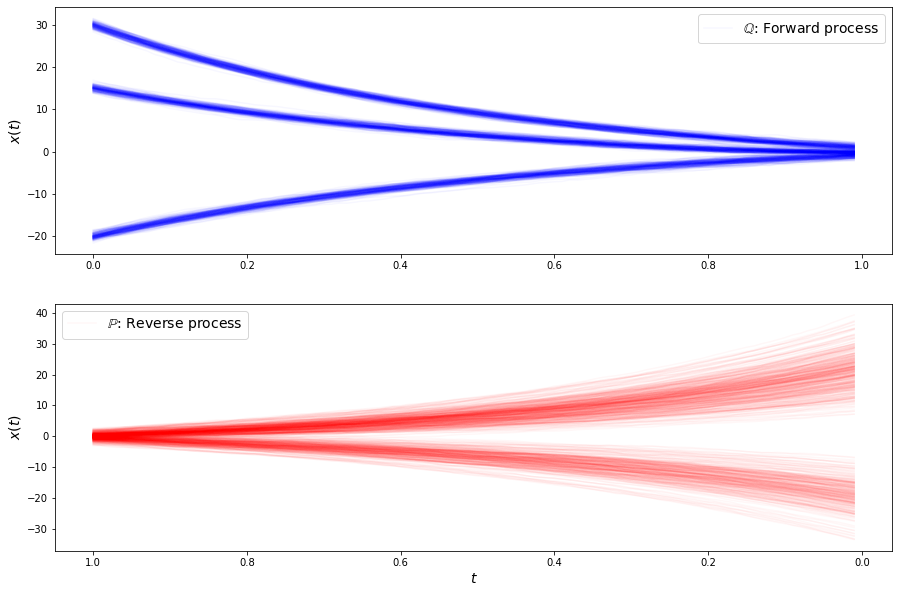

loss b 10.021039009094238
loss b 9.202430725097656
loss b 10.077632904052734
loss b 9.530911445617676
loss b 9.490097999572754
loss b 9.839276313781738
loss b 9.599746704101562
loss b 9.752850532531738
loss b 9.077958106994629
loss b 9.735516548156738
loss b 9.906253814697266
loss b 9.247398376464844
loss b 9.025586128234863
loss b 9.761590003967285
loss b 9.68582534790039
loss b 9.868022918701172
loss b 9.408495903015137
loss b 9.157340049743652
loss b 10.123748779296875
loss b 9.444530487060547
loss b 9.845406532287598
loss b 9.884308815002441
loss b 9.676396369934082
loss b 9.942808151245117
loss b 9.366413116455078
loss b 9.30610179901123
loss b 9.69630241394043
loss b 9.876738548278809
loss b 9.701760292053223
loss b 9.982834815979004
loss f 0.9214015007019043
loss f 0.9444985389709473
loss f 0.8738870024681091
loss f 0.8963883519172668
loss f 0.8916961550712585
loss f 0.8168057203292847
loss f 0.836335301399231
loss f 0.8071101307868958
loss f 0.831514298915863
loss f 0.808682918

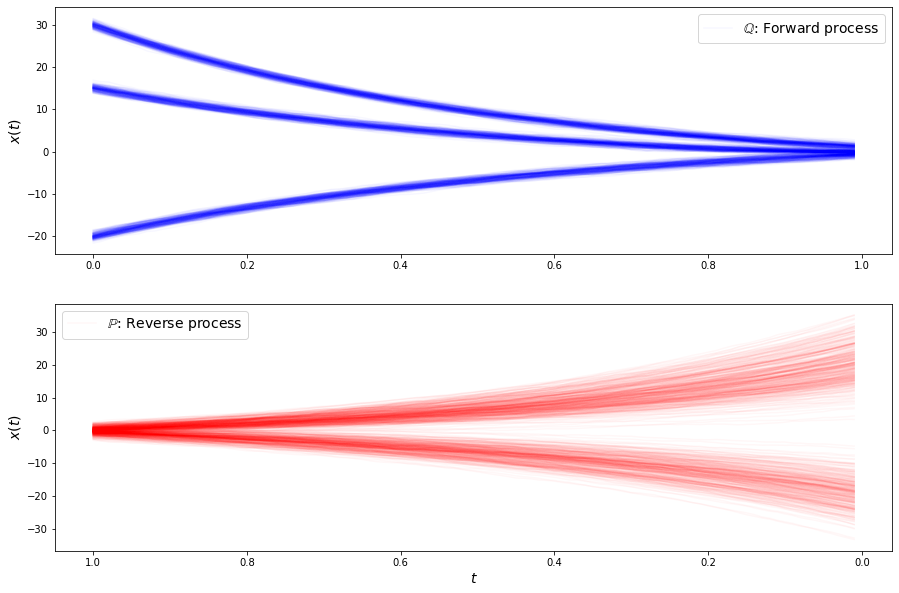

loss b 9.455123901367188
loss b 9.387638092041016
loss b 10.066054344177246
loss b 9.872756004333496
loss b 9.4506196975708
loss b 9.881945610046387
loss b 10.1113920211792
loss b 9.794604301452637
loss b 9.245872497558594
loss b 9.7365140914917
loss b 9.834668159484863
loss b 9.250431060791016
loss b 9.929759979248047
loss b 9.808579444885254
loss b 9.891499519348145
loss b 9.645638465881348
loss b 9.761311531066895
loss b 10.045451164245605
loss b 9.387039184570312
loss b 9.621723175048828
loss b 9.298606872558594
loss b 9.617368698120117
loss b 9.442632675170898
loss b 9.249850273132324
loss b 9.28049087524414
loss b 9.974274635314941
loss b 9.52837085723877
loss b 9.72174072265625
loss b 9.450562477111816
loss b 9.74380874633789
loss f 0.6452779769897461
loss f 0.6885417699813843
loss f 0.6620627641677856
loss f 0.6231571435928345
loss f 0.6514057517051697
loss f 0.6232070922851562
loss f 0.5957179069519043
loss f 0.5983261466026306
loss f 0.578309953212738
loss f 0.626373410224914

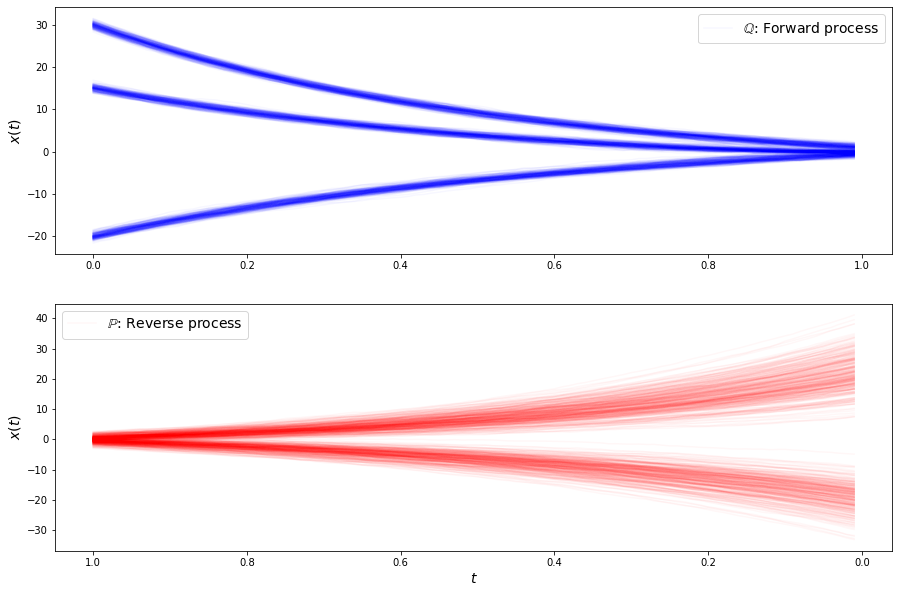

loss b 9.759668350219727
loss b 9.972949028015137
loss b 9.508142471313477
loss b 9.697373390197754
loss b 9.25700569152832
loss b 9.113006591796875
loss b 9.631675720214844
loss b 8.847529411315918
loss b 9.634260177612305
loss b 10.024650573730469
loss b 9.729649543762207
loss b 9.362268447875977
loss b 9.456646919250488
loss b 9.212333679199219
loss b 9.733807563781738
loss b 9.301815032958984
loss b 9.785918235778809
loss b 9.25963020324707
loss b 9.321208953857422
loss b 8.904708862304688
loss b 8.744224548339844
loss b 9.488618850708008
loss b 9.35647201538086
loss b 9.264244079589844
loss b 9.511549949645996
loss b 9.680590629577637
loss b 9.573857307434082
loss b 9.304064750671387
loss b 9.094995498657227
loss b 8.997148513793945
loss f 0.6302725672721863
loss f 0.6230917572975159
loss f 0.5969588756561279
loss f 0.5872060060501099
loss f 0.5854207277297974
loss f 0.6515817642211914
loss f 0.6579790115356445
loss f 0.6018881797790527
loss f 0.5640581846237183
loss f 0.602420032

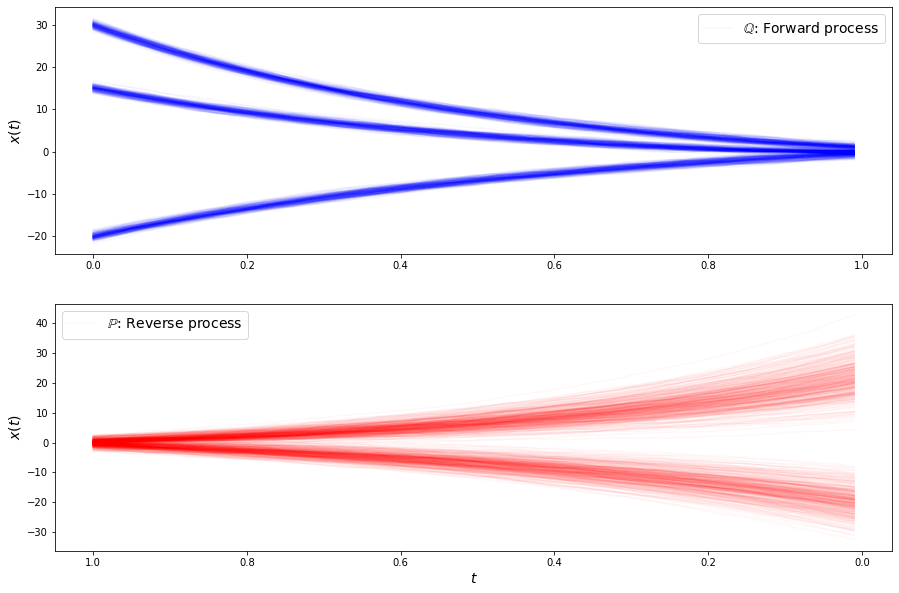

loss b 8.965697288513184
loss b 8.973020553588867
loss b 8.843737602233887
loss b 9.37049674987793
loss b 8.849605560302734
loss b 9.541211128234863
loss b 9.041251182556152
loss b 8.941155433654785
loss b 9.200040817260742
loss b 9.375687599182129
loss b 9.87093448638916
loss b 9.09850788116455
loss b 9.05888557434082
loss b 9.017616271972656
loss b 8.996905326843262
loss b 9.037200927734375
loss b 9.002578735351562
loss b 9.285731315612793
loss b 9.715682029724121
loss b 8.967824935913086
loss b 9.099647521972656
loss b 9.164953231811523
loss b 9.353045463562012
loss b 9.165894508361816
loss b 9.030369758605957
loss b 9.482172012329102
loss b 9.216169357299805
loss b 9.05105972290039
loss b 9.065225601196289
loss b 9.573127746582031
loss f 1.0202765464782715
loss f 0.9971566200256348
loss f 0.9220372438430786
loss f 0.9018385410308838
loss f 0.8792750239372253
loss f 0.8565845489501953
loss f 0.8995969891548157
loss f 0.8208089470863342
loss f 0.8030511140823364
loss f 0.801575601100

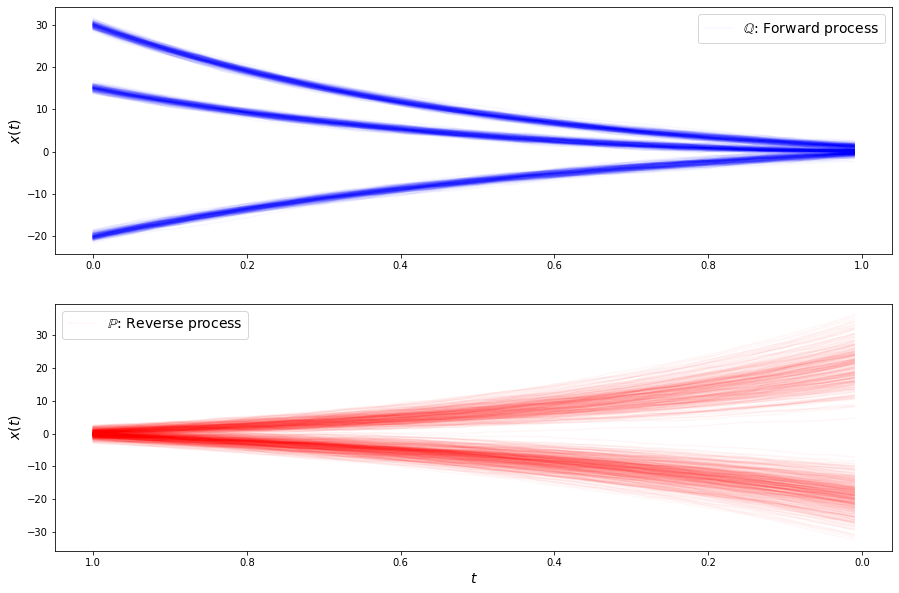

loss b 8.88001537322998
loss b 8.675244331359863
loss b 8.597848892211914
loss b 9.83985710144043
loss b 10.59934139251709
loss b 12.716028213500977
loss b 14.515451431274414
loss b 16.18794822692871
loss b 15.711278915405273
loss b 15.751896858215332
loss b 14.126276016235352
loss b 11.995388984680176
loss b 11.321226119995117
loss b 10.243369102478027
loss b 10.084738731384277
loss b 10.62290096282959
loss b 10.221303939819336
loss b 10.090846061706543
loss b 10.027907371520996
loss b 10.528057098388672
loss b 10.420899391174316
loss b 9.884758949279785
loss b 10.897937774658203
loss b 10.793991088867188
loss b 10.90861988067627
loss b 11.175806999206543
loss b 10.988802909851074
loss b 10.85735034942627
loss b 10.678627967834473
loss b 10.99340534210205
loss f 2.768791913986206
loss f 2.498975992202759
loss f 2.214207410812378
loss f 2.023491382598877
loss f 1.8077173233032227
loss f 1.764633297920227
loss f 1.5922805070877075
loss f 1.5954991579055786
loss f 1.4538064002990723
loss

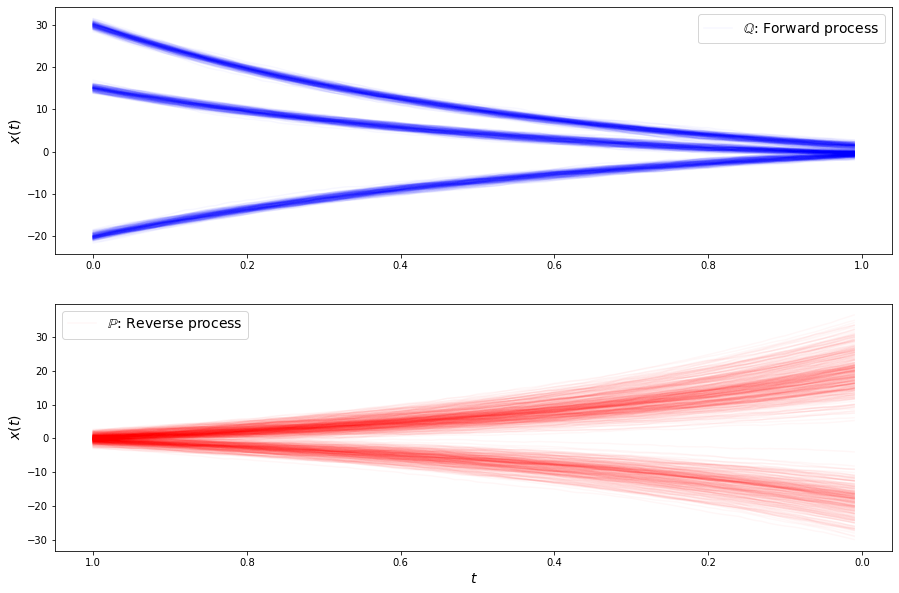

loss b 8.956987380981445
loss b 9.061660766601562
loss b 8.035541534423828
loss b 8.65471076965332
loss b 9.160862922668457
loss b 8.805377960205078
loss b 8.7117919921875
loss b 8.883508682250977
loss b 8.989567756652832
loss b 8.426559448242188
loss b 9.07857608795166
loss b 8.769235610961914
loss b 8.703922271728516
loss b 8.919404029846191
loss b 8.889418601989746
loss b 8.964051246643066
loss b 8.884527206420898
loss b 9.288387298583984
loss b 8.69946002960205
loss b 8.447338104248047
loss b 9.063815116882324
loss b 8.303004264831543
loss b 9.135653495788574
loss b 8.821366310119629
loss b 8.831610679626465
loss b 8.559669494628906
loss b 8.405635833740234
loss b 9.13262939453125
loss b 9.220911026000977
loss b 8.540550231933594
loss f 1.014562964439392
loss f 0.9411574602127075
loss f 0.9361118078231812
loss f 0.9613370895385742
loss f 0.9599830508232117
loss f 0.9658671617507935
loss f 0.9256842136383057
loss f 0.9321696758270264
loss f 0.966428279876709
loss f 0.901492476463317

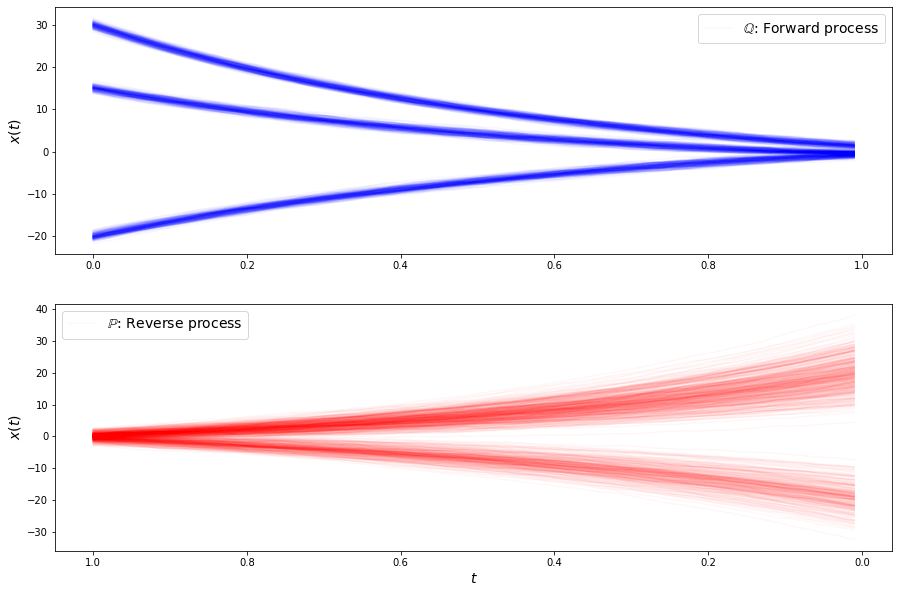

loss b 8.6649808883667
loss b 8.981454849243164
loss b 8.280290603637695
loss b 8.900765419006348
loss b 8.628107070922852
loss b 9.327080726623535
loss b 9.115492820739746
loss b 8.778213500976562
loss b 8.817207336425781
loss b 8.997065544128418
loss b 8.926255226135254
loss b 8.687511444091797
loss b 9.15081787109375
loss b 8.85700798034668
loss b 8.353317260742188
loss b 8.604196548461914
loss b 8.817851066589355
loss b 8.960556030273438
loss b 8.920734405517578
loss b 8.580236434936523
loss b 8.647940635681152
loss b 9.260636329650879
loss b 8.800389289855957
loss b 8.806280136108398
loss b 8.9353666305542
loss b 8.653523445129395
loss b 8.636947631835938
loss b 8.437972068786621
loss b 9.065025329589844
loss b 8.53710651397705
loss f 0.9288488030433655
loss f 0.9342231750488281
loss f 0.9335706830024719
loss f 0.9517478942871094
loss f 0.9070396423339844
loss f 0.931098461151123
loss f 0.8792210817337036
loss f 0.9672503471374512
loss f 0.9118019938468933
loss f 0.900707960128784

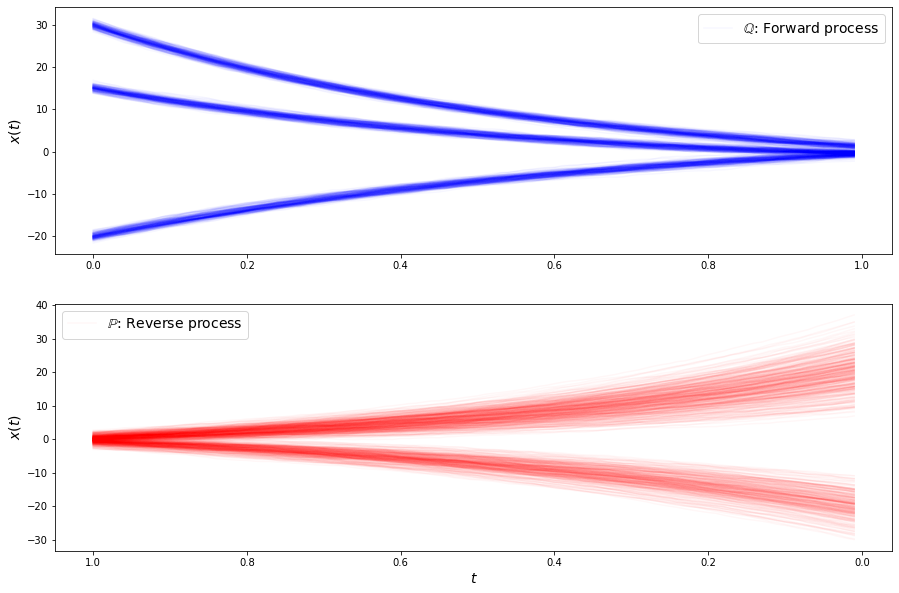

loss b 8.880389213562012
loss b 8.801097869873047
loss b 8.513628959655762
loss b 8.887810707092285
loss b 8.916330337524414
loss b 8.714241981506348
loss b 8.167847633361816
loss b 8.177682876586914
loss b 8.550297737121582
loss b 8.28173542022705
loss b 8.591745376586914
loss b 8.673761367797852
loss b 8.459114074707031
loss b 8.543566703796387
loss b 8.60064697265625
loss b 8.448535919189453
loss b 9.046157836914062
loss b 8.342195510864258
loss b 8.75312328338623
loss b 8.387731552124023
loss b 8.713774681091309
loss b 8.361215591430664
loss b 8.86825942993164
loss b 8.835465431213379
loss b 8.617961883544922
loss b 8.109831809997559
loss b 8.80066204071045
loss b 8.628307342529297
loss b 8.453422546386719
loss b 8.706061363220215
loss f 0.8789547681808472
loss f 0.8178602457046509
loss f 0.8082557916641235
loss f 0.8393751978874207
loss f 0.8448606133460999
loss f 0.8984321355819702
loss f 0.7981747388839722
loss f 0.8575019836425781
loss f 0.874640703201294
loss f 0.8359574675559

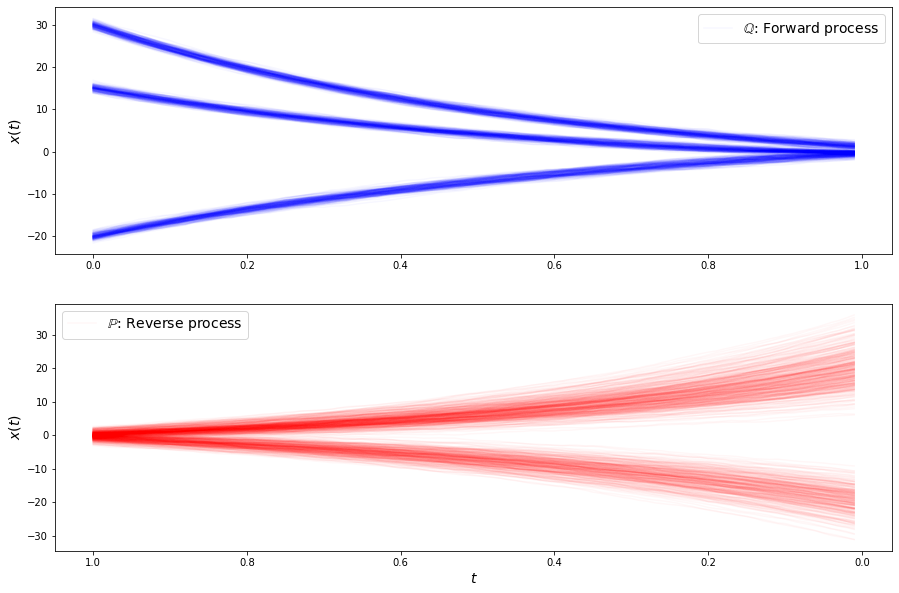

loss b 8.63888931274414
loss b 8.412949562072754
loss b 8.325417518615723
loss b 8.389486312866211
loss b 8.599550247192383
loss b 8.227265357971191
loss b 8.643004417419434
loss b 8.452131271362305
loss b 8.477958679199219
loss b 8.545537948608398
loss b 8.71932315826416
loss b 8.540396690368652
loss b 8.830146789550781
loss b 8.471597671508789
loss b 9.206387519836426
loss b 8.185667037963867
loss b 8.595287322998047
loss b 8.720383644104004
loss b 8.620880126953125
loss b 8.858016967773438
loss b 8.752972602844238
loss b 8.470616340637207
loss b 8.258648872375488
loss b 8.882317543029785
loss b 8.4587984085083
loss b 8.679634094238281
loss b 8.417211532592773
loss b 8.38683032989502
loss b 8.53955364227295
loss b 8.528770446777344
loss f 1.0026204586029053
loss f 1.0171414613723755
loss f 0.974655032157898
loss f 0.952777087688446
loss f 1.0313326120376587
loss f 0.9399124979972839
loss f 0.9025815725326538
loss f 0.9273706674575806
loss f 1.0063153505325317
loss f 0.966688394546508

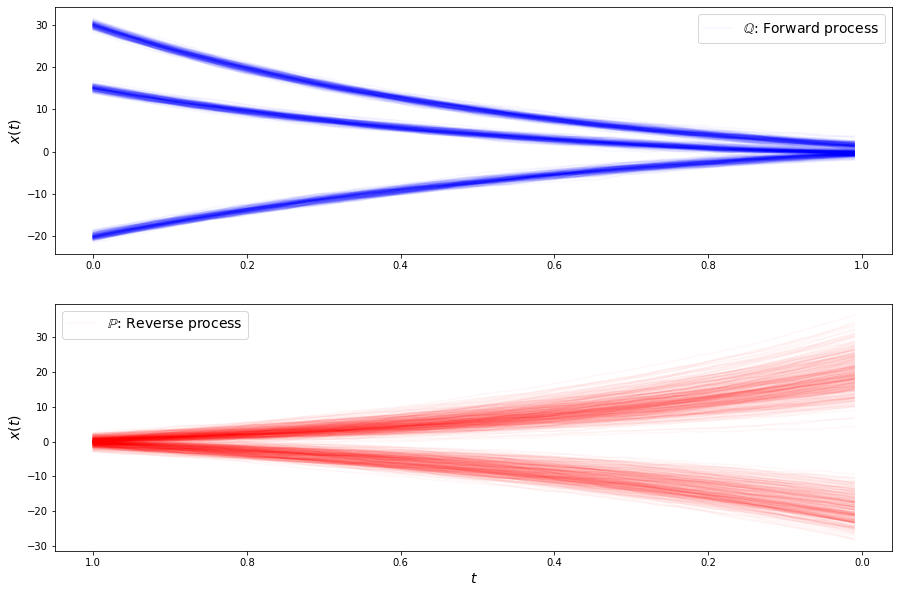

loss b 8.197449684143066
loss b 8.593615531921387
loss b 8.620478630065918
loss b 8.310545921325684
loss b 8.156213760375977
loss b 8.04632568359375
loss b 8.262675285339355
loss b 8.44011402130127
loss b 8.698854446411133
loss b 8.424640655517578
loss b 8.567131042480469
loss b 8.242639541625977
loss b 8.131712913513184
loss b 8.063639640808105
loss b 8.246940612792969
loss b 8.445639610290527
loss b 8.534820556640625
loss b 7.908236980438232
loss b 8.153609275817871
loss b 8.310296058654785
loss b 8.355424880981445
loss b 8.2415132522583
loss b 7.97374153137207
loss b 8.366344451904297
loss b 7.91816520690918
loss b 8.185441970825195
loss b 8.31231689453125
loss b 8.48405933380127
loss b 7.953564643859863
loss b 8.231195449829102
loss f 0.9628544449806213
loss f 0.9844788312911987
loss f 0.9674550294876099
loss f 1.018207311630249
loss f 0.9860537052154541
loss f 0.9803305268287659
loss f 0.9529086947441101
loss f 1.017208456993103
loss f 0.9346628189086914
loss f 0.964448094367981
l

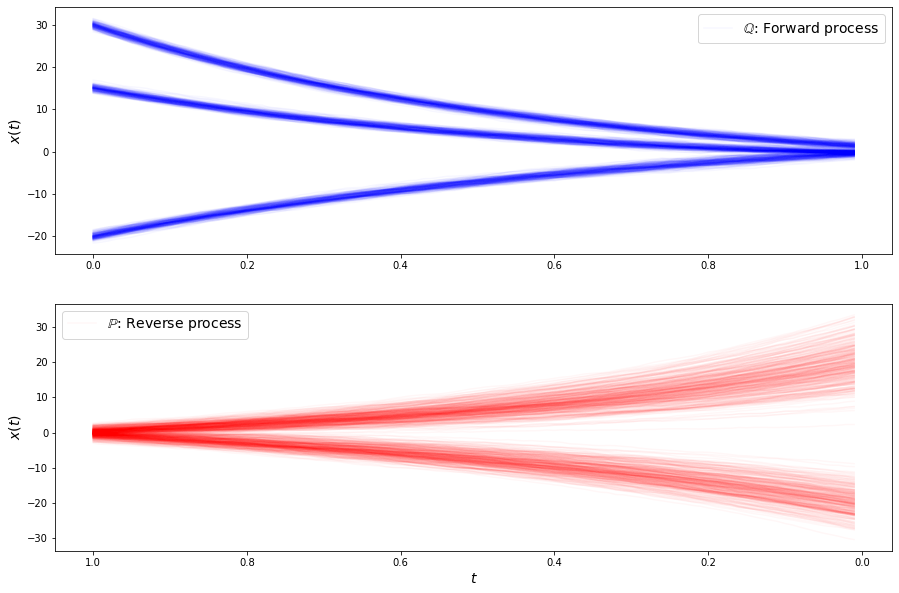

loss b 8.29369068145752
loss b 8.15756893157959
loss b 7.89536190032959
loss b 8.33768081665039
loss b 8.29874038696289
loss b 7.596213340759277
loss b 8.125783920288086
loss b 8.094980239868164
loss b 8.280962944030762
loss b 8.02524471282959
loss b 8.119549751281738
loss b 8.01106071472168
loss b 7.907476902008057
loss b 7.910268783569336
loss b 8.193023681640625
loss b 7.981480598449707
loss b 8.033550262451172
loss b 8.21971321105957
loss b 7.897113800048828
loss b 8.022071838378906
loss b 7.956451892852783
loss b 8.229537963867188
loss b 8.021893501281738
loss b 7.9806060791015625
loss b 8.156519889831543
loss b 7.761538028717041
loss b 8.068275451660156
loss b 8.258318901062012
loss b 7.943970203399658
loss b 8.113510131835938
loss f 0.9056091904640198
loss f 0.8375812768936157
loss f 0.8858175277709961
loss f 0.8863152861595154
loss f 0.9074557423591614
loss f 0.9153748154640198
loss f 0.8462913036346436
loss f 0.8892483711242676
loss f 0.889068067073822
loss f 0.866791129112243

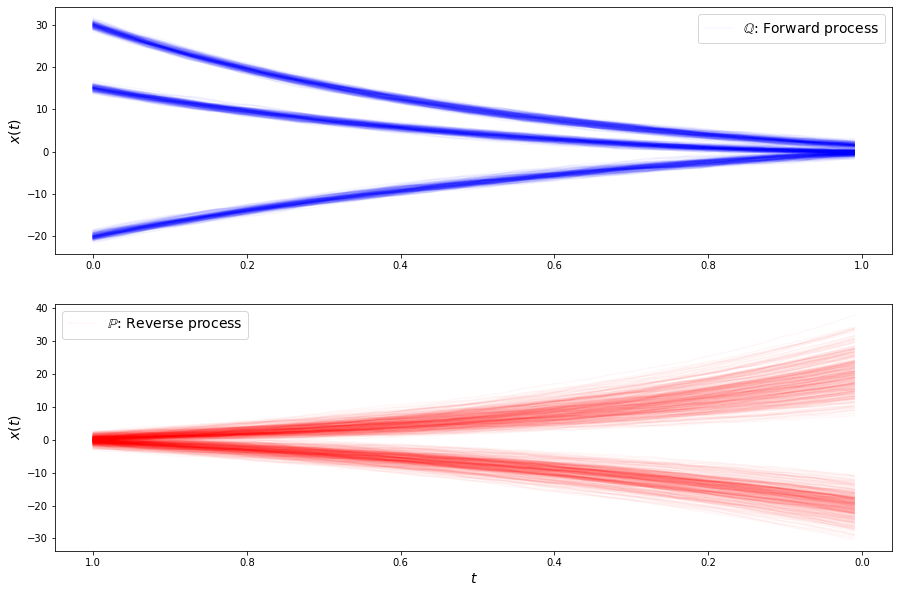

loss b 8.012897491455078
loss b 7.929599285125732
loss b 8.257253646850586
loss b 8.273359298706055
loss b 8.05683708190918
loss b 7.900911808013916
loss b 8.147161483764648
loss b 8.193001747131348
loss b 7.85589599609375
loss b 7.745131015777588
loss b 8.063971519470215
loss b 8.325555801391602
loss b 7.982238292694092
loss b 7.938739776611328
loss b 7.776124954223633
loss b 7.7838521003723145
loss b 7.81571102142334
loss b 8.216012954711914
loss b 7.551055431365967
loss b 8.096962928771973
loss b 7.969911098480225
loss b 8.132953643798828
loss b 8.100774765014648
loss b 7.893254280090332
loss b 7.987326622009277
loss b 8.37448787689209
loss b 7.8953633308410645
loss b 7.560598373413086
loss b 7.933478355407715
loss b 8.31690788269043
loss f 0.8298747539520264
loss f 0.7926157116889954
loss f 0.869735836982727
loss f 0.8103013634681702
loss f 0.8917784690856934
loss f 0.895145058631897
loss f 0.7794883847236633
loss f 0.830928385257721
loss f 0.8551118969917297
loss f 0.8385870456695

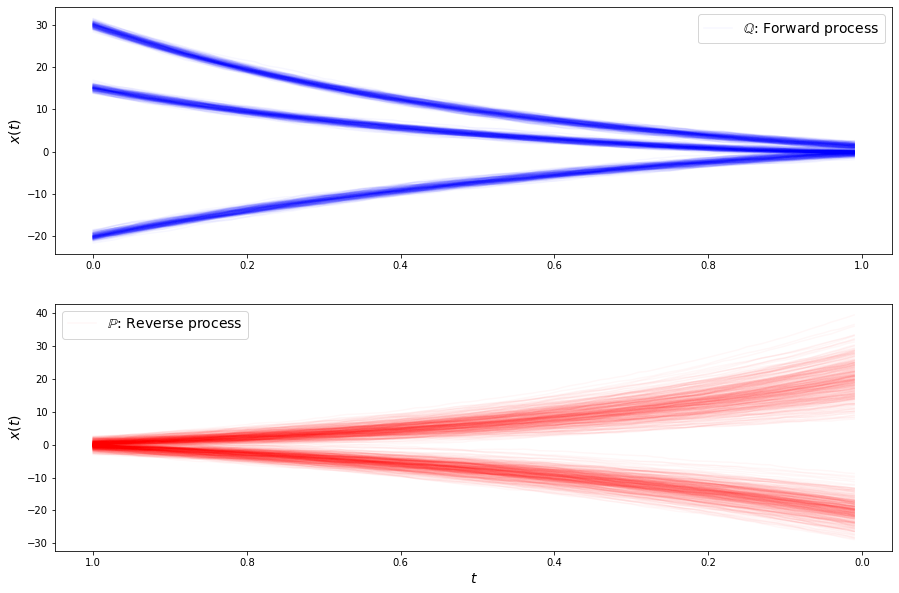

loss b 7.657907009124756
loss b 7.619248390197754
loss b 8.031466484069824
loss b 7.889084815979004
loss b 7.612398624420166
loss b 8.081811904907227
loss b 7.8034138679504395
loss b 7.646477699279785
loss b 7.820615291595459
loss b 7.61197566986084
loss b 7.875898838043213
loss b 7.811218738555908
loss b 7.926700115203857
loss b 7.698791027069092
loss b 7.785317420959473
loss b 7.7070231437683105
loss b 8.031811714172363
loss b 7.965697288513184
loss b 7.870697975158691
loss b 8.22735595703125
loss b 7.96766996383667
loss b 7.949644565582275
loss b 7.752427101135254
loss b 7.824908256530762
loss b 7.643111705780029
loss b 7.867586135864258
loss b 8.227147102355957
loss b 8.066143989562988
loss b 7.412994384765625
loss b 8.066356658935547
loss f 0.7422688603401184
loss f 0.7265332341194153
loss f 0.7380611300468445
loss f 0.7755011916160583
loss f 0.7242780327796936
loss f 0.7934713363647461
loss f 0.7600810527801514
loss f 0.7261767387390137
loss f 0.7296460270881653
loss f 0.73572230

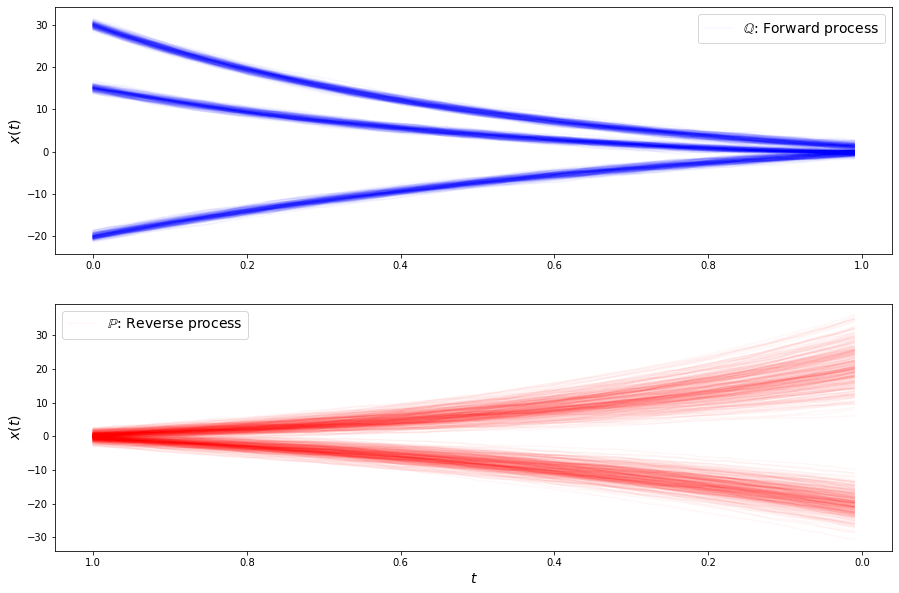

loss b 7.828671455383301
loss b 7.888917446136475
loss b 7.7684245109558105
loss b 7.5857014656066895
loss b 7.658235549926758
loss b 7.691625118255615
loss b 7.482738018035889
loss b 7.835899829864502
loss b 8.08666706085205
loss b 8.055489540100098
loss b 8.188470840454102
loss b 8.011750221252441
loss b 7.977160930633545
loss b 7.68947172164917
loss b 7.826014041900635
loss b 8.042237281799316
loss b 7.7535810470581055
loss b 7.5664963722229
loss b 7.946906089782715
loss b 8.21904182434082
loss b 7.802333354949951
loss b 7.8621625900268555
loss b 7.6759514808654785
loss b 7.794229984283447
loss b 7.923879623413086
loss b 7.775789737701416
loss b 7.561959743499756
loss b 7.744286060333252
loss b 7.517373085021973
loss b 7.5423583984375
loss f 0.7892996668815613
loss f 0.7420235872268677
loss f 0.8029451966285706
loss f 0.7864276170730591
loss f 0.7983696460723877
loss f 0.7645902633666992
loss f 0.7365858554840088
loss f 0.813290536403656
loss f 0.7821351289749146
loss f 0.7196673750

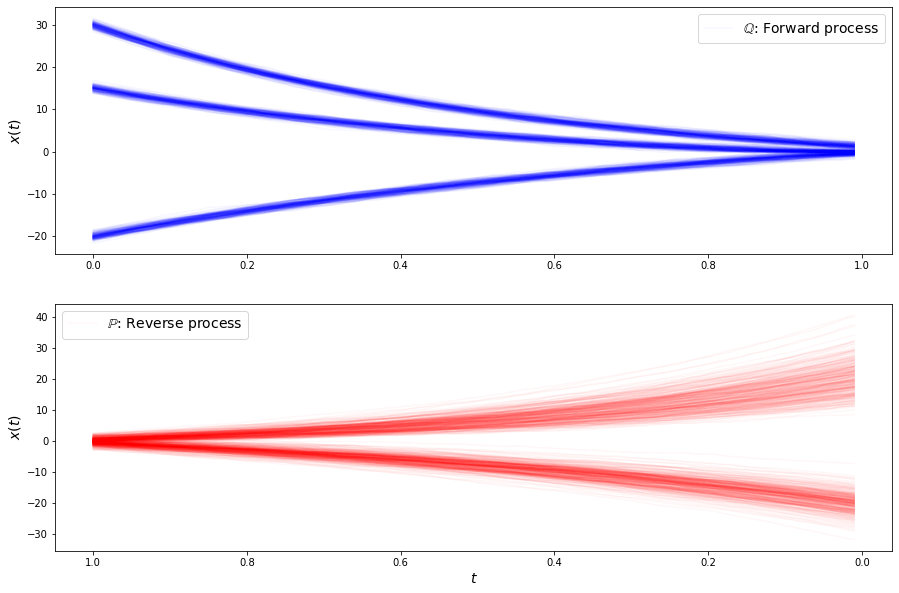

loss b 7.656712532043457
loss b 8.187840461730957
loss b 7.256942272186279
loss b 7.91248893737793
loss b 7.752109527587891
loss b 7.97466516494751
loss b 7.66118049621582
loss b 7.847838878631592
loss b 7.880820274353027
loss b 8.052576065063477
loss b 7.84859037399292
loss b 7.4889984130859375
loss b 7.2771124839782715
loss b 7.834376335144043
loss b 7.50748348236084
loss b 7.716010570526123
loss b 7.775152683258057
loss b 7.819462299346924
loss b 7.670942306518555
loss b 7.931466579437256
loss b 7.906498432159424
loss b 7.938565254211426
loss b 7.730225086212158
loss b 7.985400676727295
loss b 7.5092387199401855
loss b 7.680249214172363
loss b 7.988314628601074
loss b 7.546549320220947
loss b 8.024092674255371
loss b 7.666026592254639
loss f 0.8239149451255798
loss f 0.7979249358177185
loss f 0.770693302154541
loss f 0.7472230792045593
loss f 0.7998568415641785
loss f 0.7741112112998962
loss f 0.8020775318145752
loss f 0.7997974753379822
loss f 0.7187991142272949
loss f 0.7462238669

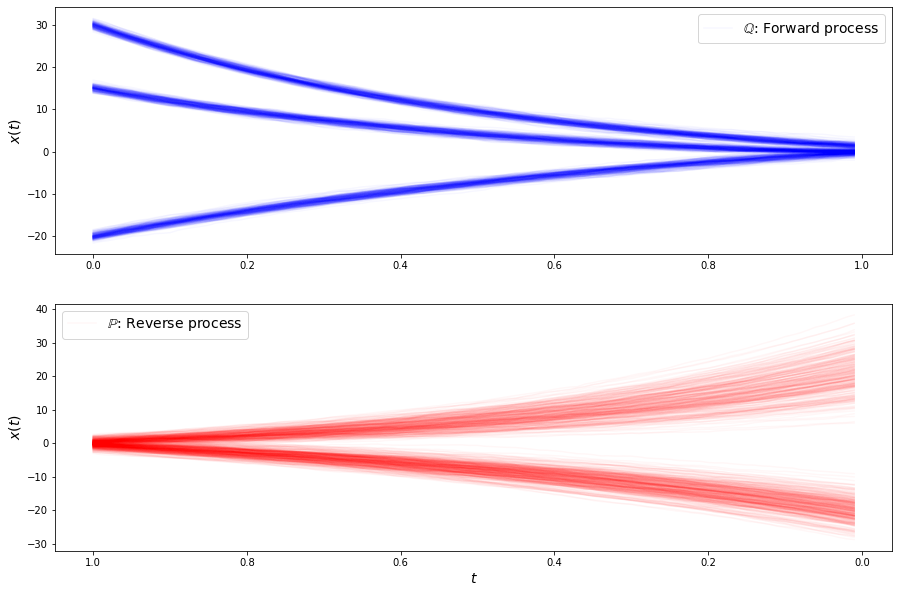

loss b 7.694037437438965
loss b 7.532268047332764
loss b 7.519466876983643
loss b 7.355554103851318
loss b 7.507363319396973
loss b 7.519336700439453
loss b 7.42630672454834
loss b 7.479249954223633
loss b 7.767560958862305
loss b 7.806885242462158
loss b 7.626060962677002
loss b 7.290162563323975
loss b 7.524660587310791
loss b 7.674278259277344
loss b 7.575550079345703
loss b 7.3373236656188965
loss b 7.464494228363037
loss b 7.716220855712891
loss b 7.491654396057129
loss b 7.407495021820068
loss b 7.795167446136475
loss b 7.358804702758789
loss b 7.519031047821045
loss b 7.266498565673828
loss b 7.369710445404053
loss b 7.301417827606201
loss b 7.657744407653809
loss b 7.588813781738281
loss b 7.510009765625
loss b 7.208542823791504
loss f 0.8227729201316833
loss f 0.8414003252983093
loss f 0.9023662209510803
loss f 0.8599167466163635
loss f 0.8552325367927551
loss f 0.8532347083091736
loss f 0.799485445022583
loss f 0.9189980626106262
loss f 0.8329409956932068
loss f 0.87948584556

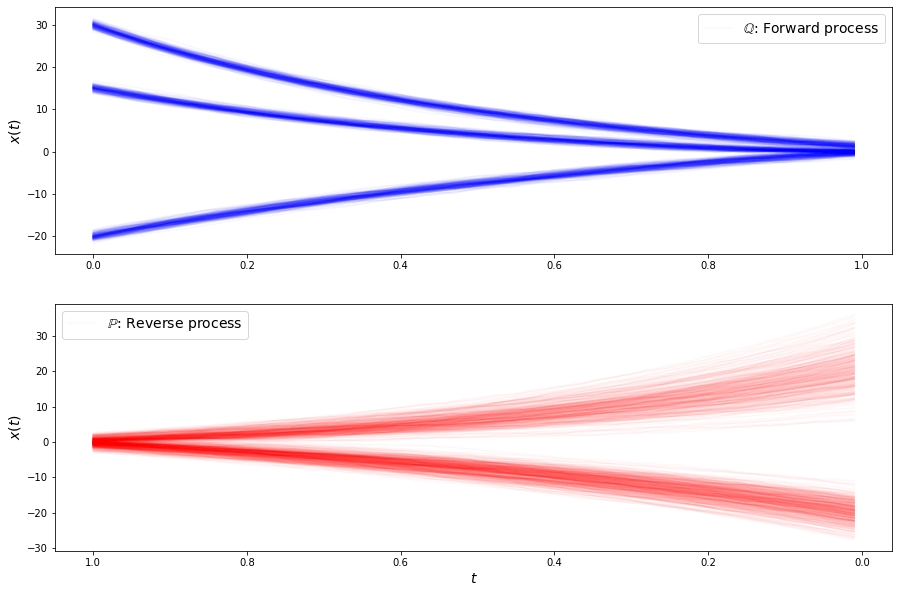

loss b 7.41179084777832
loss b 7.509369373321533
loss b 7.275506019592285
loss b 7.477921009063721
loss b 7.5707244873046875
loss b 7.453737735748291
loss b 7.571934700012207
loss b 7.5075459480285645
loss b 7.338423728942871
loss b 7.300134181976318
loss b 7.478948593139648
loss b 7.254339694976807
loss b 7.650424480438232
loss b 7.573063850402832
loss b 7.332050800323486
loss b 7.26883602142334
loss b 7.548316478729248
loss b 7.3721604347229
loss b 7.31313943862915
loss b 7.6362223625183105
loss b 7.371638774871826
loss b 7.362314701080322
loss b 7.6103081703186035
loss b 7.170004844665527
loss b 7.146529674530029
loss b 7.467611789703369
loss b 7.332813739776611
loss b 7.357170104980469
loss b 6.879324436187744
loss b 7.2216715812683105
loss f 0.8802391290664673
loss f 0.8335943818092346
loss f 0.8417896032333374
loss f 0.8372569680213928
loss f 0.8032740354537964
loss f 0.8974534869194031
loss f 0.8712645769119263
loss f 0.8528620004653931
loss f 0.9334632158279419
loss f 0.8694750

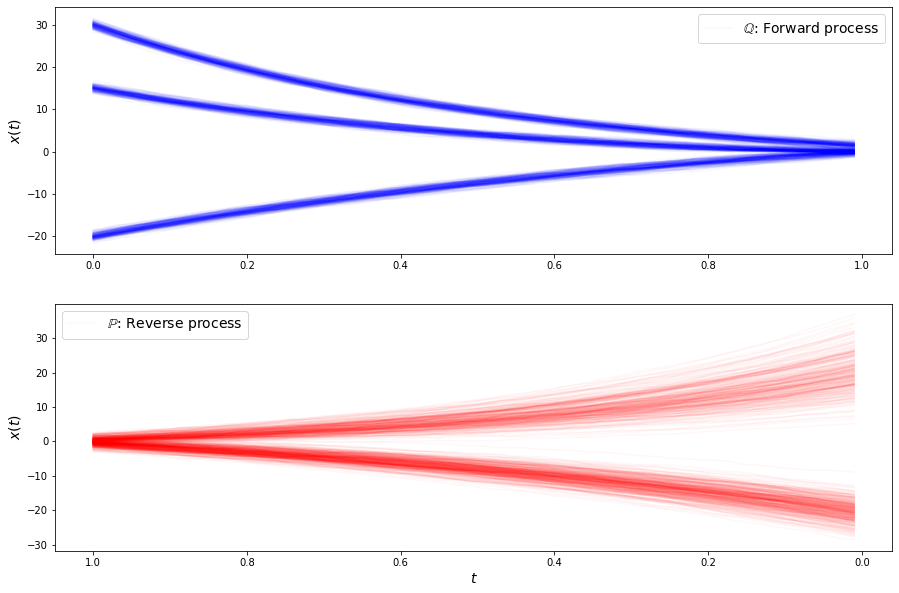

loss b 7.684736728668213
loss b 7.261891841888428
loss b 7.485054016113281
loss b 7.510131359100342
loss b 7.28308629989624
loss b 7.432698726654053
loss b 7.626065254211426
loss b 7.377074241638184
loss b 7.65247106552124
loss b 7.5576171875
loss b 7.442571640014648
loss b 7.388020992279053
loss b 8.103344917297363
loss b 7.864867210388184
loss b 7.786971569061279
loss b 8.072000503540039
loss b 7.769885540008545
loss b 8.138439178466797
loss b 8.01812744140625
loss b 8.37580680847168
loss b 8.648543357849121
loss b 8.302497863769531
loss b 8.5635347366333
loss b 8.213827133178711
loss b 7.961795330047607
loss b 8.044702529907227
loss b 8.074922561645508
loss b 8.188587188720703
loss b 8.176416397094727
loss b 7.736809730529785
loss f 0.9339867830276489
loss f 0.8872380256652832
loss f 0.8161482810974121
loss f 0.8313771486282349
loss f 0.7651500105857849
loss f 0.812882661819458
loss f 0.7273582220077515
loss f 0.6911886930465698
loss f 0.7592788934707642
loss f 0.6706721782684326
lo

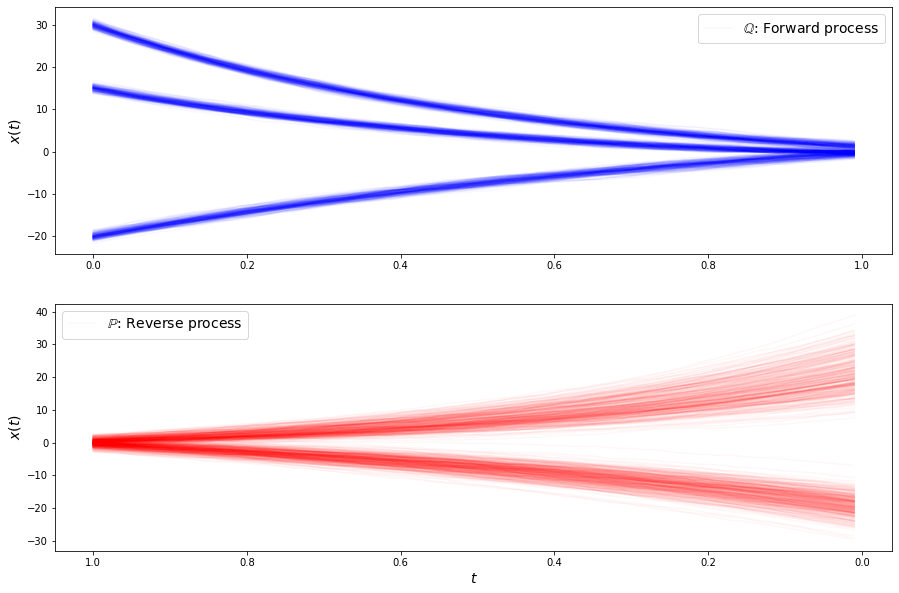

loss b 7.880082130432129
loss b 7.760371685028076
loss b 7.563040256500244
loss b 7.579975605010986
loss b 7.469884872436523
loss b 7.48843240737915
loss b 7.894811630249023
loss b 7.55922269821167
loss b 7.654581069946289
loss b 7.780551910400391
loss b 7.608583927154541
loss b 7.640145301818848
loss b 7.521306991577148
loss b 7.8450188636779785
loss b 7.234086036682129
loss b 7.215445041656494
loss b 7.470119476318359
loss b 7.505823135375977
loss b 7.249418258666992
loss b 7.585605621337891
loss b 7.294347763061523
loss b 7.595255374908447
loss b 7.783701419830322
loss b 7.096283912658691
loss b 7.553216457366943
loss b 7.254186153411865
loss b 7.2614264488220215
loss b 7.652503490447998
loss b 7.489660263061523
loss b 7.485677242279053
loss f 0.6288819313049316
loss f 0.6180684566497803
loss f 0.6451550126075745
loss f 0.5855211615562439
loss f 0.5801026225090027
loss f 0.5627275109291077
loss f 0.6109533309936523
loss f 0.6424252390861511
loss f 0.5901570916175842
loss f 0.5748519

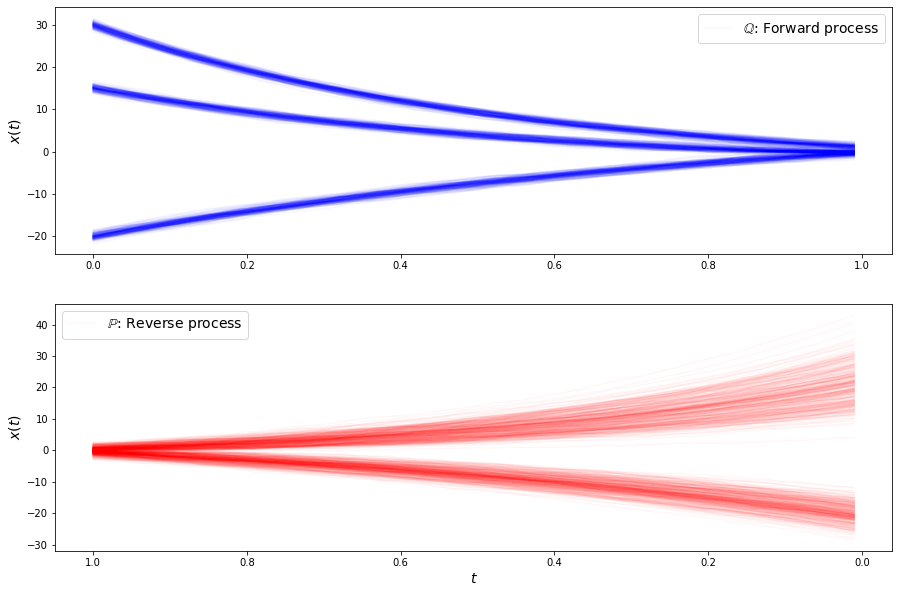

loss b 7.5150651931762695
loss b 7.232979774475098
loss b 7.571218967437744
loss b 7.454463005065918
loss b 7.501103401184082
loss b 7.677033424377441
loss b 7.76249361038208
loss b 7.419437408447266
loss b 7.4697699546813965
loss b 7.547404766082764
loss b 7.2827043533325195
loss b 7.617533206939697
loss b 7.363722324371338
loss b 7.202849388122559
loss b 7.683783531188965
loss b 7.553631782531738
loss b 7.376220703125
loss b 7.687516689300537
loss b 7.403434753417969
loss b 7.3344244956970215
loss b 7.392888069152832
loss b 7.540189743041992
loss b 7.56301736831665
loss b 7.797935485839844
loss b 7.351983547210693
loss b 7.289534568786621
loss b 7.965986251831055
loss b 7.5496721267700195
loss b 7.326452255249023
loss b 7.721828937530518
loss f 0.681623101234436
loss f 0.7178955078125
loss f 0.6897017955780029
loss f 0.691201388835907
loss f 0.6997758746147156
loss f 0.7024332284927368
loss f 0.7571607828140259
loss f 0.6100887656211853
loss f 0.6854474544525146
loss f 0.698801279067

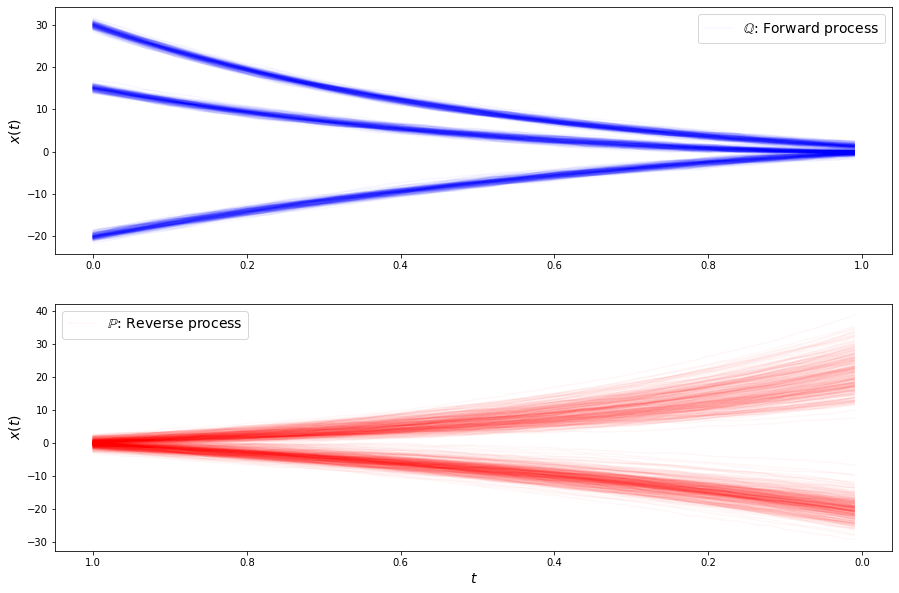

loss b 7.52396821975708
loss b 7.733684539794922
loss b 7.237354755401611
loss b 7.452691078186035
loss b 7.564913749694824
loss b 7.463912487030029
loss b 7.55573034286499
loss b 7.391706466674805
loss b 7.3173956871032715
loss b 7.614406108856201
loss b 7.34025764465332
loss b 7.833238124847412
loss b 7.394591808319092
loss b 7.5418925285339355
loss b 7.574139595031738
loss b 7.485661029815674
loss b 7.353886604309082
loss b 7.42359733581543
loss b 7.750954627990723
loss b 7.560390472412109
loss b 7.462345600128174
loss b 7.52530574798584
loss b 7.401126861572266
loss b 7.774781227111816
loss b 7.490908145904541
loss b 7.617507457733154
loss b 7.084727764129639
loss b 7.362424850463867
loss b 7.689181804656982
loss b 7.158421993255615
loss f 0.7285812497138977
loss f 0.732252836227417
loss f 0.713969886302948
loss f 0.7173781991004944
loss f 0.744234561920166
loss f 0.682733416557312
loss f 0.7091724872589111
loss f 0.6854678988456726
loss f 0.7069283127784729
loss f 0.67378455400466

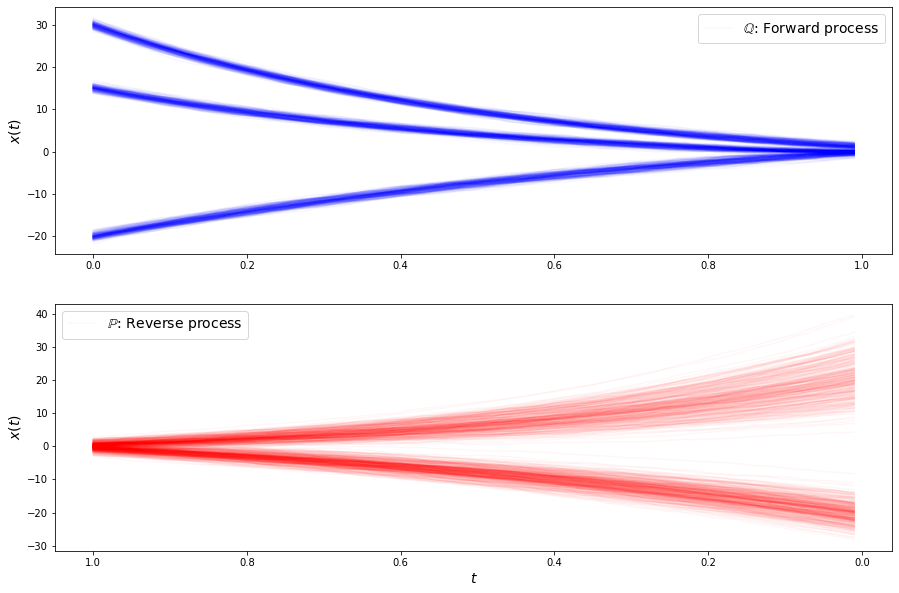

loss b 7.241971015930176
loss b 7.549983501434326
loss b 7.497513771057129
loss b 7.130071640014648
loss b 7.383638858795166
loss b 7.490633964538574
loss b 7.51769495010376
loss b 7.275189399719238
loss b 7.3479180335998535
loss b 7.558823108673096
loss b 7.586716651916504
loss b 7.3901543617248535
loss b 7.203380584716797
loss b 7.385838985443115
loss b 7.382763862609863
loss b 7.21083402633667
loss b 7.348635196685791
loss b 7.376315116882324
loss b 7.503992557525635
loss b 7.921122074127197
loss b 7.067984104156494
loss b 7.525502681732178
loss b 7.660402774810791
loss b 7.016171455383301
loss b 7.3410139083862305
loss b 7.228793621063232
loss b 7.307973384857178
loss b 7.550993919372559
loss b 7.168248653411865
loss b 7.276203632354736
loss f 0.6873555779457092
loss f 0.6832364797592163
loss f 0.7024843096733093
loss f 0.7017993330955505
loss f 0.6373190879821777
loss f 0.6982481479644775
loss f 0.726473331451416
loss f 0.6528960466384888
loss f 0.6942228078842163
loss f 0.7235675

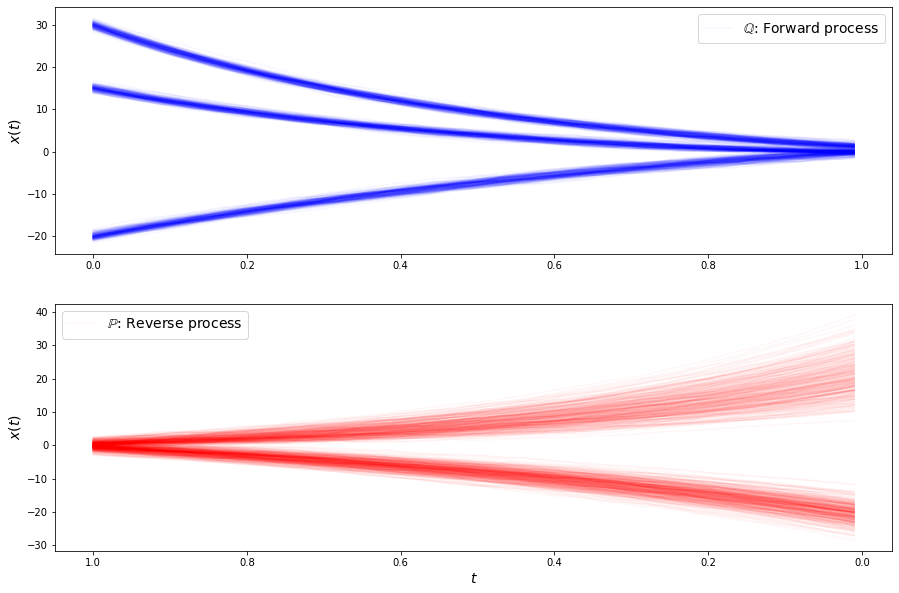

loss b 7.281352996826172
loss b 7.3998494148254395
loss b 7.359826564788818
loss b 7.373795986175537
loss b 7.605753421783447
loss b 7.17097282409668
loss b 7.5421929359436035
loss b 7.385654926300049
loss b 7.150945663452148
loss b 7.710716724395752
loss b 7.2909722328186035
loss b 7.376735210418701
loss b 7.212647914886475
loss b 7.314587593078613
loss b 7.538750171661377
loss b 7.318473815917969
loss b 7.052896022796631
loss b 7.2907562255859375
loss b 7.375349521636963
loss b 7.259884834289551
loss b 7.379636287689209
loss b 7.527603626251221
loss b 7.158994674682617
loss b 7.472786903381348
loss b 7.375366687774658
loss b 7.305245876312256
loss b 7.4690632820129395
loss b 7.402748107910156
loss b 7.377999305725098
loss b 7.591891765594482
loss f 0.8109757900238037
loss f 0.7731333374977112
loss f 0.8076021075248718
loss f 0.7460923790931702
loss f 0.7815071940422058
loss f 0.786124050617218
loss f 0.7437688112258911
loss f 0.7940956354141235
loss f 0.7908276319503784
loss f 0.7593

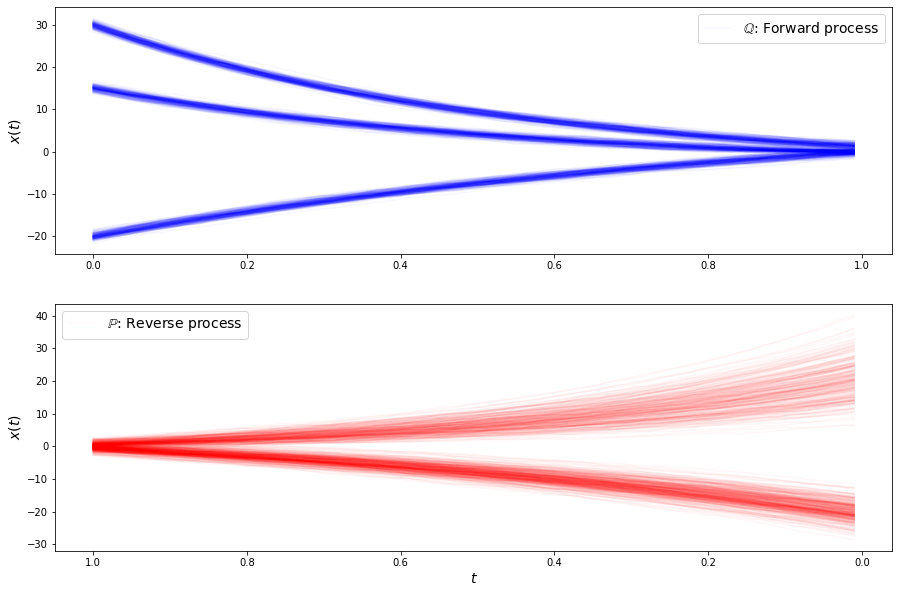

loss b 7.209517478942871
loss b 7.604184627532959
loss b 7.166994571685791
loss b 7.24705696105957
loss b 7.3312249183654785
loss b 7.233249187469482
loss b 7.352017879486084
loss b 7.362611293792725
loss b 6.879889488220215
loss b 7.2594895362854
loss b 7.407769680023193
loss b 7.08375358581543
loss b 7.259052753448486
loss b 7.410744667053223
loss b 7.304708957672119
loss b 6.994140148162842
loss b 7.0902581214904785
loss b 7.107959747314453
loss b 7.390085220336914
loss b 7.13104772567749
loss b 7.021153450012207
loss b 6.949009895324707
loss b 7.1310577392578125
loss b 7.512704372406006
loss b 7.00834846496582
loss b 6.951514720916748
loss b 7.024632453918457
loss b 7.235227108001709
loss b 6.939784526824951
loss b 7.7064208984375
loss f 0.8060067892074585
loss f 0.7712680697441101
loss f 0.8482856750488281
loss f 0.7641748189926147
loss f 0.7754684686660767
loss f 0.7790488004684448
loss f 0.7373052835464478
loss f 0.8168655633926392
loss f 0.7629378437995911
loss f 0.787095665931

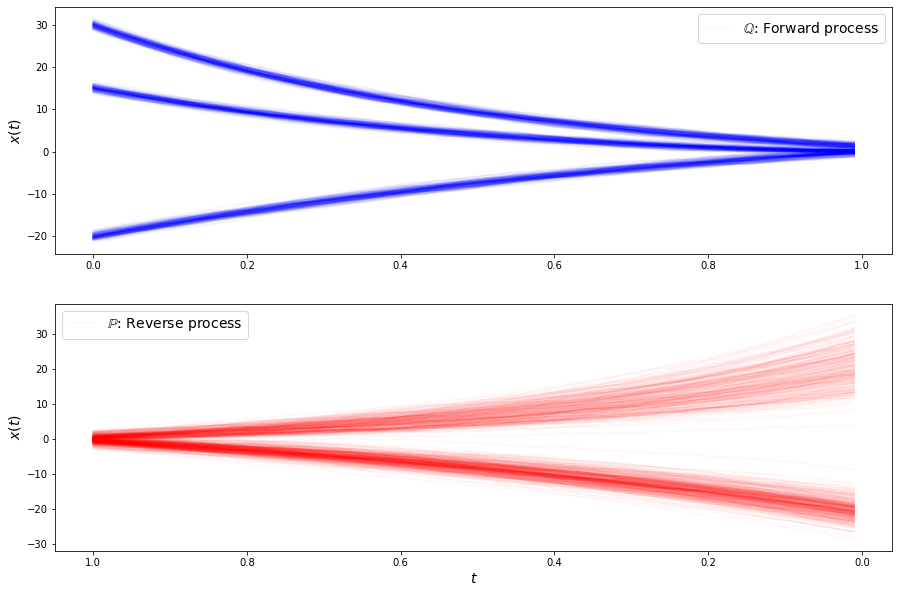

loss b 7.1925859451293945
loss b 7.421979904174805
loss b 7.240983963012695
loss b 7.131692409515381
loss b 6.970208168029785
loss b 7.244755744934082
loss b 7.128242492675781
loss b 7.173938274383545
loss b 7.156767845153809
loss b 7.2164459228515625
loss b 6.976947784423828
loss b 7.2282185554504395
loss b 7.249042987823486
loss b 7.3179497718811035
loss b 7.327182769775391
loss b 7.23253870010376
loss b 6.999152660369873
loss b 7.330127716064453
loss b 7.130370616912842
loss b 7.084732532501221
loss b 7.418058395385742
loss b 7.073125839233398
loss b 7.3219895362854
loss b 7.02742862701416
loss b 7.269986152648926
loss b 6.985702991485596
loss b 7.144768714904785
loss b 7.178038120269775
loss b 7.156852722167969
loss b 7.337541103363037
loss f 1.079777479171753
loss f 1.1404653787612915
loss f 1.080736756324768
loss f 1.074114203453064
loss f 1.0275307893753052
loss f 1.0247422456741333
loss f 1.0039092302322388
loss f 1.0013599395751953
loss f 1.0422993898391724
loss f 1.0270571708

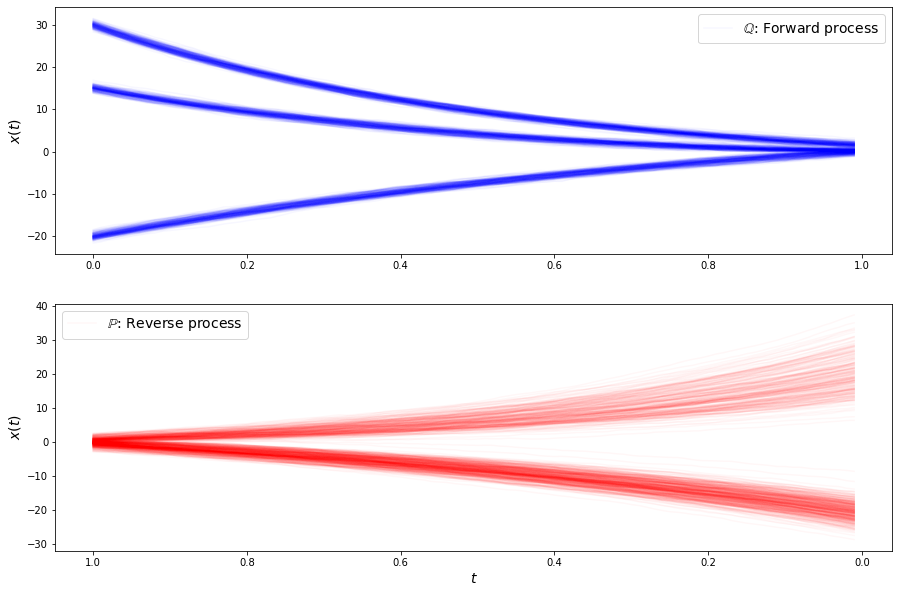

loss b 7.404312610626221
loss b 7.144292831420898
loss b 7.225216865539551
loss b 6.857781887054443
loss b 6.976013660430908
loss b 6.728140354156494
loss b 6.905653953552246
loss b 7.211884498596191
loss b 7.093513011932373
loss b 6.965683937072754
loss b 6.9969401359558105
loss b 6.920344352722168
loss b 6.888040065765381
loss b 6.93289041519165
loss b 6.750330448150635
loss b 7.131621360778809
loss b 6.785956859588623
loss b 6.812929153442383
loss b 7.172831058502197
loss b 7.040722846984863
loss b 7.067180633544922
loss b 7.10508394241333
loss b 6.948848724365234
loss b 7.063467502593994
loss b 7.100015163421631
loss b 6.754634857177734
loss b 6.980111598968506
loss b 6.77685546875
loss b 6.810661315917969
loss b 6.857550621032715
loss f 1.028228759765625
loss f 0.9658942818641663
loss f 0.9917768836021423
loss f 0.9949941635131836
loss f 0.9934883713722229
loss f 0.9605266451835632
loss f 0.9719716906547546
loss f 0.9954257607460022
loss f 0.9230036735534668
loss f 0.9741195440292

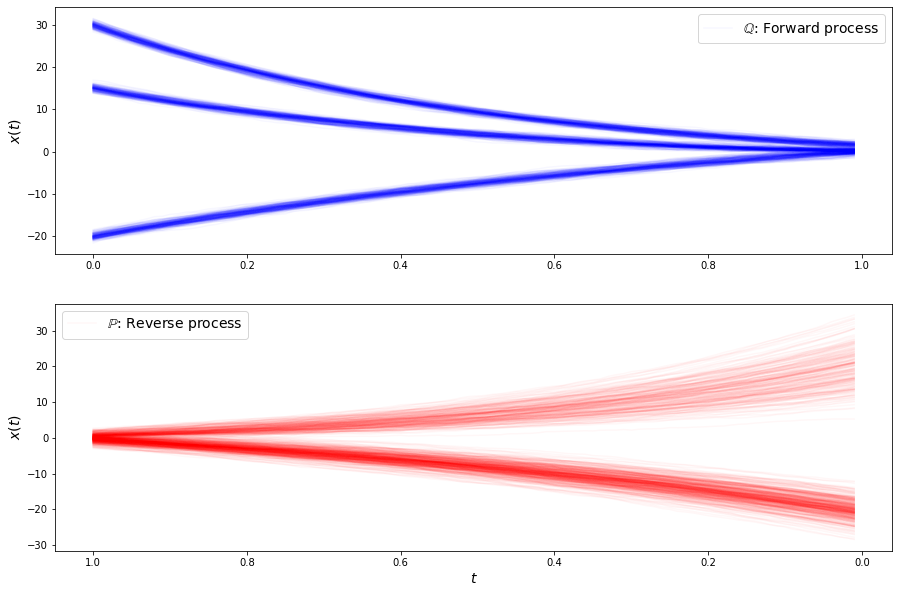

loss b 6.884609222412109
loss b 6.8024702072143555
loss b 7.037482738494873
loss b 6.957038879394531
loss b 6.764917850494385
loss b 6.80554723739624
loss b 6.816722869873047
loss b 6.8335347175598145
loss b 6.686506748199463
loss b 6.917250633239746
loss b 6.760263919830322
loss b 6.953199863433838
loss b 6.752725601196289
loss b 6.9640583992004395
loss b 6.858888149261475
loss b 7.0022783279418945
loss b 7.178553581237793
loss b 7.0623250007629395
loss b 6.748119354248047
loss b 7.021950721740723
loss b 6.798879146575928
loss b 6.764547348022461
loss b 6.591621398925781
loss b 6.761294364929199
loss b 6.752416610717773
loss b 6.843100070953369
loss b 7.029199123382568
loss b 6.814816474914551
loss b 6.804317474365234
loss b 6.873607158660889
loss f 0.9085649251937866
loss f 0.9517443776130676
loss f 0.9221242070198059
loss f 0.8659265637397766
loss f 0.9165540933609009
loss f 0.8949807286262512
loss f 0.9097471237182617
loss f 0.8739669322967529
loss f 0.8834196329116821
loss f 0.903

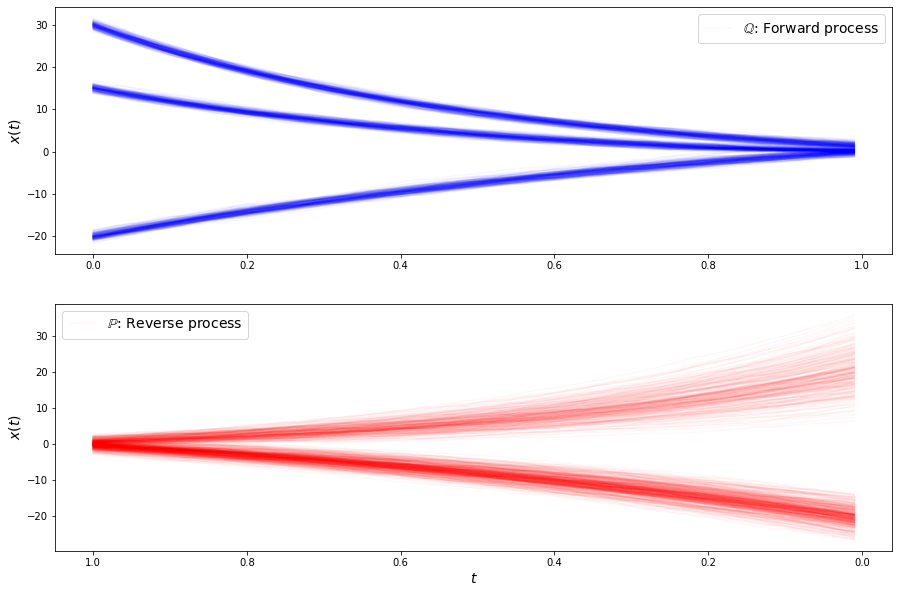

loss b 6.563473701477051
loss b 6.801811695098877
loss b 6.804351329803467
loss b 6.8389387130737305
loss b 6.698348522186279
loss b 6.924315929412842
loss b 7.181967258453369
loss b 6.829740047454834
loss b 6.70490837097168
loss b 7.025853633880615
loss b 6.8827972412109375
loss b 6.622258186340332
loss b 6.676575183868408
loss b 6.930139064788818
loss b 6.8984375
loss b 7.001640796661377
loss b 6.77783727645874
loss b 6.973677158355713
loss b 7.070318698883057
loss b 6.650909900665283
loss b 6.839897155761719
loss b 6.674699783325195
loss b 7.045056343078613
loss b 6.681612014770508
loss b 6.851113319396973
loss b 6.857177734375
loss b 6.839076519012451
loss b 7.010072231292725
loss b 6.805364608764648
loss b 6.706856727600098
loss f 0.9857430458068848
loss f 0.9642335772514343
loss f 0.9633587598800659
loss f 0.9709843993186951
loss f 1.0364311933517456
loss f 0.9651623368263245
loss f 0.9893311858177185
loss f 0.9721277952194214
loss f 1.0709513425827026
loss f 0.9681277871131897
l

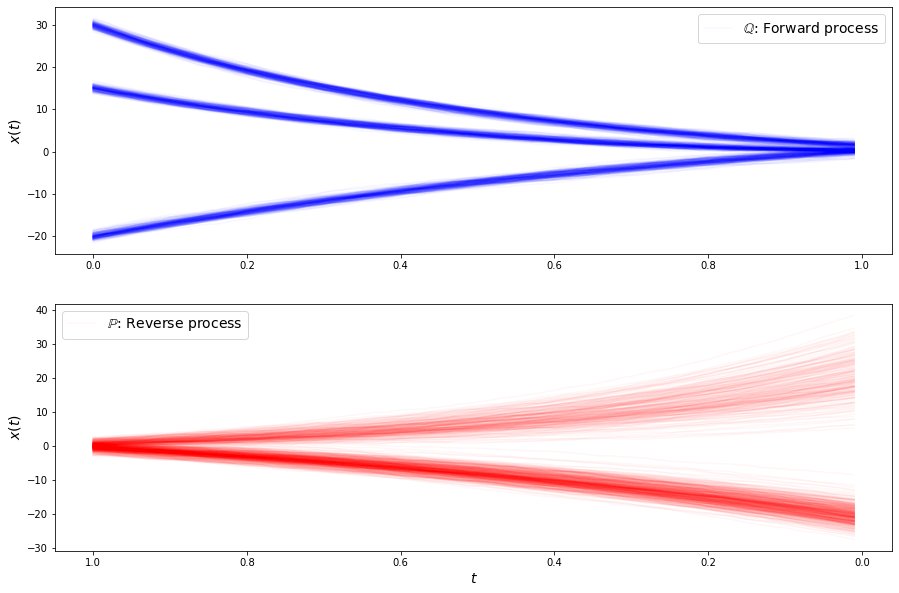

loss b 6.714038848876953
loss b 6.8184638023376465
loss b 6.94358491897583
loss b 6.906872749328613
loss b 7.156727313995361
loss b 7.391180515289307
loss b 7.162268161773682
loss b 7.0094499588012695
loss b 6.852586269378662
loss b 6.923184871673584
loss b 7.10756254196167
loss b 6.98569393157959
loss b 6.7577033042907715
loss b 6.9714250564575195
loss b 7.043595790863037
loss b 6.851906776428223
loss b 6.891125679016113
loss b 7.03773832321167
loss b 7.001961708068848
loss b 7.195476531982422
loss b 6.823251247406006
loss b 6.7775187492370605
loss b 7.0174479484558105
loss b 6.969465255737305
loss b 6.827809810638428
loss b 6.643050670623779
loss b 7.020298480987549
loss b 6.8917317390441895
loss b 6.837221622467041
loss b 6.512106418609619
loss f 1.1534086465835571
loss f 1.1908338069915771
loss f 1.1448382139205933
loss f 1.169039011001587
loss f 1.1766257286071777
loss f 1.068901777267456
loss f 1.0949467420578003
loss f 1.070134162902832
loss f 1.0525521039962769
loss f 1.1141363

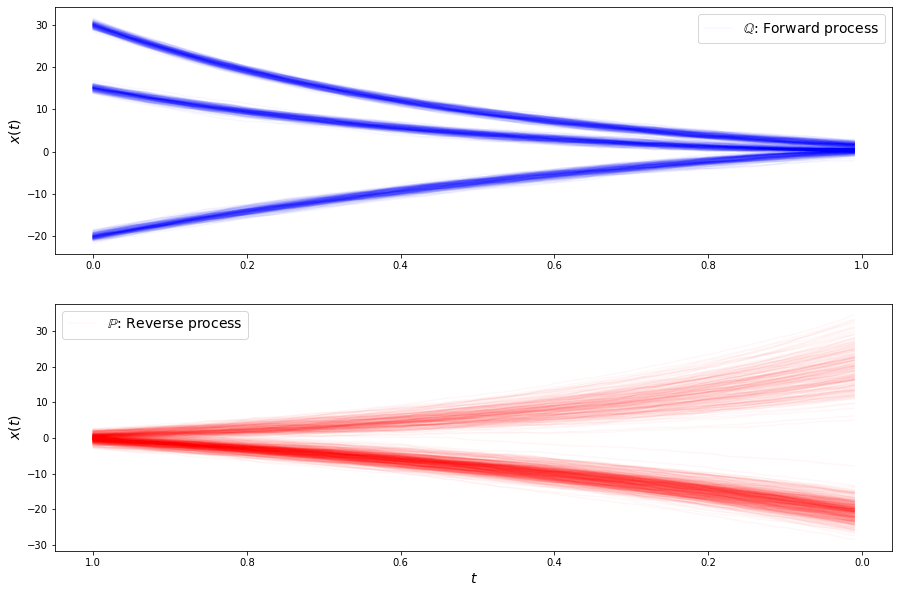

loss b 6.744504928588867
loss b 6.752230644226074
loss b 6.938222408294678
loss b 6.610497951507568
loss b 6.588781356811523
loss b 6.693580627441406
loss b 6.65397834777832
loss b 6.642858982086182
loss b 7.077775478363037
loss b 6.687497138977051
loss b 6.409801959991455
loss b 6.906960487365723
loss b 6.736630439758301
loss b 6.665274143218994
loss b 6.433608531951904
loss b 6.655651569366455
loss b 6.508406162261963
loss b 6.88899040222168
loss b 6.698984146118164
loss b 6.839192867279053
loss b 6.556936264038086
loss b 6.669615268707275
loss b 6.686024188995361
loss b 7.183438777923584
loss b 7.08405065536499
loss b 7.064549922943115
loss b 7.140979290008545
loss b 7.213836193084717
loss b 7.0810465812683105
loss b 7.121327877044678
loss f 2.8870601654052734
loss f 2.740041494369507
loss f 2.401606321334839
loss f 2.2233099937438965
loss f 2.124379873275757
loss f 2.170961380004883
loss f 2.1802244186401367
loss f 2.196960687637329
loss f 2.1876485347747803
loss f 2.30097889900207

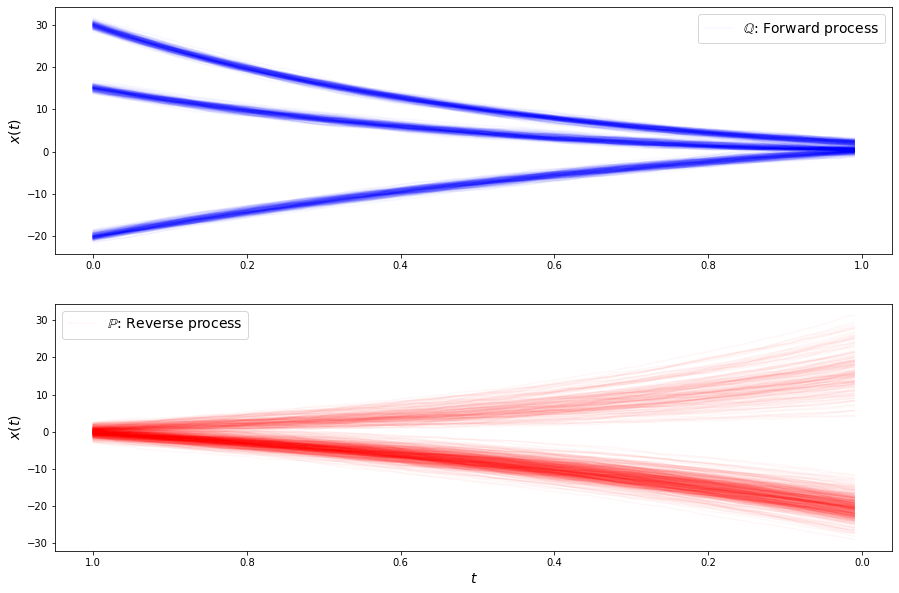

loss b 6.811599254608154
loss b 7.1572957038879395
loss b 6.909010887145996
loss b 6.949539661407471
loss b 6.853241443634033
loss b 6.886723041534424
loss b 6.677279949188232
loss b 6.763734817504883
loss b 6.712651252746582
loss b 6.983954906463623
loss b 7.166042327880859
loss b 6.7484130859375
loss b 6.998284816741943
loss b 7.016552925109863
loss b 6.828277587890625
loss b 6.98765754699707
loss b 7.344974994659424
loss b 6.962708473205566
loss b 6.965545654296875
loss b 7.01311731338501
loss b 6.798067569732666
loss b 6.801089763641357
loss b 6.807044506072998
loss b 6.686893939971924
loss b 7.0078630447387695
loss b 6.932918071746826
loss b 6.6204328536987305
loss b 6.861498832702637
loss b 7.212337493896484
loss b 6.8673882484436035
loss f 2.1041009426116943
loss f 2.184143543243408
loss f 2.0469086170196533
loss f 2.0540614128112793
loss f 2.2122373580932617
loss f 2.1040875911712646
loss f 2.1046693325042725
loss f 2.1494102478027344
loss f 2.0730230808258057
loss f 2.13864088

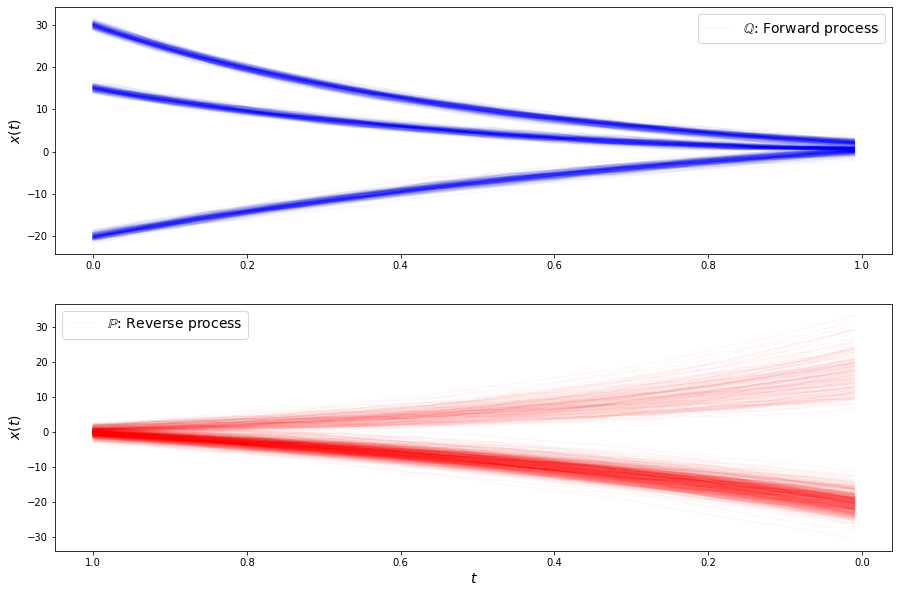

loss b 6.845880508422852
loss b 6.6284966468811035
loss b 6.784543514251709
loss b 6.934873580932617
loss b 6.738077640533447
loss b 6.823879241943359
loss b 6.843258380889893
loss b 6.677037715911865
loss b 6.722751617431641
loss b 6.696704387664795
loss b 6.938596725463867
loss b 6.693305015563965
loss b 6.482054233551025
loss b 6.982244491577148
loss b 6.712446689605713
loss b 6.701808452606201
loss b 6.932853698730469
loss b 6.9364237785339355
loss b 6.448764801025391
loss b 6.5822882652282715
loss b 6.807902812957764
loss b 6.316503524780273
loss b 6.638387680053711
loss b 6.6486945152282715
loss b 6.593555450439453
loss b 6.596056938171387
loss b 7.051953315734863
loss b 7.133281230926514
loss b 6.8035688400268555
loss b 6.758841037750244
loss f 2.0242762565612793
loss f 1.9796185493469238
loss f 1.9948410987854004
loss f 2.021881341934204
loss f 2.041691780090332
loss f 1.83635675907135
loss f 2.033979892730713
loss f 1.930341362953186
loss f 1.9778043031692505
loss f 1.99933052

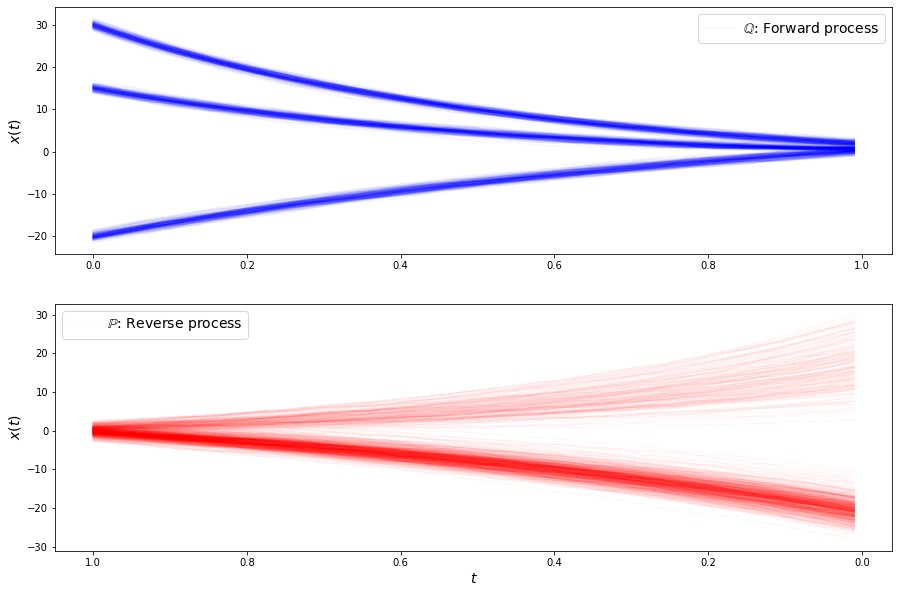

loss b 6.729607105255127
loss b 7.399744510650635
loss b 6.6675567626953125
loss b 6.913041591644287
loss b 6.791540145874023
loss b 6.878661155700684
loss b 6.893019676208496
loss b 6.745615482330322
loss b 6.854806900024414
loss b 6.629961967468262
loss b 6.605800628662109
loss b 6.698351860046387
loss b 6.749130725860596
loss b 6.690256118774414
loss b 6.607185363769531
loss b 6.8338117599487305
loss b 6.479694366455078
loss b 6.61562442779541
loss b 6.8220367431640625
loss b 6.48690128326416
loss b 7.030705451965332
loss b 6.594224452972412
loss b 6.5541534423828125
loss b 6.414464473724365
loss b 6.772718906402588
loss b 6.89846658706665
loss b 6.614612579345703
loss b 6.996243000030518
loss b 6.255529880523682
loss b 7.036890506744385
loss f 1.6775126457214355
loss f 1.679913878440857
loss f 1.657240629196167
loss f 1.6701631546020508
loss f 1.6649246215820312
loss f 1.5832566022872925
loss f 1.6930944919586182
loss f 1.6058971881866455
loss f 1.5451656579971313
loss f 1.68082165

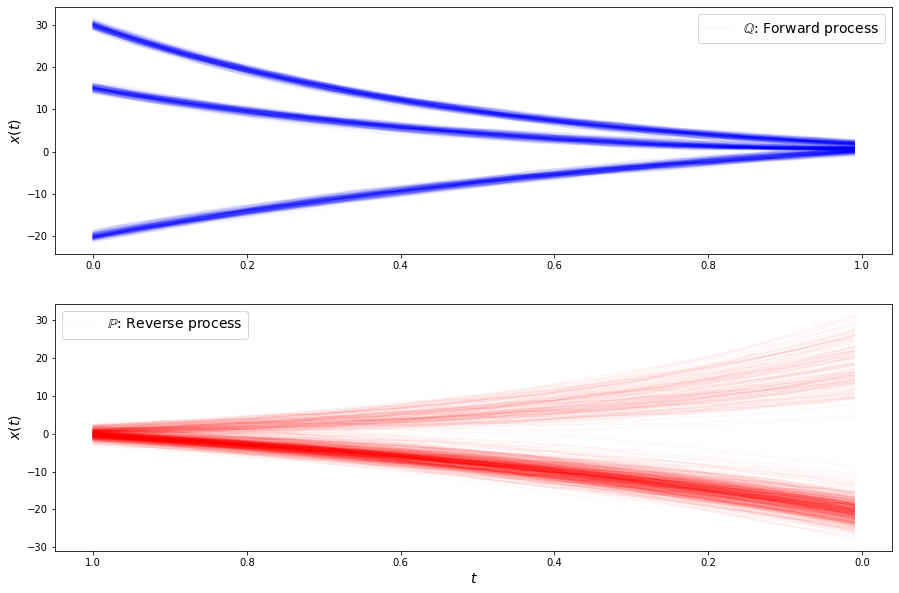

loss b 6.82528829574585
loss b 6.74412202835083
loss b 6.782156467437744
loss b 7.010034561157227
loss b 6.748427867889404
loss b 6.613888740539551
loss b 6.474142551422119
loss b 6.800218105316162
loss b 6.5823445320129395
loss b 6.7758917808532715
loss b 6.930652141571045
loss b 6.6652069091796875
loss b 6.722681999206543
loss b 6.526701927185059
loss b 6.688992500305176
loss b 6.518695831298828
loss b 6.656729221343994
loss b 6.528725624084473
loss b 6.515597343444824
loss b 6.488378524780273
loss b 6.338108539581299
loss b 6.539374828338623
loss b 6.600345611572266
loss b 6.5575761795043945
loss b 6.615034580230713
loss b 6.7085862159729
loss b 6.748935222625732
loss b 6.712616443634033
loss b 6.58713960647583
loss b 6.592001914978027
loss f 1.4774017333984375
loss f 1.3524737358093262
loss f 1.2839032411575317
loss f 1.228320837020874
loss f 1.1844903230667114
loss f 1.1877521276474
loss f 1.2088414430618286
loss f 1.20232355594635
loss f 1.2713111639022827
loss f 1.22348129749298

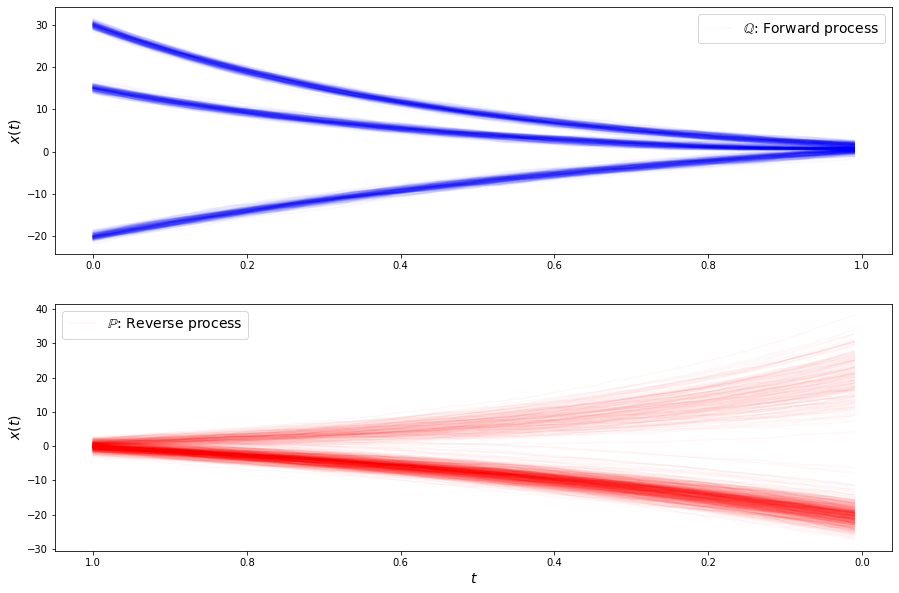

loss b 6.46133279800415
loss b 6.810606479644775
loss b 6.66017484664917
loss b 6.635247230529785
loss b 6.896267890930176
loss b 6.447017192840576
loss b 6.378611087799072
loss b 6.869042873382568
loss b 6.468803405761719
loss b 6.640850067138672
loss b 6.650650501251221
loss b 6.797271728515625
loss b 6.537659645080566
loss b 7.036932468414307
loss b 6.73579740524292
loss b 6.408801555633545
loss b 6.770076274871826
loss b 6.6344404220581055
loss b 6.740116596221924
loss b 6.481186866760254
loss b 6.768147945404053
loss b 6.698500156402588
loss b 6.544398784637451
loss b 6.613190174102783
loss b 6.5684638023376465
loss b 6.741647243499756
loss b 6.513505458831787
loss b 6.777242183685303
loss b 6.6750993728637695
loss b 6.686050891876221
loss f 1.117118000984192
loss f 1.1117348670959473
loss f 1.080584168434143
loss f 1.0863195657730103
loss f 1.0983773469924927
loss f 1.1463786363601685
loss f 1.1096463203430176
loss f 1.130293369293213
loss f 1.1293889284133911
loss f 1.1060093641

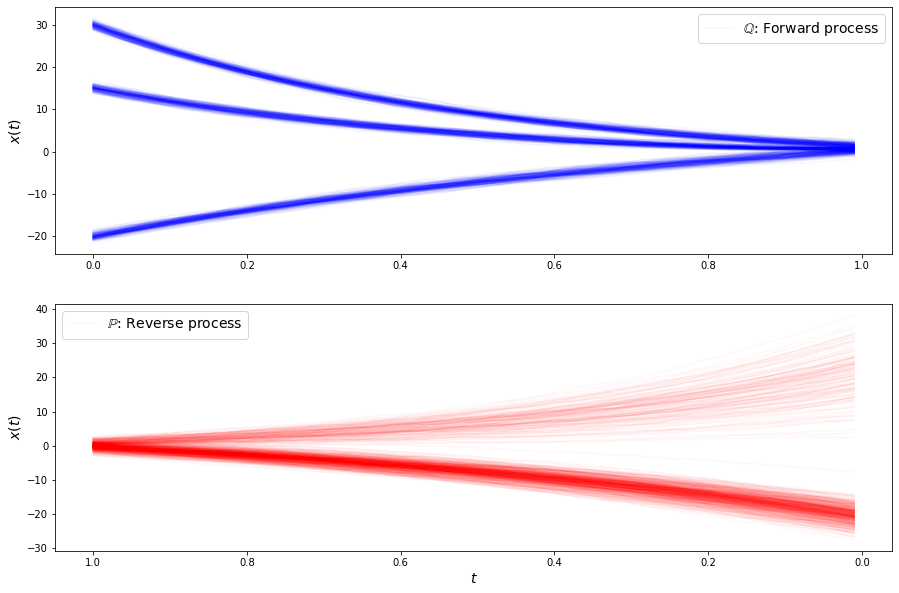

loss b 6.841694355010986
loss b 6.595317363739014
loss b 6.6029438972473145
loss b 6.418612480163574
loss b 6.571126461029053
loss b 6.34164571762085
loss b 6.714877605438232
loss b 6.71929931640625
loss b 6.730254650115967
loss b 6.55552864074707
loss b 6.577513217926025
loss b 6.695591449737549
loss b 6.483814716339111
loss b 6.663597106933594
loss b 6.606326580047607
loss b 6.687770366668701
loss b 6.615711688995361
loss b 6.838953495025635
loss b 6.368311882019043
loss b 6.780601978302002
loss b 6.5592498779296875
loss b 6.750540256500244
loss b 6.385290145874023
loss b 6.664827823638916
loss b 6.8675312995910645
loss b 6.576564788818359
loss b 6.280023574829102
loss b 6.622452735900879
loss b 6.490897178649902
loss b 6.712062358856201
loss f 1.0540200471878052
loss f 0.9902202486991882
loss f 1.008926272392273
loss f 1.0221139192581177
loss f 1.0631344318389893
loss f 1.0213309526443481
loss f 1.0472185611724854
loss f 1.0297540426254272
loss f 1.0255820751190186
loss f 1.04344761

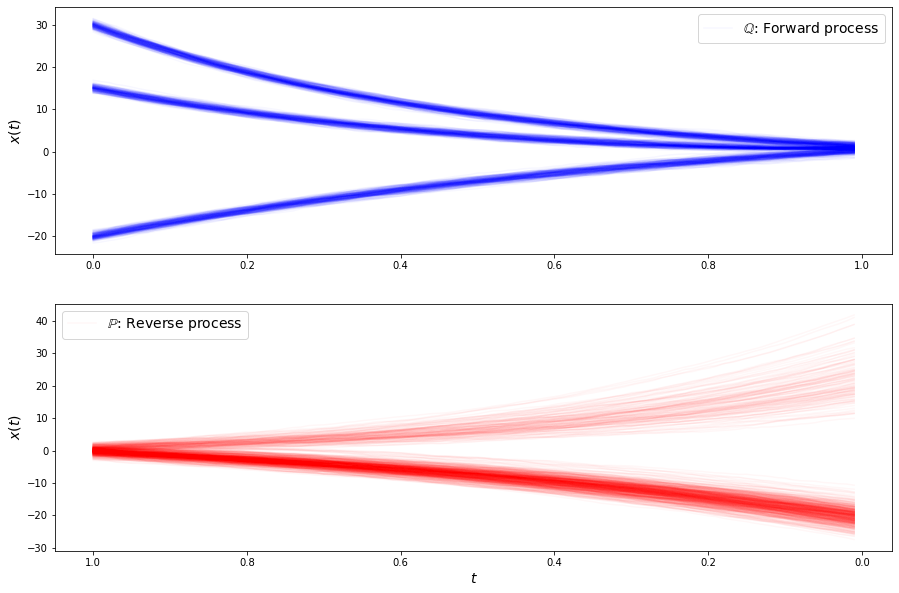

loss b 6.741321563720703
loss b 6.496798038482666
loss b 6.609461307525635
loss b 6.697054862976074
loss b 6.660011291503906
loss b 6.566049098968506
loss b 6.751238822937012
loss b 6.470860958099365
loss b 6.8473286628723145
loss b 6.71320915222168
loss b 6.487432479858398
loss b 6.89246940612793
loss b 6.793851852416992
loss b 6.906379222869873
loss b 6.416474342346191
loss b 7.085883140563965
loss b 6.844844341278076
loss b 6.596399784088135
loss b 6.664604187011719
loss b 6.396953582763672
loss b 6.513214111328125
loss b 6.5767292976379395
loss b 6.625004291534424
loss b 6.620728969573975
loss b 6.650779724121094
loss b 6.635857105255127
loss b 6.557674407958984
loss b 6.934229373931885
loss b 6.484807014465332
loss b 6.630456924438477
loss f 1.0206420421600342
loss f 0.9606488943099976
loss f 0.9454302787780762
loss f 0.9484692811965942
loss f 0.8728429675102234
loss f 0.9631272554397583
loss f 0.9498511552810669
loss f 1.0070017576217651
loss f 0.9229695200920105
loss f 0.9524093

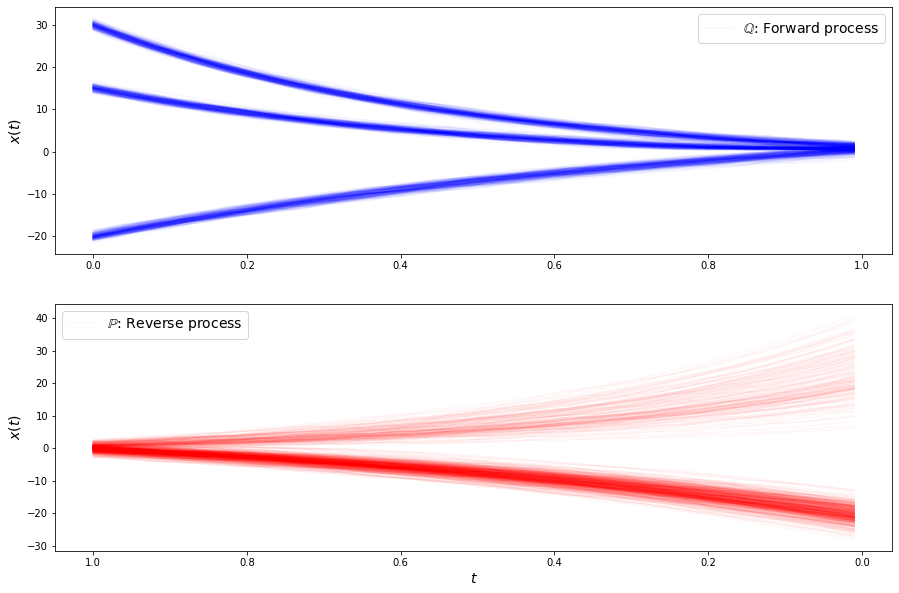

loss b 6.602640151977539
loss b 6.371626853942871
loss b 6.762815952301025
loss b 6.430426597595215
loss b 6.915495872497559
loss b 6.519198417663574
loss b 6.804914474487305
loss b 6.8691935539245605
loss b 6.513620376586914
loss b 6.817346572875977
loss b 6.597543239593506
loss b 6.503422260284424
loss b 6.637365818023682
loss b 6.953310489654541
loss b 6.846711158752441
loss b 6.672726154327393
loss b 6.711940765380859
loss b 6.79641056060791
loss b 6.825758457183838
loss b 6.794466495513916
loss b 6.457888126373291
loss b 7.220386028289795
loss b 6.845059871673584
loss b 6.8055620193481445
loss b 6.412515163421631
loss b 6.77108907699585
loss b 6.605217456817627
loss b 6.5835981369018555
loss b 6.337315082550049
loss b 7.009833335876465
loss f 1.2103410959243774
loss f 1.2166138887405396
loss f 1.121953010559082
loss f 1.1602563858032227
loss f 1.0999994277954102
loss f 1.0986182689666748
loss f 1.104127287864685
loss f 1.177139163017273
loss f 1.1267255544662476
loss f 1.081045985

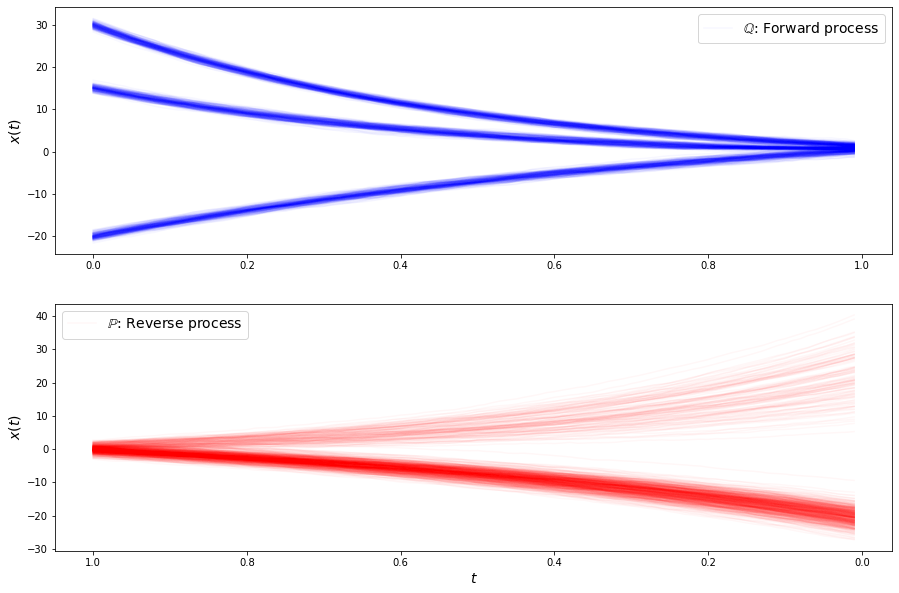

loss b 6.557613849639893
loss b 6.6881303787231445
loss b 6.89736270904541
loss b 6.305710315704346
loss b 6.526043891906738
loss b 6.648047924041748
loss b 6.560608863830566
loss b 6.604473114013672
loss b 6.869719982147217
loss b 6.777527809143066
loss b 6.451574802398682
loss b 6.584389686584473
loss b 6.961627006530762
loss b 6.65221643447876
loss b 7.170437335968018
loss b 6.716940402984619
loss b 6.553268909454346
loss b 6.911360263824463
loss b 7.107775688171387
loss b 6.5599493980407715
loss b 6.758727550506592
loss b 6.963988780975342
loss b 6.806449890136719
loss b 6.65939998626709
loss b 6.714034080505371
loss b 6.58717155456543
loss b 6.742221355438232
loss b 6.75430965423584
loss b 6.763129234313965
loss b 6.72698450088501
loss f 1.553519606590271
loss f 1.4992531538009644
loss f 1.5402474403381348
loss f 1.4801607131958008
loss f 1.4508386850357056
loss f 1.4590420722961426
loss f 1.410706877708435
loss f 1.5157220363616943
loss f 1.4221563339233398
loss f 1.3707193136215

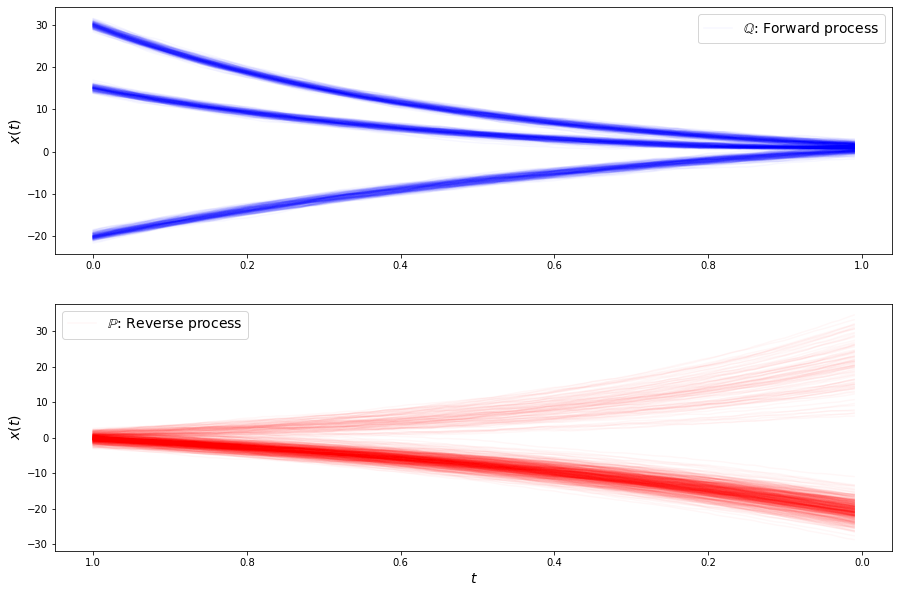

loss b 6.551168918609619
loss b 6.8644304275512695
loss b 6.695253372192383
loss b 6.344943046569824
loss b 6.608852863311768
loss b 6.86912202835083
loss b 6.543674468994141
loss b 6.643557548522949
loss b 6.433849334716797
loss b 6.668400764465332
loss b 6.4721999168396
loss b 6.702624320983887
loss b 6.549365043640137
loss b 6.581798553466797
loss b 6.45820426940918
loss b 6.565629005432129
loss b 6.486423492431641
loss b 6.6980366706848145
loss b 6.774156093597412
loss b 6.879717826843262
loss b 6.530163764953613
loss b 6.5991597175598145
loss b 6.781750679016113
loss b 7.069129943847656
loss b 6.654581069946289
loss b 7.100643634796143
loss b 6.9585652351379395
loss b 6.795839786529541
loss b 6.665982723236084
loss b 6.826426982879639
loss f 1.7166991233825684
loss f 1.4199252128601074
loss f 1.2023952007293701
loss f 1.0852046012878418
loss f 0.9139918684959412
loss f 0.9050168395042419
loss f 0.8906323909759521
loss f 0.9702463746070862
loss f 1.000476598739624
loss f 1.05299770

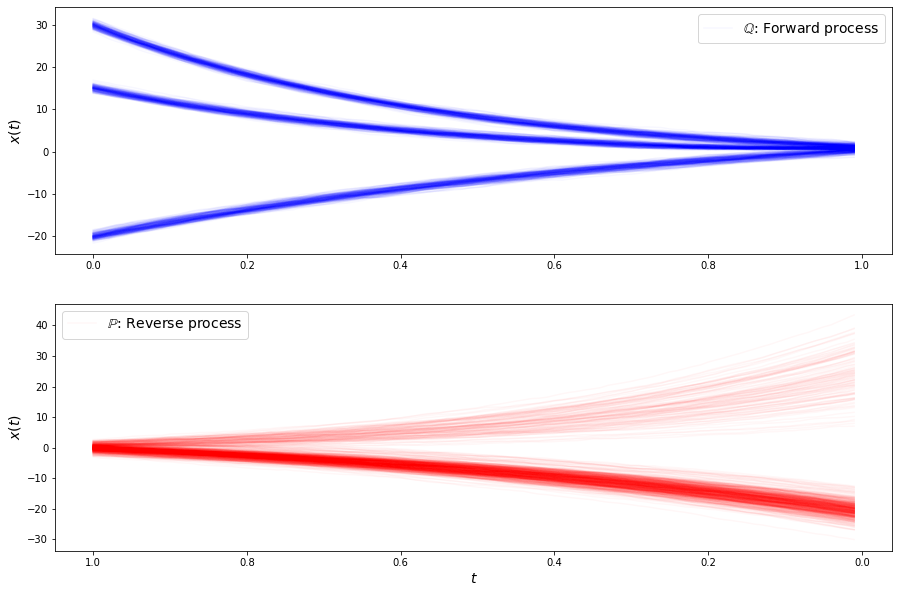

loss b 6.723562717437744
loss b 6.585030555725098
loss b 6.693729400634766
loss b 6.923248767852783
loss b 6.89148473739624
loss b 6.806277751922607
loss b 6.979799270629883
loss b 6.601216793060303
loss b 6.514563083648682
loss b 6.935486793518066
loss b 6.855257511138916
loss b 6.743968963623047
loss b 6.871197700500488
loss b 6.908738136291504
loss b 6.820277690887451
loss b 6.783106803894043
loss b 7.019388198852539
loss b 6.483044624328613
loss b 6.9037394523620605
loss b 6.979352951049805
loss b 6.818894386291504
loss b 6.671724319458008
loss b 6.896459579467773
loss b 6.597249984741211
loss b 6.893064022064209
loss b 6.429075717926025
loss b 6.548970699310303
loss b 6.565768241882324
loss b 6.946307182312012
loss b 6.632500648498535
loss f 0.9632878303527832
loss f 0.9904897809028625
loss f 0.9989587664604187
loss f 0.9621115326881409
loss f 0.9544252753257751
loss f 0.9109735488891602
loss f 0.928970992565155
loss f 0.9337480068206787
loss f 0.9013872146606445
loss f 0.87083488

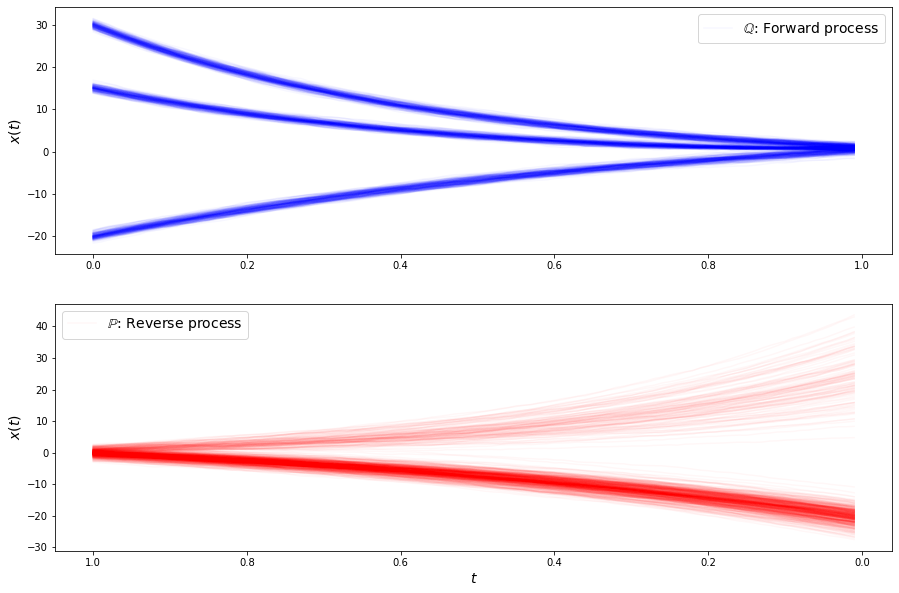

loss b 6.884517192840576
loss b 6.933753967285156
loss b 6.474453449249268
loss b 6.748508453369141
loss b 6.9213457107543945
loss b 6.49022912979126
loss b 6.774064064025879
loss b 6.799343109130859
loss b 6.870497226715088
loss b 7.13200569152832
loss b 7.348822116851807
loss b 6.989509582519531
loss b 6.753504276275635
loss b 6.82653284072876
loss b 7.05189323425293
loss b 7.105967998504639
loss b 6.904930591583252
loss b 6.713302135467529
loss b 6.64355993270874
loss b 6.968129634857178
loss b 6.565936088562012
loss b 6.76307487487793
loss b 6.781263828277588
loss b 6.606051445007324
loss b 6.866988182067871
loss b 6.715704917907715
loss b 6.689667224884033
loss b 6.717649936676025
loss b 6.7114338874816895
loss b 6.481383323669434
loss f 1.3665703535079956
loss f 1.2536710500717163
loss f 1.2078652381896973
loss f 1.135940670967102
loss f 1.1246997117996216
loss f 1.144068956375122
loss f 1.112777829170227
loss f 1.1104601621627808
loss f 1.1238770484924316
loss f 1.10809493064880

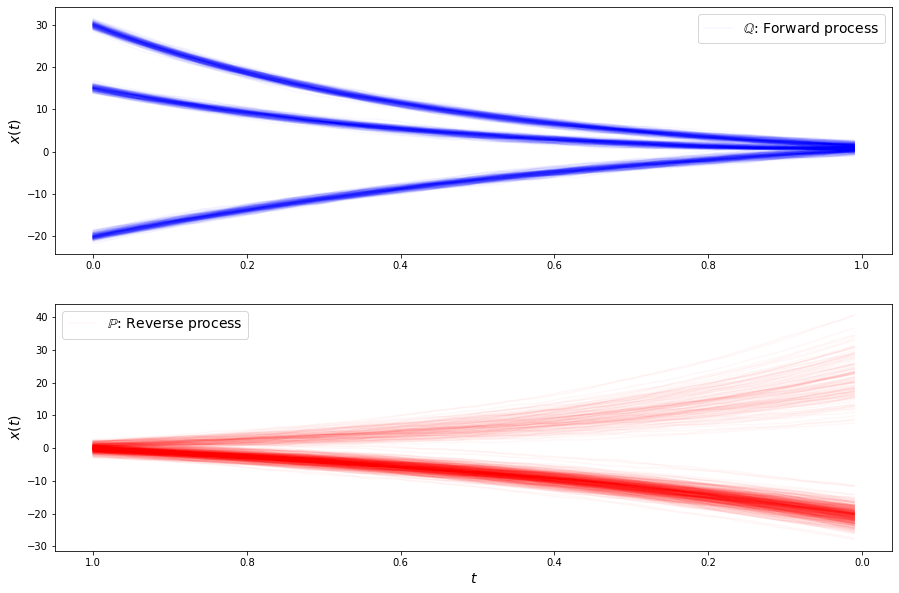

loss b 6.803094387054443
loss b 6.885364055633545
loss b 6.725397109985352
loss b 7.01546573638916
loss b 6.667437553405762
loss b 6.881411075592041
loss b 6.97575569152832
loss b 6.621947288513184
loss b 6.992076396942139
loss b 6.517472743988037
loss b 6.996615409851074
loss b 7.05597448348999
loss b 6.613282680511475
loss b 6.7876362800598145
loss b 7.043298721313477
loss b 6.50783634185791
loss b 6.876455783843994
loss b 6.655655384063721
loss b 6.773494243621826
loss b 6.807768821716309
loss b 6.572701454162598
loss b 6.595739364624023
loss b 6.657995700836182
loss b 6.93278694152832
loss b 6.510652542114258
loss b 6.730835914611816
loss b 6.915903568267822
loss b 6.728190898895264
loss b 6.611561298370361
loss b 7.060826301574707
loss f 1.1790369749069214
loss f 1.2297041416168213
loss f 1.1757529973983765
loss f 1.2664344310760498
loss f 1.2129460573196411
loss f 1.183056116104126
loss f 1.2214713096618652
loss f 1.2982752323150635
loss f 1.1969068050384521
loss f 1.258706212043

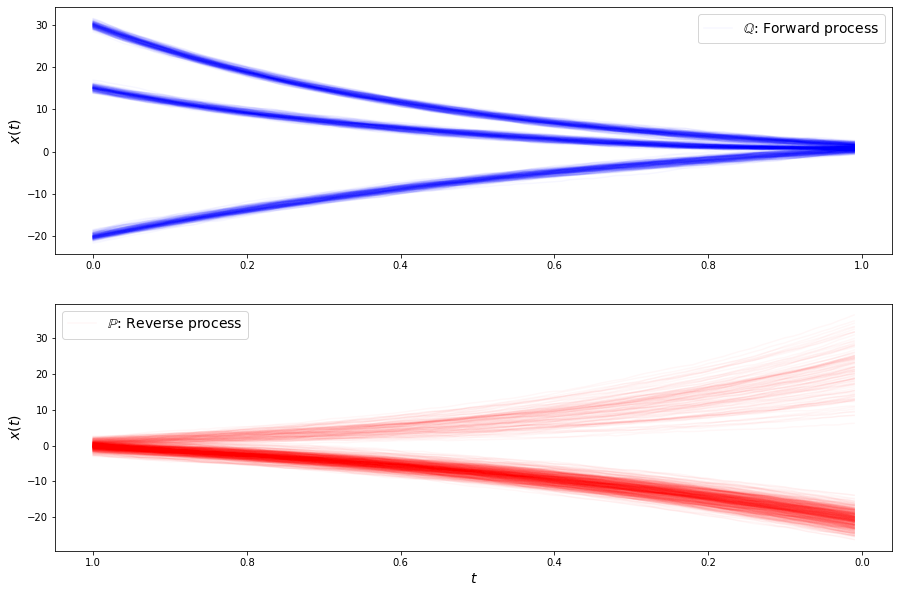

loss b 6.649083137512207
loss b 6.9631853103637695
loss b 7.0484514236450195
loss b 6.576220989227295
loss b 6.518274307250977
loss b 6.934718132019043
loss b 6.569516658782959
loss b 6.947182655334473
loss b 7.1829071044921875
loss b 7.196241855621338
loss b 6.760476589202881
loss b 7.513409614562988
loss b 7.239351272583008
loss b 7.278387546539307
loss b 7.191678524017334
loss b 6.988740921020508
loss b 6.775000095367432
loss b 6.906955718994141
loss b 7.0971360206604
loss b 7.115091800689697
loss b 6.926400184631348
loss b 7.117101192474365
loss b 7.008288860321045
loss b 6.674838066101074
loss b 6.931434631347656
loss b 6.78493595123291
loss b 7.101198673248291
loss b 7.103820323944092
loss b 6.895234107971191
loss b 6.962961673736572
loss f 1.309664249420166
loss f 1.3026760816574097
loss f 1.202894687652588
loss f 1.2015577554702759
loss f 1.2071533203125
loss f 1.2715646028518677
loss f 1.1603957414627075
loss f 1.1901190280914307
loss f 1.1550889015197754
loss f 1.133685708045

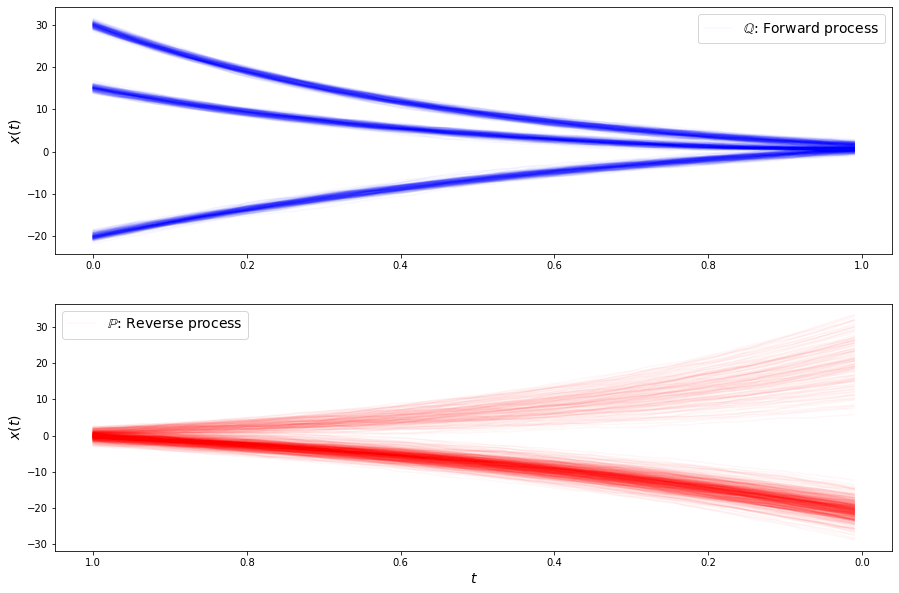

loss b 7.144079208374023
loss b 7.234402656555176
loss b 7.241094589233398
loss b 7.246912479400635
loss b 7.045351982116699
loss b 7.258003234863281
loss b 7.131940841674805
loss b 7.155245780944824
loss b 6.969881057739258
loss b 6.927802085876465
loss b 6.915770053863525
loss b 6.891583442687988
loss b 6.9215874671936035
loss b 6.953581809997559
loss b 7.104884147644043
loss b 7.129852771759033
loss b 7.0759992599487305
loss b 7.025429725646973
loss b 6.991157054901123
loss b 7.264700889587402
loss b 6.995577812194824
loss b 7.156252861022949
loss b 6.9061360359191895
loss b 7.177018165588379
loss b 7.154046058654785
loss b 7.288043975830078
loss b 7.000040054321289
loss b 7.073652744293213
loss b 7.409346580505371
loss b 7.414902687072754
loss f 1.0354477167129517
loss f 0.9912664890289307
loss f 0.9744933247566223
loss f 0.9884647727012634
loss f 0.993899941444397
loss f 0.96278977394104
loss f 0.9816334247589111
loss f 0.9778463244438171
loss f 1.001145839691162
loss f 1.01883876

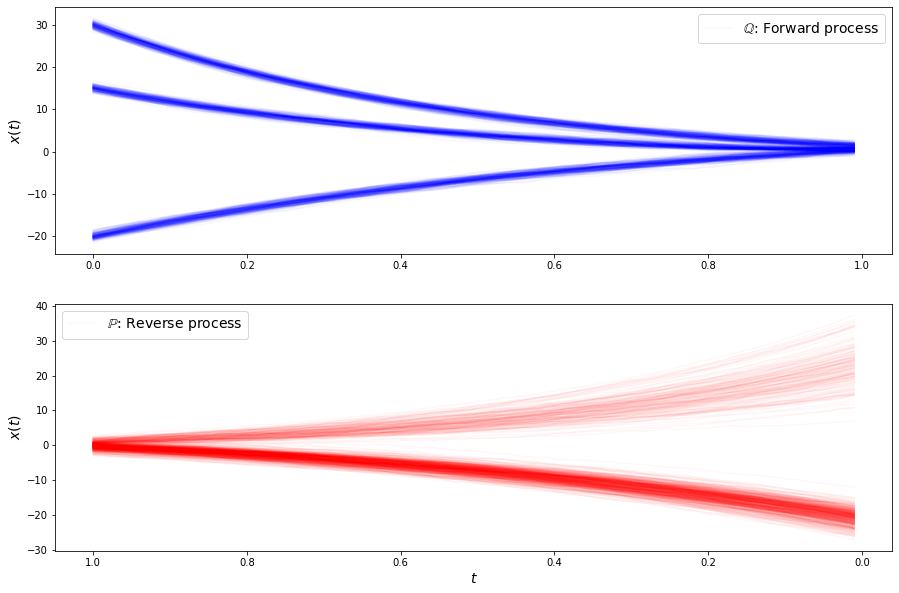

loss b 7.15364933013916
loss b 7.035478591918945
loss b 7.370697975158691
loss b 7.069761753082275
loss b 6.950071334838867
loss b 7.40313196182251
loss b 7.186440944671631
loss b 7.085559844970703
loss b 7.134199142456055
loss b 7.262800216674805
loss b 7.212280750274658
loss b 7.292667865753174
loss b 7.061897277832031
loss b 7.102766036987305
loss b 7.1100053787231445
loss b 7.0138373374938965
loss b 6.80717658996582
loss b 6.945076942443848
loss b 7.035183429718018
loss b 7.276995658874512
loss b 7.011172294616699
loss b 7.0327019691467285
loss b 7.235424995422363
loss b 7.11867618560791
loss b 7.167720794677734
loss b 7.177618026733398
loss b 6.8882737159729
loss b 7.028604984283447
loss b 6.997286319732666
loss b 7.353545188903809
loss f 1.0105067491531372
loss f 1.007896900177002
loss f 0.9686393141746521
loss f 1.030764102935791
loss f 1.009982943534851
loss f 0.9423455595970154
loss f 1.0288112163543701
loss f 0.9688514471054077
loss f 0.9543381929397583
loss f 0.9809402823448

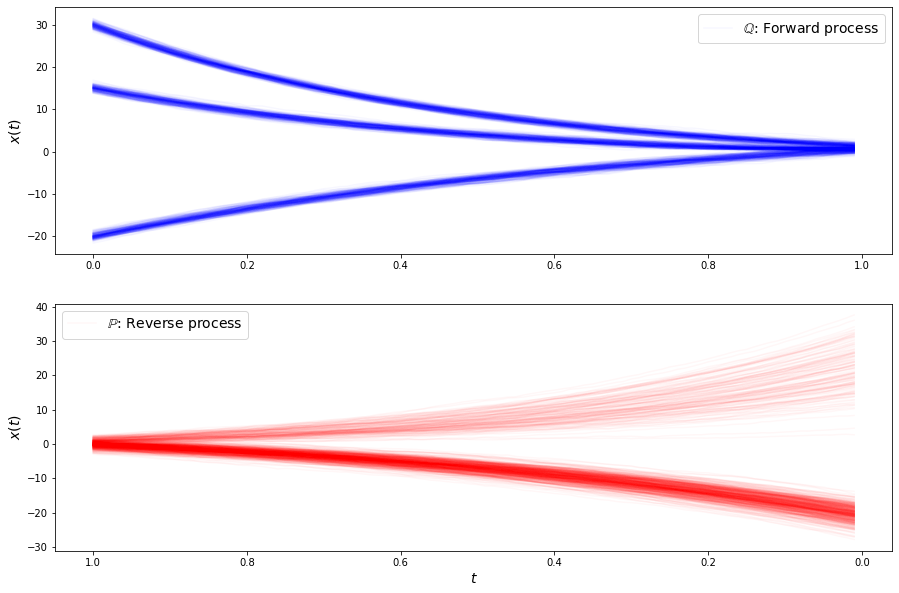

loss b 6.962344646453857
loss b 6.987946510314941
loss b 6.948089122772217
loss b 6.843742847442627
loss b 7.206942558288574
loss b 7.296395301818848
loss b 6.846907138824463
loss b 6.913371562957764
loss b 7.020326614379883
loss b 7.007198810577393
loss b 7.213486194610596
loss b 7.038817405700684
loss b 6.920314788818359
loss b 7.093320369720459
loss b 6.881237506866455
loss b 7.180823802947998
loss b 7.040153980255127
loss b 7.192406177520752
loss b 7.1728081703186035
loss b 7.1242356300354
loss b 7.174571990966797
loss b 6.855751991271973
loss b 7.3499956130981445
loss b 6.966709136962891
loss b 6.895318984985352
loss b 6.97610330581665
loss b 6.975543975830078
loss b 7.390964508056641
loss b 7.137000560760498
loss b 7.178731918334961
loss f 1.2759062051773071
loss f 1.2566550970077515
loss f 1.170313835144043
loss f 1.1476606130599976
loss f 1.1747369766235352
loss f 1.1665385961532593
loss f 1.1287785768508911
loss f 1.1064672470092773
loss f 1.1762157678604126
loss f 1.151350617

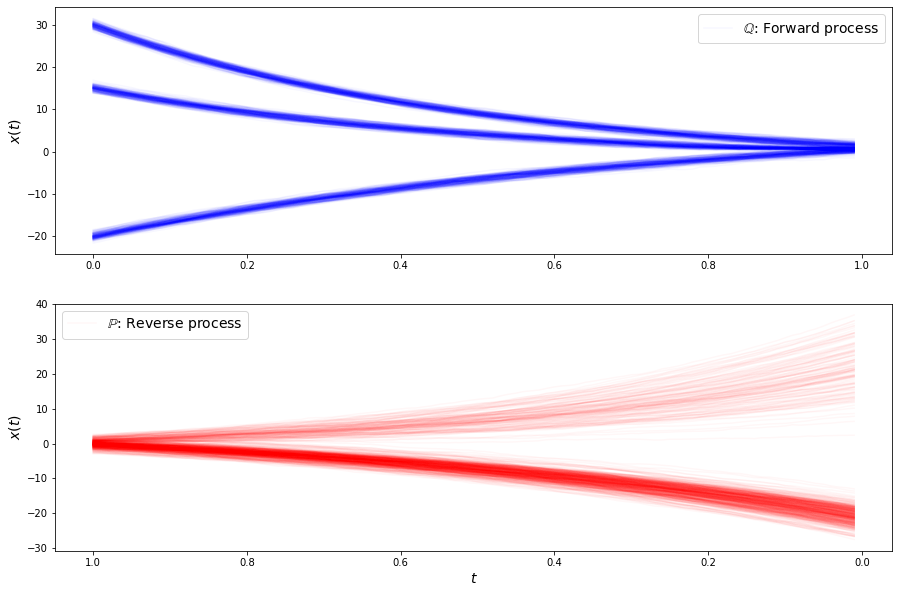

loss b 7.166164398193359
loss b 7.0359930992126465
loss b 6.996119499206543
loss b 6.976086139678955
loss b 7.187419414520264
loss b 7.306319236755371
loss b 7.210955619812012
loss b 7.147393226623535
loss b 7.05264949798584
loss b 7.279379844665527
loss b 7.21690559387207
loss b 7.101012706756592
loss b 7.029553413391113
loss b 6.947155475616455
loss b 7.3175883293151855
loss b 7.20821475982666
loss b 7.028102874755859
loss b 7.076676368713379
loss b 6.7761359214782715
loss b 7.054232120513916
loss b 6.96633768081665
loss b 7.399648666381836
loss b 7.1278181076049805
loss b 7.328059673309326
loss b 7.357089519500732
loss b 7.229214668273926
loss b 7.528419494628906
loss b 7.002822399139404
loss b 7.1414713859558105
loss b 6.964881896972656
loss f 1.5584614276885986
loss f 1.5140377283096313
loss f 1.488851547241211
loss f 1.4068866968154907
loss f 1.4436227083206177
loss f 1.4663065671920776
loss f 1.428276777267456
loss f 1.4613438844680786
loss f 1.4874111413955688
loss f 1.46749544

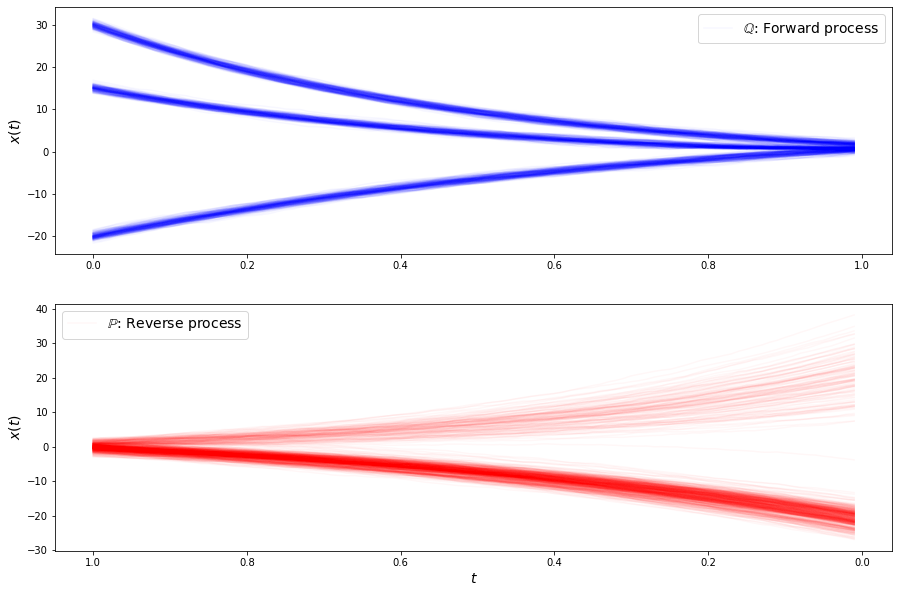

loss b 6.901627540588379
loss b 6.861204624176025
loss b 6.6534929275512695
loss b 6.864933490753174
loss b 6.97887659072876
loss b 6.85457706451416
loss b 7.115029811859131
loss b 6.90197229385376
loss b 6.879706859588623
loss b 6.962602138519287
loss b 6.73182487487793
loss b 6.54278039932251
loss b 7.122829914093018
loss b 6.865596294403076
loss b 6.94619083404541
loss b 6.735783100128174
loss b 6.998064041137695
loss b 6.959773540496826
loss b 6.692276477813721
loss b 7.409661293029785
loss b 8.065208435058594
loss b 9.650093078613281
loss b 12.021371841430664
loss b 13.475701332092285
loss b 17.360700607299805
loss b 18.12349510192871
loss b 20.13254737854004
loss b 17.938926696777344
loss b 14.496844291687012
loss b 12.474236488342285
loss f 5.105246067047119
loss f 3.63946533203125
loss f 2.3685216903686523
loss f 1.445743441581726
loss f 0.8680183291435242
loss f 0.7194421291351318
loss f 0.7204859256744385
loss f 0.8952730894088745
loss f 1.1457982063293457
loss f 1.3407577276

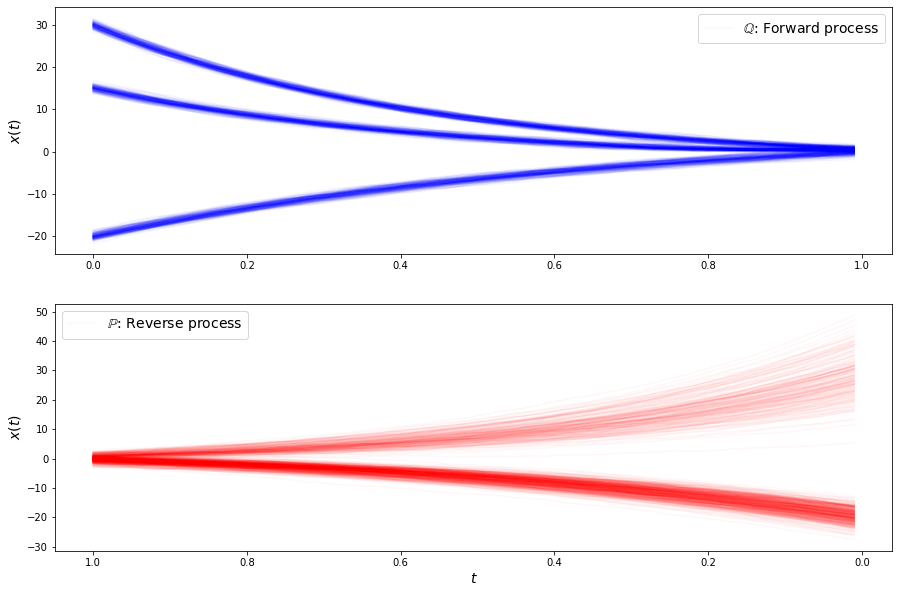

loss b 8.236274719238281
loss b 8.364219665527344
loss b 8.812788963317871
loss b 9.201412200927734
loss b 9.3401460647583
loss b 9.985403060913086
loss b 10.74654769897461
loss b 10.334485054016113
loss b 10.300224304199219
loss b 10.404040336608887
loss b 10.447348594665527
loss b 10.534841537475586
loss b 10.003880500793457
loss b 10.300682067871094
loss b 10.241117477416992
loss b 9.934151649475098
loss b 9.836509704589844
loss b 9.61667537689209
loss b 9.485474586486816
loss b 9.159475326538086
loss b 8.816045761108398
loss b 9.082716941833496
loss b 8.58410930633545
loss b 8.46161937713623
loss b 8.40720272064209
loss b 8.13172721862793
loss b 8.062544822692871
loss b 8.134173393249512
loss b 7.694604396820068
loss b 7.8736772537231445
loss f 0.9178069233894348
loss f 0.9395577311515808
loss f 0.8369580507278442
loss f 0.780410647392273
loss f 0.644747793674469
loss f 0.5432509779930115
loss f 0.5048346519470215
loss f 0.4115365743637085
loss f 0.3796842396259308
loss f 0.3951568

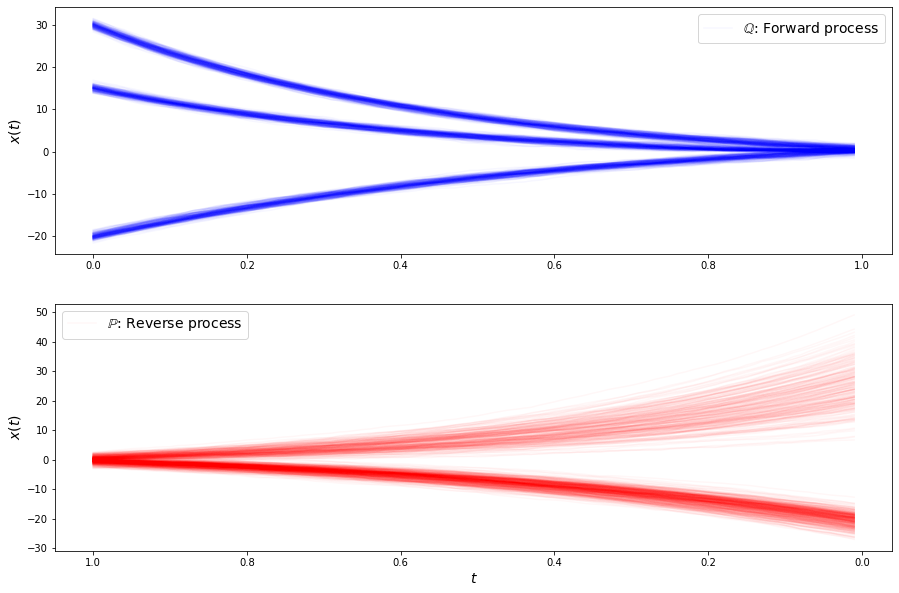

loss b 8.078187942504883
loss b 8.755363464355469
loss b 8.86172866821289
loss b 8.95811939239502
loss b 9.033740043640137
loss b 8.533441543579102
loss b 8.647360801696777
loss b 8.277050018310547
loss b 8.089492797851562
loss b 8.015434265136719
loss b 7.975754261016846
loss b 8.448410034179688
loss b 7.9173431396484375
loss b 8.024431228637695
loss b 7.858838081359863
loss b 8.309097290039062
loss b 8.14225959777832
loss b 8.267491340637207
loss b 8.15648365020752
loss b 8.418350219726562
loss b 8.388416290283203
loss b 8.122692108154297
loss b 8.397353172302246
loss b 8.008056640625
loss b 8.186055183410645
loss b 7.811553001403809
loss b 8.19146728515625
loss b 8.057202339172363
loss b 8.02059555053711
loss b 8.009182929992676
loss f 0.6790939569473267
loss f 0.593805193901062
loss f 0.526257336139679
loss f 0.5095280408859253
loss f 0.4840671420097351
loss f 0.5245717167854309
loss f 0.5122594833374023
loss f 0.537799060344696
loss f 0.5811160802841187
loss f 0.5585953593254089
l

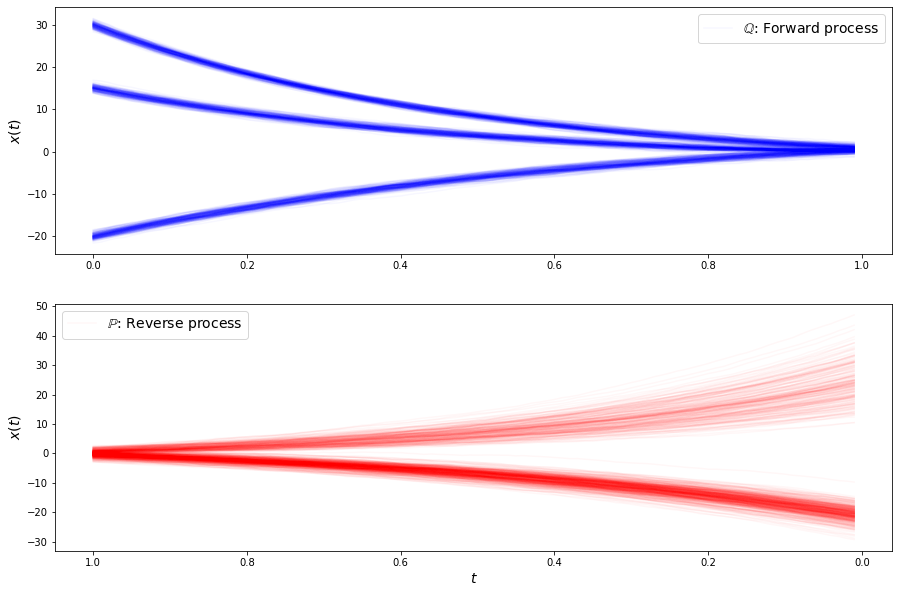

loss b 8.185731887817383
loss b 7.938169479370117
loss b 7.761666774749756
loss b 7.736202716827393
loss b 7.949154853820801
loss b 8.188969612121582
loss b 7.993231296539307
loss b 8.00991153717041
loss b 8.145323753356934
loss b 8.306071281433105
loss b 8.18695068359375
loss b 7.833217144012451
loss b 7.751795291900635
loss b 7.6164021492004395
loss b 7.991431713104248
loss b 7.6640167236328125
loss b 7.8750786781311035
loss b 7.907817840576172
loss b 7.960051536560059
loss b 8.048447608947754
loss b 7.909130096435547
loss b 7.803283214569092
loss b 7.917654037475586
loss b 7.83976411819458
loss b 7.665597915649414
loss b 8.004671096801758
loss b 7.69169807434082
loss b 7.890472412109375
loss b 7.622642993927002
loss b 7.916676998138428
loss f 0.6667831540107727
loss f 0.6375545859336853
loss f 0.6211182475090027
loss f 0.5883355140686035
loss f 0.6472721695899963
loss f 0.602916955947876
loss f 0.6260478496551514
loss f 0.6263212561607361
loss f 0.6305582523345947
loss f 0.591864466

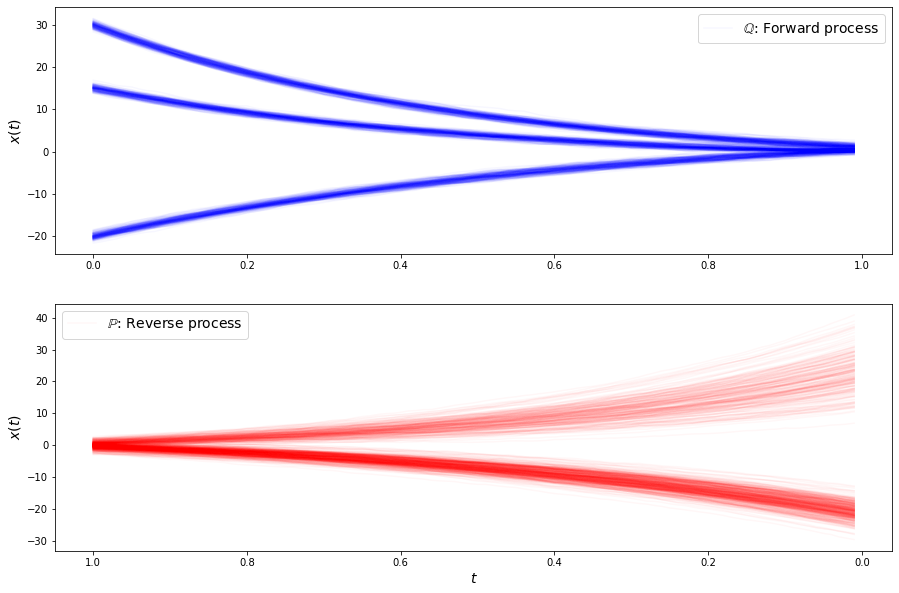

loss b 7.3893561363220215
loss b 8.196682929992676
loss b 7.891526222229004
loss b 7.869626522064209
loss b 7.806889533996582
loss b 8.068832397460938
loss b 7.7808918952941895
loss b 7.975220203399658
loss b 7.731621742248535
loss b 7.687049388885498
loss b 7.820000171661377
loss b 7.848027229309082
loss b 7.699745178222656
loss b 7.639561176300049
loss b 7.794309616088867
loss b 7.573343753814697
loss b 7.648519992828369
loss b 8.016916275024414
loss b 7.892487525939941
loss b 7.753011703491211
loss b 7.78225564956665
loss b 7.632033824920654
loss b 7.779959201812744
loss b 7.823071002960205
loss b 7.605938911437988
loss b 7.763919353485107
loss b 7.766427993774414
loss b 7.885074138641357
loss b 7.858046054840088
loss b 7.912717342376709
loss f 0.7649206519126892
loss f 0.7594409584999084
loss f 0.7322457432746887
loss f 0.7139090299606323
loss f 0.7375363111495972
loss f 0.7604368925094604
loss f 0.7206703424453735
loss f 0.7020469903945923
loss f 0.7489476799964905
loss f 0.734156

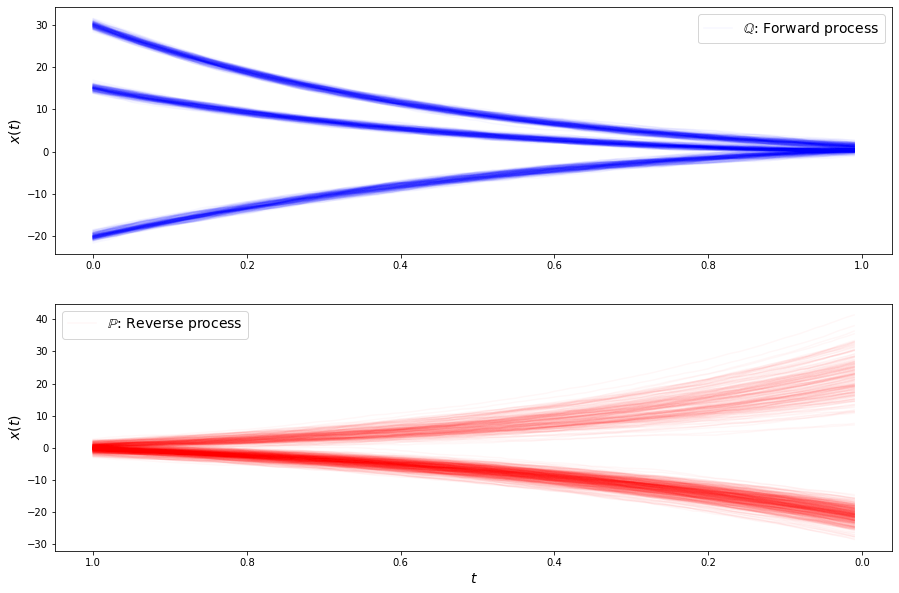

loss b 7.777054786682129
loss b 7.890872955322266
loss b 7.799622058868408
loss b 7.881549835205078
loss b 7.69330358505249
loss b 7.655997276306152
loss b 7.501349925994873
loss b 8.177340507507324
loss b 7.596059799194336
loss b 7.780694961547852
loss b 7.771736145019531
loss b 7.979059219360352
loss b 7.746591567993164
loss b 8.026366233825684
loss b 7.861304759979248
loss b 7.920620918273926
loss b 7.453490257263184
loss b 7.886767864227295
loss b 7.444754123687744
loss b 7.695548057556152
loss b 8.005843162536621
loss b 7.44494104385376
loss b 7.570606231689453
loss b 7.869897365570068
loss b 7.636208534240723
loss b 8.164796829223633
loss b 7.391043186187744
loss b 7.506082057952881
loss b 7.742192268371582
loss b 7.6005859375
loss f 0.6974573731422424
loss f 0.712275505065918
loss f 0.7113361358642578
loss f 0.6745966076850891
loss f 0.6736664175987244
loss f 0.6775617003440857
loss f 0.6277279257774353
loss f 0.6464667320251465
loss f 0.7268527150154114
loss f 0.674213826656341

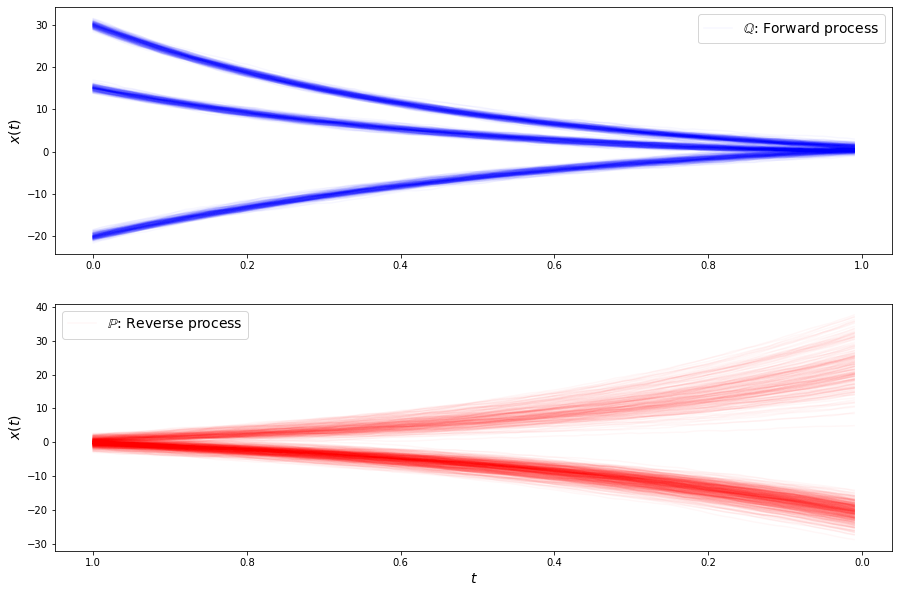

loss b 7.9096527099609375
loss b 7.556481838226318
loss b 7.596076488494873
loss b 7.723406791687012
loss b 7.517136573791504
loss b 7.770208835601807
loss b 7.874362468719482
loss b 8.059517860412598
loss b 7.749159812927246
loss b 7.9829936027526855
loss b 8.039750099182129
loss b 7.997997283935547
loss b 7.589875221252441
loss b 7.683891773223877
loss b 7.464756011962891
loss b 7.459460258483887
loss b 7.907421588897705
loss b 7.704124450683594
loss b 7.972558498382568
loss b 8.0972900390625
loss b 7.860992908477783
loss b 7.7848429679870605
loss b 7.68278694152832
loss b 7.662132740020752
loss b 7.659274101257324
loss b 7.787151336669922
loss b 7.785677909851074
loss b 7.755479335784912
loss b 8.0149564743042
loss b 7.9790472984313965
loss f 0.8001254200935364
loss f 0.8002572655677795
loss f 0.8139205574989319
loss f 0.7863404750823975
loss f 0.8034541606903076
loss f 0.6843393445014954
loss f 0.7346624732017517
loss f 0.7591672539710999
loss f 0.7990682125091553
loss f 0.75395554

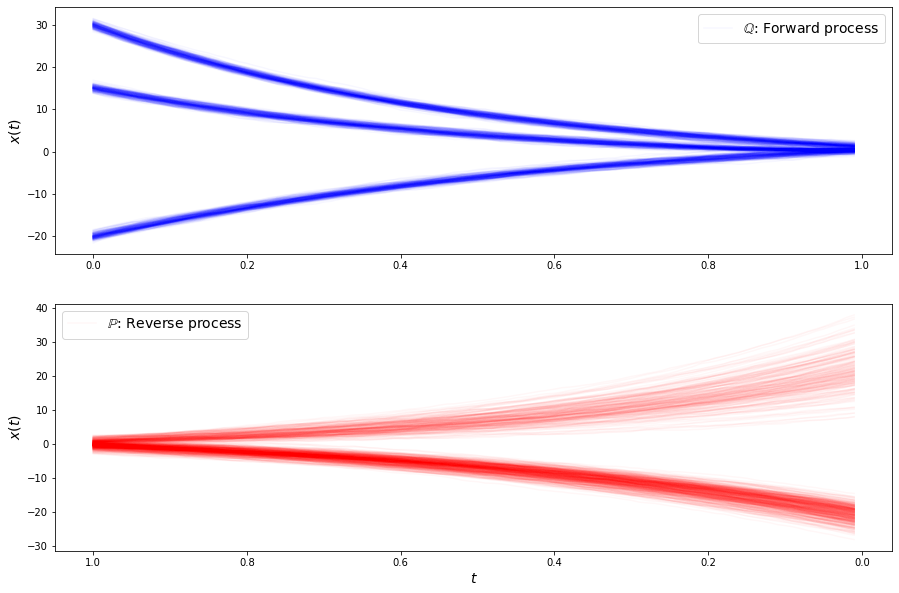

loss b 7.769532680511475
loss b 7.351224899291992
loss b 7.870722770690918
loss b 7.857672214508057
loss b 7.740390300750732
loss b 7.758184909820557
loss b 8.07964038848877
loss b 7.440366744995117
loss b 7.913090229034424
loss b 7.648397922515869
loss b 7.533879280090332
loss b 7.807227611541748
loss b 7.858762264251709
loss b 7.697553634643555
loss b 7.820052623748779
loss b 7.708739757537842
loss b 8.00442123413086
loss b 7.863801956176758
loss b 7.739988803863525
loss b 8.146333694458008
loss b 7.471449851989746
loss b 7.699377059936523
loss b 7.827401161193848
loss b 7.334947109222412
loss b 7.485264778137207
loss b 7.692608833312988
loss b 7.572587490081787
loss b 7.773140907287598
loss b 7.679244518280029
loss b 7.779611110687256
loss f 0.8336842656135559
loss f 0.8369947671890259
loss f 0.8368255496025085
loss f 0.8339948654174805
loss f 0.821316659450531
loss f 0.7859928011894226
loss f 0.8792244791984558
loss f 0.8256677985191345
loss f 0.8859930634498596
loss f 0.8094964623

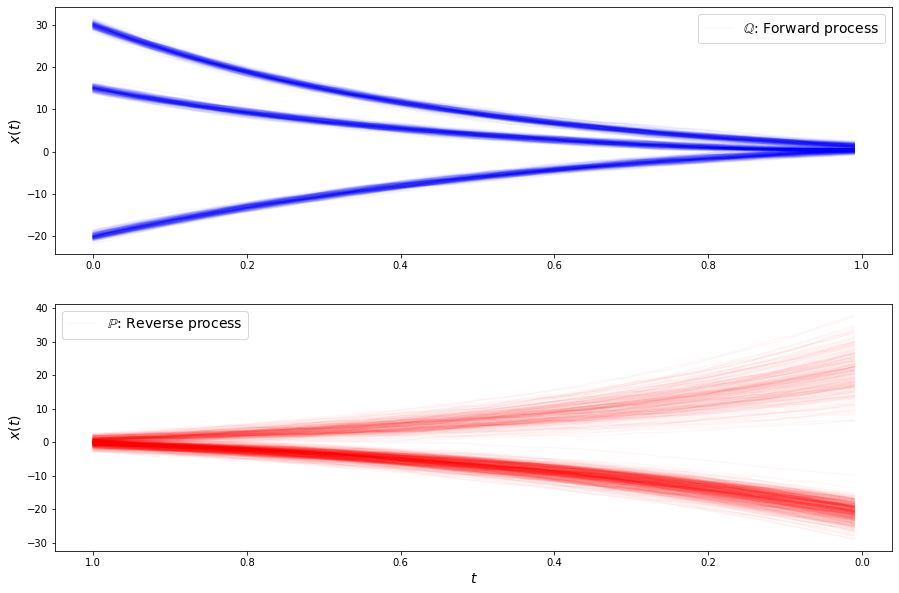

loss b 7.628300666809082
loss b 7.72912073135376
loss b 7.686127662658691
loss b 7.334712982177734
loss b 7.88379430770874
loss b 7.633747100830078
loss b 7.624998092651367
loss b 7.5505194664001465
loss b 7.849812030792236
loss b 7.395516872406006
loss b 7.5966477394104
loss b 7.626440048217773
loss b 7.981469631195068
loss b 7.837393760681152
loss b 7.633978366851807
loss b 7.8104352951049805
loss b 7.675738334655762
loss b 7.86757230758667
loss b 7.5465569496154785
loss b 7.814315319061279
loss b 7.338009834289551
loss b 7.471817970275879
loss b 7.830325603485107
loss b 7.810018539428711
loss b 7.654147148132324
loss b 7.829981327056885
loss b 7.608017444610596
loss b 7.940374851226807
loss b 7.6724748611450195
loss b 7.596780776977539
loss f 1.4715609550476074
loss f 1.3648344278335571
loss f 1.266035556793213
loss f 1.216293454170227
loss f 1.1887553930282593
loss f 1.2133352756500244
loss f 1.2220090627670288
loss f 1.274026870727539
loss f 1.2368810176849365
loss f 1.29188001155

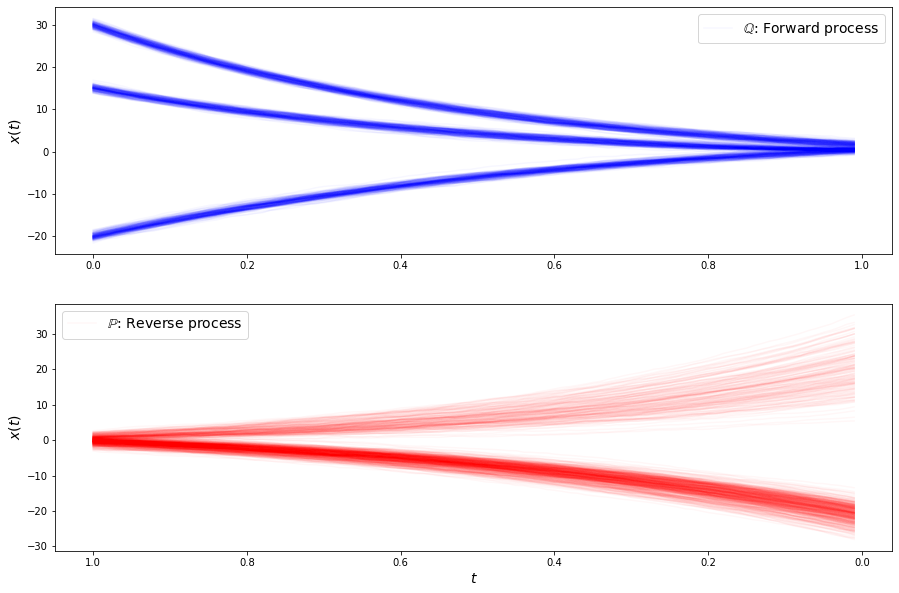

loss b 7.581099510192871
loss b 7.618388652801514
loss b 7.322981834411621
loss b 7.454374313354492
loss b 7.417306900024414
loss b 7.358117580413818
loss b 7.675687313079834
loss b 7.890526294708252
loss b 7.545668601989746
loss b 7.662328243255615
loss b 7.666018009185791
loss b 7.71085262298584
loss b 7.530444622039795
loss b 7.334026336669922
loss b 7.341208457946777
loss b 7.402666091918945
loss b 7.752955436706543
loss b 7.601416110992432
loss b 7.329828262329102
loss b 7.354770660400391
loss b 7.234350681304932
loss b 7.503051280975342
loss b 7.4151692390441895
loss b 7.802341461181641
loss b 7.357745170593262
loss b 7.272383213043213
loss b 7.564469337463379
loss b 7.613027095794678
loss b 7.682564735412598
loss b 7.384654998779297
loss f 1.29749596118927
loss f 1.3409572839736938
loss f 1.3229063749313354
loss f 1.3414418697357178
loss f 1.289217233657837
loss f 1.3155211210250854
loss f 1.2707449197769165
loss f 1.3025176525115967
loss f 1.2975068092346191
loss f 1.3785302639

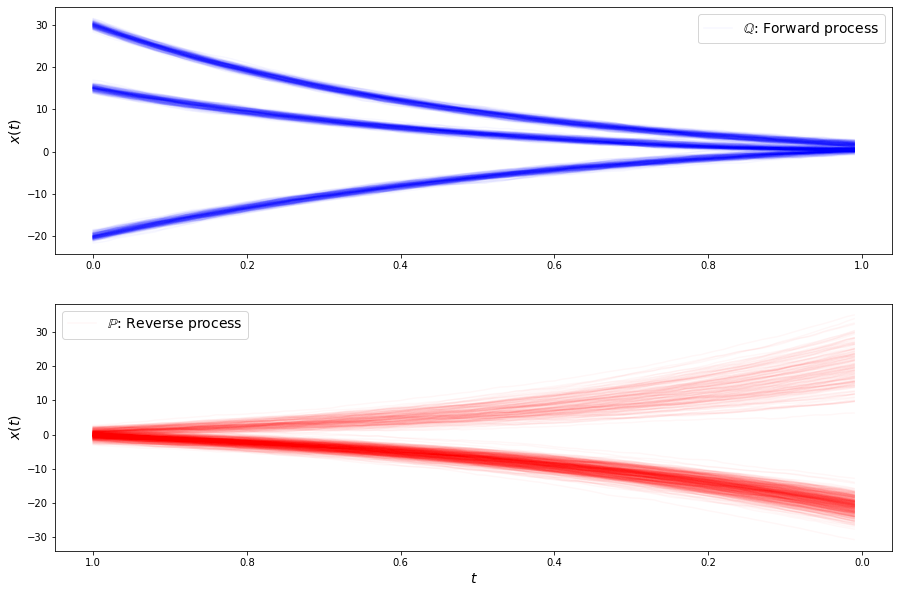

loss b 7.688786029815674
loss b 7.552521705627441
loss b 7.521515846252441
loss b 7.549242973327637
loss b 7.453472137451172
loss b 7.516285419464111
loss b 7.735596656799316
loss b 7.587265968322754
loss b 7.625715255737305
loss b 7.792177200317383
loss b 7.283486843109131
loss b 7.558557510375977
loss b 7.6742119789123535
loss b 7.6046223640441895
loss b 7.456446647644043
loss b 7.65264368057251
loss b 7.588997840881348
loss b 7.359328269958496
loss b 7.543473720550537
loss b 7.613710880279541
loss b 7.756314754486084
loss b 7.869619369506836
loss b 7.4548749923706055
loss b 7.711331844329834
loss b 7.432405471801758
loss b 7.384646415710449
loss b 7.707277297973633
loss b 7.58578634262085
loss b 7.4265666007995605
loss b 7.488386631011963
loss f 1.4727064371109009
loss f 1.5794329643249512
loss f 1.4865682125091553
loss f 1.4565191268920898
loss f 1.5306166410446167
loss f 1.4875378608703613
loss f 1.5401691198349
loss f 1.4611244201660156
loss f 1.5280258655548096
loss f 1.47022616

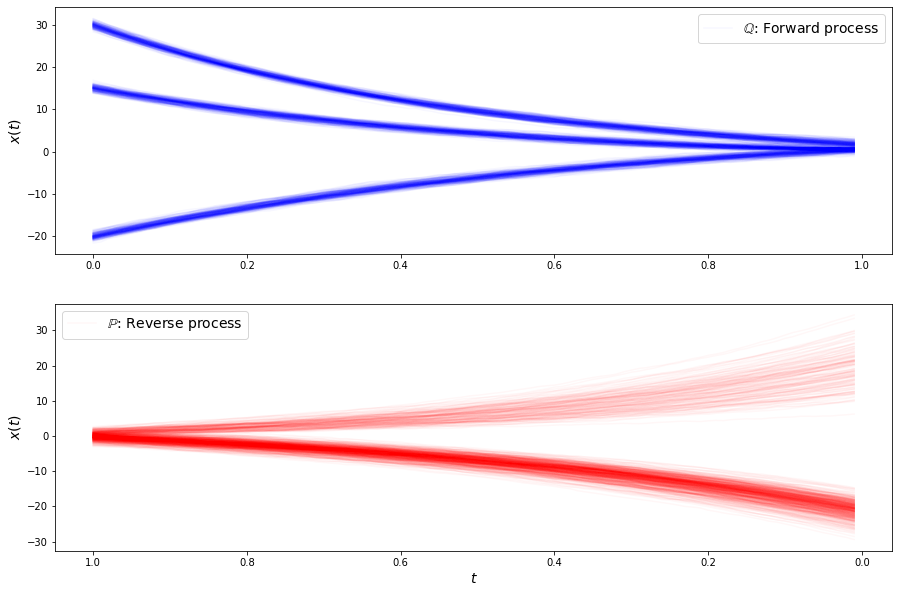

loss b 7.5205206871032715
loss b 7.383807182312012
loss b 7.396427154541016
loss b 7.214022159576416
loss b 7.399138927459717
loss b 7.463877201080322
loss b 7.3152618408203125
loss b 7.573150157928467
loss b 7.19519567489624
loss b 7.260847091674805
loss b 7.32138729095459
loss b 7.420806884765625
loss b 7.256821632385254
loss b 7.5040717124938965
loss b 7.309503555297852
loss b 7.312641620635986
loss b 7.508422374725342
loss b 7.49777364730835
loss b 7.433604717254639
loss b 7.491248607635498


In [ ]:
c.fit(1900, 30, burn_iterations=10, plot=True)

In [17]:
bb = lambda X, theta: -c.b_backward(X, theta)
t, Xts = c.sde_solver(X0=X1,dt=c.dt,  theta=c.theta_f,  beta=c.sigma, alfa=c.b_forward, N=c.number_time_steps)
t_, Xts_ = c.sde_solver(X0=X2, dt=c.dt,  theta=c.theta_b,  beta=c.sigma, alfa=bb, N=c.number_time_steps)

In [18]:
Xts.shape

(600, 100, 2)

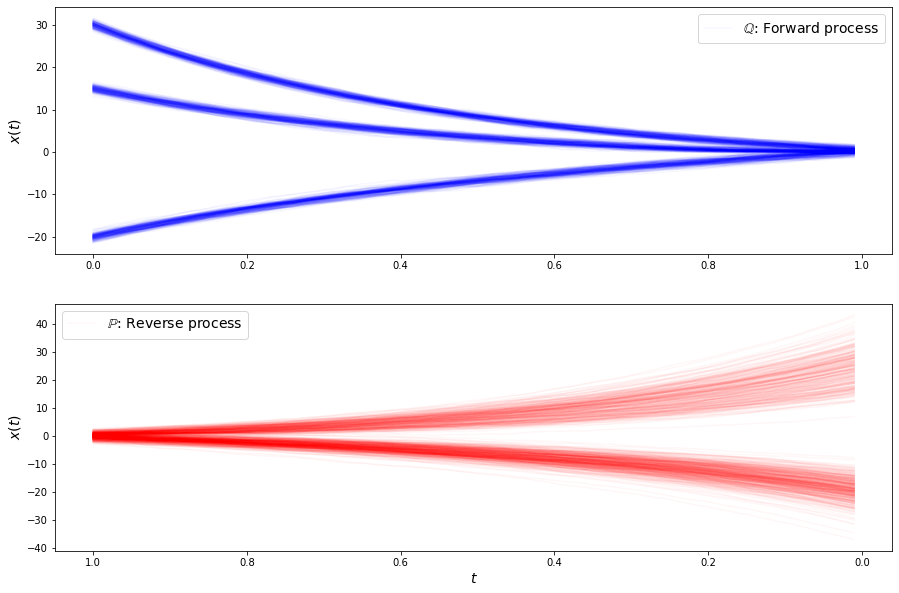

In [19]:
fn = 14
fig, axs = plt.subplots(2,1,  sharey=False, figsize=(15,10))
axs[1].set_xlabel("$t$", fontsize=fn)
axs[1].set_ylabel("$x(t)$", fontsize=fn)
axs[0].set_ylabel("$x(t)$", fontsize=fn)

tt = axs[1].get_xticks()
axs[1].set_xticks(tt.flatten() )
axs[1].set_xticklabels(list(map (lambda x: '{0:.1f}'.format((x)), tt))[::-1])

for i in range(n):
    label = "$\mathbb{Q}$: Forward process" if i == 0 else None
    axs[0].plot(t.flatten(), Xts[i,...,:-1].flatten(), 'b', alpha=0.03,  label=label)


for i in range(n):
    label = "$\mathbb{P}$: Reverse process" if i == 0 else None
    axs[1].plot(t_.flatten(), Xts_[i,...,:-1].flatten(), 'r', alpha=0.03, label=label)
    
axs[1].legend(fontsize=fn)
axs[0].legend(fontsize=fn)

plt.savefig("pig_0")

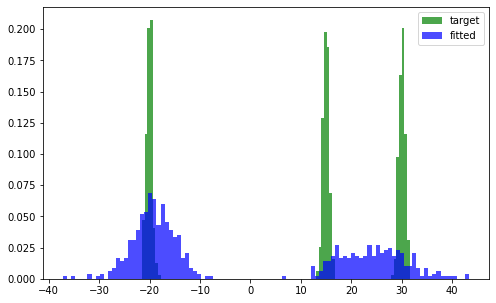

In [60]:
plt.figure(figsize=(8, 5))
bins = 100
plt.hist(( X1.flatten()), alpha=0.7, bins=bins, label="target", density=True, color="green");
plt.hist(( Xts_[:,-1,:-1].flatten()), alpha=0.7, bins=bins, label="fitted", density=True, color="blue");
plt.legend()

In [33]:
batch_terminal_empirical_f = next(c.data_stream(forward=True))

(1,)


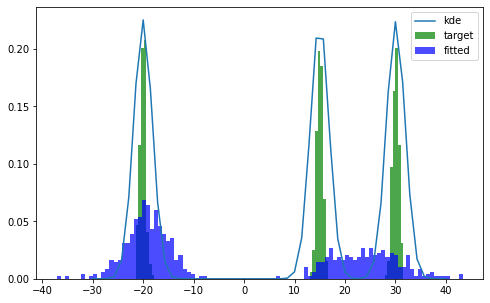

In [64]:
xx = np.linspace(-30, 40).reshape(-1,1)
plt.figure(figsize=(8, 5))
H = silverman_factor(batch_terminal_empirical_f)
kd  = np.exp(log_kde_pdf_per_point(xx, batch_terminal_empirical_f, H))
plt.plot(xx, kd, label="kde")
# plt.plot(batch_terminal_empirical_f , [0] * len(batch_terminal_empirical_f), ".")

bins = 100
plt.hist(( X1.flatten()), alpha=0.7, bins=bins, label="target", density=True, color="green");
plt.hist(( Xts_[:,-1,:-1].flatten()), alpha=0.7, bins=bins, label="fitted", density=True, color="blue");
plt.legend()

In [ ]:
batch_terminal_empirical_b = next(c.data_stream(False))

In [ ]:
xx = np.linspace(-10, 10).reshape(-1,1)

kd_b  = np.exp(log_kde_pdf_per_point(xx, batch_terminal_empirical_b, c.H_1))
plt.plot(xx, kd_b)
plt.plot(batch_terminal_empirical_b , [0] * len(batch_terminal_empirical_b), ".")

In [ ]:
    def plot_trajectories(self):
        bb = lambda X, theta: -self.b_backward(X, theta)
        t, Xts = c.sde_solver(
            X0=self.X1,dt=self.dt,  theta=self.theta_f,
            beta=self.sigma, alfa=self.b_forward, N=self.number_time_steps
        )
        t_, Xts_ = c.sde_solver(
            X0=self.X2, dt=self.dt,  theta=self.theta_b,
            beta=self.sigma, alfa=bb, N=self.number_time_steps
        )
        
        fn = 14
        fig, axs = plt.subplots(2,1,  sharey=False, figsize=(15,10))
        axs[1].set_xlabel("$t$", fontsize=fn)
        axs[1].set_ylabel("$x(t)$", fontsize=fn)
        axs[0].set_ylabel("$x(t)$", fontsize=fn)

        tt = axs[1].get_xticks()
        axs[1].set_xticks(tt.flatten() )
        axs[1].set_xticklabels(list(map (lambda x: '{0:.1f}'.format((x)), tt))[::-1])

        for i in range(n):
            label = "$\mathbb{Q}$: Forward process" if i == 0 else None
            axs[0].plot(t.flatten(), Xts[i,...].flatten(), 'b', alpha=0.03,  label=label)


        for i in range(n):
            label = "$\mathbb{P}$: Reverse process" if i == 0 else None
            axs[1].plot(t_.flatten(), Xts_[i,...].flatten(), 'r', alpha=0.03, label=label)

        axs[1].legend(fontsize=fn)
        axs[0].legend(fontsize=fn)

        plt.show()    